# TESTING.

Convolutional Autoencoder for finding deuterons and separating them from protons in the LArIAT data. 

Uses both planes: collection and induction. 

Found a numerical way to separate p/d.

In [8]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, random_split, Subset
from pytorch_msssim import ms_ssim

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from scipy.ndimage import zoom
from sklearn.model_selection import KFold

In [9]:
COL = '/Users/user/data/research/proton-deuteron/col&ind/col.pkl'                               # collection plane protons and deuterons
IND = '/Users/user/data/research/proton-deuteron/col&ind/ind.pkl'                               # induction plane matching clusters

masses = pd.read_csv('/Users/user/data/research/proton-deuteron/csv/picky+match.csv')           # BEAMLINE INFO. e.g. mass, if no. of particles = 1

col = pd.read_pickle(COL); 
ind = pd.read_pickle(IND)

col = pd.merge(
    col,
    masses[['run', 'subrun', 'event', 'p', 'm', 'beamline_mass']],
    on=['run', 'subrun', 'event'],
    how='left'
)

ind = pd.merge(
    ind,
    masses[['run', 'subrun', 'event', 'p', 'm', 'beamline_mass']],
    on=['run', 'subrun', 'event'],
    how='left'
)

print(ind.shape, col.shape)

(9199, 38) (9199, 38)


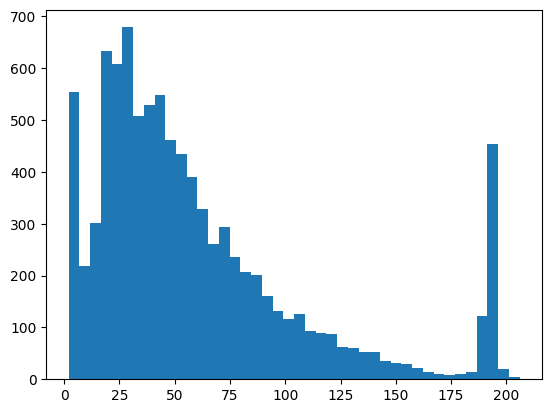

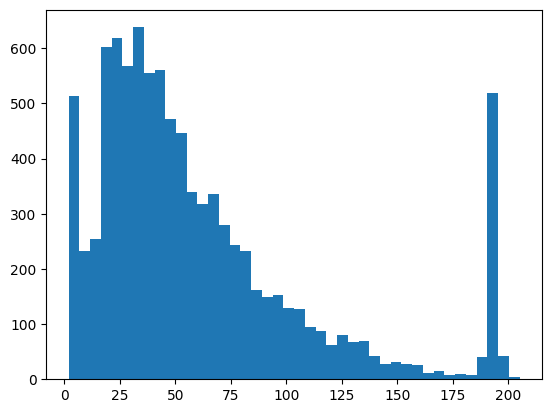

In [10]:
plt.hist(ind['height'], bins='auto'); plt.show()
plt.hist(col['height'], bins='auto'); plt.show()

In [11]:
maxes = col['column_maxes'].values                                                  # max ADC for each wire hit

normalised = []                               

for i, signal in enumerate(maxes):                                                  # normalise 0-1 per cluster using max
    
    minimum = 0
    maximum = np.max(signal)

    if maximum > minimum:
        normalised_signal = (signal - minimum) / (maximum - minimum)
    else:
        normalised_signal = np.zeros_like(signal, dtype=float)
        print(f'Error: Max not greater than min in signal {i}.')

    normalised.append(normalised_signal)

adcdiff = [np.diff(signal) for signal in normalised]                                # difference between consecutive hits
maxdiff = [np.max(diff) for diff in adcdiff]; col['maxdiff'] = maxdiff              # max ADC difference

In [12]:
maxes = ind['column_maxes'].values                                                  # for induction plane

normalised = []

for i, signal in enumerate(maxes):
    
    minimum = 0
    maximum = np.max(signal)

    if maximum > minimum:
        normalised_signal = (signal - minimum) / (maximum - minimum)
    else:
        normalised_signal = np.zeros_like(signal, dtype=float)
        print(f'Error: Max not greater than min in signal {i}.')

    normalised.append(normalised_signal)

adcdiff = [np.diff(signal) for signal in normalised]
maxdiff = [np.max(diff) for diff in adcdiff]; ind['maxdiff'] = maxdiff

In [13]:
removed_indices_col = col[~(col['maxdiff'] >= 0)].index
removed_indices_ind = ind[~(ind['maxdiff'] >= 0)].index

removed_indices = removed_indices_col.union(removed_indices_ind)

col = col[~col.index.isin(removed_indices)]; print(col.shape)
ind = ind[~ind.index.isin(removed_indices)]; print(ind.shape)

(9050, 39)
(9050, 39)


In [14]:
removed_indices_col = col[~((col['height'] < 240) & (col['width'] < 400))].index            # remove long and wide images
removed_indices_ind = ind[~((ind['height'] < 240) & (ind['width'] < 400))].index


removed_indices = removed_indices_col.union(removed_indices_ind)

col = col[~col.index.isin(removed_indices)]; print(col.shape)
ind = ind[~ind.index.isin(removed_indices)]; print(ind.shape)

(8304, 39)
(8304, 39)


In [15]:
def pad_image(image, target_wh=(1024, 240)):
    """
    Place a 2D image block in the centre of a zero canvas.

    image: 2D np.ndarray, shape (h, w)
    target_wh: (target_width, target_height)
    """
    target_w, target_h = target_wh
    canvas = np.zeros((target_h, target_w), dtype=image.dtype)

    h, w = image.shape
    
    v = int(np.argmax(image[0]))

    a = 512 - v
    
    # Compute top-left corner so image is centred
    y0 = 0
    x0 = a
    y1 = y0 + h
    x1 = x0 + w

    # Place the image block
    canvas[y0:y1, x0:x1] = image

    return canvas

In [16]:
def downsample_image(image, target_shape=(512, 40)):
    '''
    Reduce an image from original to target shape.
    '''
    scale_y = target_shape[1] / image.shape[0]
    scale_x = target_shape[0] / image.shape[1]
    return zoom(image, (scale_y, scale_x), order=1)  # order=1 for bilinear interpolation

In [17]:
# making the images for the CAE model

p_c = []
p_i = []

d_c = []
d_i = []

for idx, row in col[(col['particle_type'] == 'proton') & (col['height'] < 170)].iterrows():
    padded = pad_image(
        row['image_intensity'])
    p_c.append(padded)

for idx, row in ind[(ind['particle_type'] == 'proton') & (col['height'] < 170)].iterrows():
    padded = pad_image(
        row['image_intensity'])
    p_i.append(padded)

for idx, row in col[col['particle_type'] == 'deuteron'].iterrows():
    padded = pad_image(
        row['image_intensity'])
    d_c.append(padded)

for idx, row in ind[ind['particle_type'] == 'deuteron'].iterrows():
    padded = pad_image(
        row['image_intensity'])
    d_i.append(padded)

p_c = np.array(p_c)
p_i = np.array(p_i)

d_c = np.array(d_c)
d_i = np.array(d_i)

p_c_d = np.array([downsample_image(img, target_shape=(64, 64)) for img in p_c])
p_i_d = np.array([downsample_image(img, target_shape=(64, 64)) for img in p_i])

d_c_d = np.array([downsample_image(img, target_shape=(64, 64)) for img in d_c])
d_i_d = np.array([downsample_image(img, target_shape=(64, 64)) for img in d_i])

In [18]:
p_i_d.shape, p_c_d.shape, d_i_d.shape, d_c_d.shape

((5157, 64, 64), (5157, 64, 64), (3110, 64, 64), (3110, 64, 64))

In [19]:
protimages = np.stack([p_c, p_i], axis=1)
deutimages = np.stack([d_c, d_i], axis=1)       # deuteron images for plotting

In [20]:
p = np.stack([p_c_d, p_i_d], axis=1)            # shape: (N, 2, H, W)
d = np.stack([d_c_d, d_i_d], axis=1)            # shape: (N, 2, H, W)

p = torch.from_numpy(p).float()
d = torch.from_numpy(d).float()

In [21]:
class CAE(nn.Module):
    def __init__(self, input_hw=(240, 240), latent=8):
        super(CAE, self).__init__()
        in_h, in_w = input_hw
        assert in_h % 16 == 0 and in_w % 16 == 0, "input spatial dims must be divisible by 16"

        self.encoder = nn.Sequential(
            nn.Conv2d(2, 32, 5, stride=2, padding=2), nn.BatchNorm2d(32), nn.ReLU(),
            nn.Conv2d(32, 64, 5, stride=2, padding=2), nn.BatchNorm2d(64), nn.ReLU(),
            nn.Conv2d(64, 128, 5, stride=2, padding=2), nn.BatchNorm2d(128), nn.ReLU(),
            nn.Conv2d(128, 256, 5, stride=2, padding=2), nn.BatchNorm2d(256), nn.ReLU()
        )

        self.h_enc = in_h // 16
        self.w_enc = in_w // 16
        flat_size = 256 * self.h_enc * self.w_enc

        self.fc_enc = nn.Linear(flat_size, latent)
        self.fc_dec = nn.Linear(latent, flat_size)

        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(128), nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(64), nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(32), nn.ReLU(),
            nn.ConvTranspose2d(32, 2, 5, stride=2, padding=2, output_padding=1)  
        )

    def forward(self, x):
        enc = self.encoder(x)            # (B,256,H_enc,W_enc)
        z = enc.view(enc.size(0), -1)    # (B, flat_size)
        z = self.fc_enc(z)               # (B, latent)
        z = self.fc_dec(z)               # (B, flat_size)
        y = z.view(x.size(0), 256, self.h_enc, self.w_enc)  # (B,256,H_enc,W_enc)
        y = self.decoder(y)              # (B,H,W)
        return y

In [22]:
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Training device:", device)

X = torch.tensor(p, dtype=torch.float32)  # shape (N, 2, H, W)
n_splits = 5
kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)

epochs = 100
batch_size = 32

fold_train_losses, fold_val_losses = [], []
fold_REs = []
fold_REs_d_d = []

Training device: mps


/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_49002/457457524.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X = torch.tensor(p, dtype=torch.float32)  # shape (N, 2, H, W)


Training device: mps


/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_49002/777305348.py:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X = torch.tensor(p, dtype=torch.float32)


Epoch 001/100  Train=92.093660  Val=68.902639
Epoch 002/100  Train=54.875537  Val=46.666232
Epoch 003/100  Train=42.443315  Val=39.232406
Epoch 004/100  Train=37.046704  Val=34.902611
Epoch 005/100  Train=33.516732  Val=32.829288
Epoch 006/100  Train=30.804000  Val=29.518696
Epoch 007/100  Train=27.628747  Val=27.353855
Epoch 008/100  Train=25.654610  Val=25.084957
Epoch 009/100  Train=23.694982  Val=24.598579
Epoch 010/100  Train=22.142594  Val=22.834387
Epoch 011/100  Train=21.373134  Val=21.641625
Epoch 012/100  Train=20.255209  Val=21.466837
Epoch 013/100  Train=19.246694  Val=19.850498
Epoch 014/100  Train=18.185121  Val=19.575629
Epoch 015/100  Train=17.231679  Val=18.570005
Epoch 016/100  Train=16.206679  Val=17.908756
Epoch 017/100  Train=15.495049  Val=17.128005
Epoch 018/100  Train=15.372489  Val=16.435344
Epoch 019/100  Train=14.124995  Val=16.199285
Epoch 020/100  Train=13.828377  Val=15.557694
Epoch 021/100  Train=13.458308  Val=16.173414
Epoch 022/100  Train=13.246999  Va

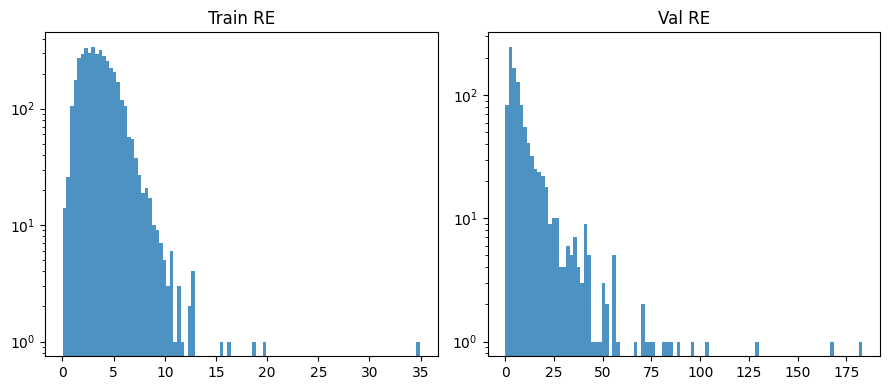

Unseen latents: (3110, 16)


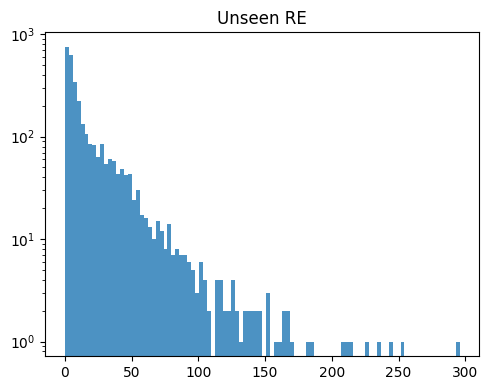

In [23]:
import torch, numpy as np, matplotlib.pyplot as plt
from torch import nn
from torch.utils.data import DataLoader, Subset

torch.manual_seed(42)
device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
print("Training device:", device)

X = torch.tensor(p, dtype=torch.float32)
N, C, H, W = X.shape
assert (H, W) == (64, 64)

val_ratio = 0.2
perm = torch.randperm(N)
n_val = int(val_ratio * N)
val_idx = perm[:n_val]
train_idx = perm[n_val:]

train_subset = Subset(X, train_idx)
val_subset   = Subset(X, val_idx)

batch_size = 32
train_loader = DataLoader(train_subset, batch_size=batch_size, shuffle=True, drop_last=False)
val_loader   = DataLoader(val_subset,   batch_size=batch_size, shuffle=False, drop_last=False)


model = CAE(input_hw=(64, 64), latent=16).to(device)
loss_fn = nn.MSELoss()
optim   = torch.optim.Adam(model.parameters(), lr=1e-3, weight_decay=1e-4)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optim, factor=0.5, patience=10)

epochs = 100
best_val = float('inf')
best_state = None
patience = 20
no_improve = 0
train_losses, val_losses = [], []

for ep in range(1, epochs+1):
    model.train()
    train_loss = 0.0
    for xb in train_loader:
        xb = xb.to(device)
        optim.zero_grad()
        preds = model(xb)
        loss = loss_fn(preds, xb)
        loss.backward()
        optim.step()
        train_loss += loss.item()
    train_loss /= max(1, len(train_loader))

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for xb in val_loader:
            xb = xb.to(device)
            preds = model(xb)
            loss = loss_fn(preds, xb)
            val_loss += loss.item()
    val_loss /= max(1, len(val_loader))

    scheduler.step(val_loss)
    train_losses.append(train_loss)
    val_losses.append(val_loss)
    print(f"Epoch {ep:03d}/{epochs}  Train={train_loss:.6f}  Val={val_loss:.6f}")

    if val_loss < best_val - 1e-6:
        best_val = val_loss
        best_state = {k: v.cpu().clone() for k, v in model.state_dict().items()}
        no_improve = 0
    else:
        no_improve += 1
        if no_improve >= patience:
            print(f"Early stopping at epoch {ep}")
            break

if best_state is not None:
    model.load_state_dict(best_state)
model = model.to(device).eval()

@torch.no_grad()
def recon_latent_RE(model, dataset, batch_size=64, device=device):
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    lat_dim = model.fc_enc.out_features
    n = len(dataset)
    recon = np.empty((n, 2, H, W), dtype=np.float32)
    lat   = np.empty((n, lat_dim), dtype=np.float32)
    i0 = 0
    for xb in loader:
        xb = xb.to(device)
        yb = model(xb)
        # latents before fc_dec
        enc = model.encoder(xb)
        z   = model.fc_enc(enc.flatten(1))
        b = xb.size(0)
        recon[i0:i0+b] = yb.detach().cpu().numpy()
        lat[i0:i0+b]   = z.detach().cpu().numpy()
        i0 += b
        if device.type == "mps":
            try: torch.mps.empty_cache()
            except Exception: pass
    RE = ((recon - torch.stack([dataset[i] for i in range(len(dataset))]).numpy())**2).mean(axis=(1,2,3))
    return recon, lat, RE

recon_tr, lat_tr, RE_tr = recon_latent_RE(model, train_subset, batch_size=64, device=device)
recon_va, lat_va, RE_va = recon_latent_RE(model, val_subset,   batch_size=64, device=device)

print("Train latents:", lat_tr.shape, "Val latents:", lat_va.shape)

plt.figure(figsize=(9,4))
plt.subplot(1,2,1); plt.hist(RE_tr, bins=100, alpha=0.8); plt.yscale('log'); plt.title("Train RE")
plt.subplot(1,2,2); plt.hist(RE_va, bins=100, alpha=0.8); plt.yscale('log'); plt.title("Val RE")
plt.tight_layout(); plt.show()

Xd_np = d.cpu().numpy() if torch.is_tensor(d) else np.array(d, dtype=np.float32)
Nd = Xd_np.shape[0]
unseen_subset = Subset(torch.tensor(Xd_np, dtype=torch.float32), range(Nd))
recon_d, lat_d, RE_d = recon_latent_RE(model, unseen_subset, batch_size=64, device=device)

print("Unseen latents:", lat_d.shape)

plt.figure(figsize=(5,4))
plt.hist(RE_d, bins=100, alpha=0.8); plt.yscale('log'); plt.title("Unseen RE")
plt.tight_layout(); plt.show()

# ---- 6) Save artefacts (optional) ----
# torch.save(model.state_dict(), "CAE_best.pt")
# np.save("latents_train.npy", lat_tr); np.save("latents_val.npy", lat_va); np.save("latents_d.npy", lat_d)
# np.save("RE_train.npy", RE_tr); np.save("RE_val.npy", RE_va); np.save("RE_d.npy", RE_d)
# np.save("recon_train.npy", recon_tr); np.save("recon_val.npy", recon_va); np.save("recon_d.npy", recon_d)

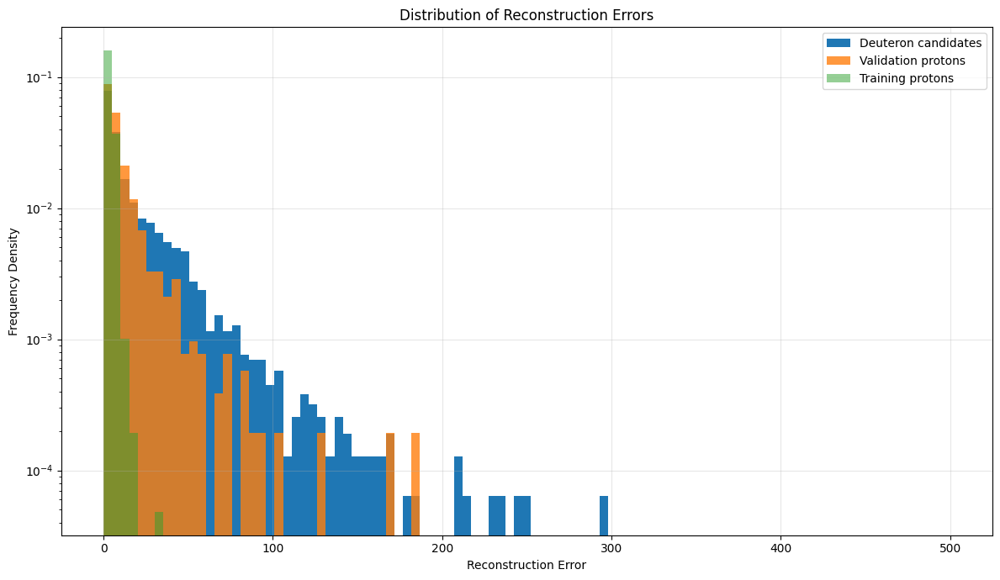

In [55]:
plt.figure(figsize=(12, 7))

bins = np.linspace(0, 500, 100)

plt.hist(RE_d, bins=bins, alpha=1, label='Deuteron candidates', density=True)
plt.hist(RE_va, bins=bins, alpha=0.8, label='Validation protons', density=True)
plt.hist(RE_tr, bins=bins, alpha=0.5, label='Training protons', density=True)

plt.xlabel("Reconstruction Error")
plt.ylabel("Frequency Density")
plt.title("Distribution of Reconstruction Errors")
plt.grid(True, alpha=0.3)
plt.yscale('log')
# plt.xlim(0, 300)
plt.legend()
plt.tight_layout()
plt.savefig('RE.png', dpi=1000)
plt.show()

In [56]:
import torch, numpy as np, matplotlib.pyplot as plt
from torch import nn
from torch.utils.data import DataLoader, Subset
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors
from sklearn.covariance import LedoitWolf

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
model.eval().to(device)

# Data loaders
bs_eval = 128
train_loader_eval = DataLoader(train_subset, batch_size=bs_eval, shuffle=False)
val_loader_eval   = DataLoader(val_subset,   batch_size=bs_eval, shuffle=False)

@torch.no_grad()
def encode(model, xb):
    """xb: (B,2,H,W) -> z: (B,L)"""
    e = model.encoder(xb)
    z = model.fc_enc(e.flatten(1))
    return z

@torch.no_grad()
def decode(model, z):
    """z: (B,L) -> y: (B,2,H,W)"""
    y = model.fc_dec(z)
    y = y.view(z.size(0), 256, model.h_enc, model.w_enc)
    y = model.decoder(y)
    return y

def stack_dataset(ds, device):
    """Stack a Subset/Dataset into one tensor on device."""
    X = torch.stack([ds[i] for i in range(len(ds))]).to(device)
    return X  # (N,2,H,W)

def standardise_train_only(Z_train):
    """Return stdzd Z for train/val/unseen using train mean/std."""
    mu = Z_train.mean(0, keepdims=True)
    sd = Z_train.std(0, keepdims=True).clamp_min(1e-6)
    def stdzd(Z): return (Z - mu)/sd
    return stdzd, mu.squeeze(0), sd.squeeze(0)

def show_triptych(t, title=None):
    """t: (1,2,H,W); display ch0, ch1, ch0-ch1."""
    t = t.detach().cpu()[0]
    a,b = t[0], t[1]
    mats = [a, b, a-b]
    plt.figure(figsize=(6,2))
    for i,m in enumerate(mats):
        ax = plt.subplot(1,3,i+1)
        ax.imshow(m, interpolation='nearest')
        ax.axis('off')
    if title: plt.suptitle(title)
    plt.tight_layout(); plt.show()


In [57]:
@torch.no_grad()
def recon_latent_RE_full(model, loader, device):
    Z_list, Y_list, X_list = [], [], []
    for xb in loader:
        xb = xb.to(device)
        zb = encode(model, xb)          # (B,L)
        yb = decode(model, zb)          # (B,2,H,W)
        Z_list.append(zb.cpu())
        Y_list.append(yb.cpu())
        X_list.append(xb.cpu())
        if device.type == "mps":
            try: torch.mps.empty_cache()
            except Exception: pass
    Z = torch.cat(Z_list, 0)            # (N,L)
    Y = torch.cat(Y_list, 0)            # (N,2,H,W)
    X = torch.cat(X_list, 0)            # (N,2,H,W)
    RE = ((Y - X)**2).mean(dim=(1,2,3)) # (N,)
    return X, Y, Z, RE

Xtr, Ytr, Ztr, RE_tr = recon_latent_RE_full(model, train_loader_eval, device)
Xva, Yva, Zva, RE_va = recon_latent_RE_full(model, val_loader_eval,   device)
Nv, L = Zva.shape[0], Zva.shape[1]
H, W = Xva.shape[-2], Xva.shape[-1]

print("Train:", Xtr.shape, Ztr.shape, RE_tr.shape)
print("Val:  ", Xva.shape, Zva.shape, RE_va.shape)

# Unseen set d
Xd_np = d.cpu().numpy() if torch.is_tensor(d) else np.array(d, dtype=np.float32)
unseen_ds = Subset(torch.tensor(Xd_np, dtype=torch.float32), range(Xd_np.shape[0]))
unseen_loader = DataLoader(unseen_ds, batch_size=bs_eval, shuffle=False)
Xd, Yd, Zd, RE_d = recon_latent_RE_full(model, unseen_loader, device)
print("Unseen:", Xd.shape, Zd.shape, RE_d.shape)


Train: torch.Size([4126, 2, 64, 64]) torch.Size([4126, 16]) torch.Size([4126])
Val:   torch.Size([1031, 2, 64, 64]) torch.Size([1031, 16]) torch.Size([1031])
Unseen: torch.Size([3110, 2, 64, 64]) torch.Size([3110, 16]) torch.Size([3110])


Latent σ (train): [22.471599578857422, 19.26129913330078, 21.556400299072266, 22.760099411010742, 20.992000579833984, 21.757200241088867, 19.311399459838867, 19.78580093383789, 20.554500579833984, 28.263599395751953, 20.230300903320312, 17.11949920654297, 19.427900314331055, 19.96820068359375, 22.027700424194336, 24.077800750732422]
Mean |off-diag corr| on protons: 0.183
Proton PCA variance (top 8): [0.206 0.165 0.137 0.096 0.089 0.065 0.05  0.044]


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: divide by zero encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: overflow encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: invalid value encountered in matmul
  C = X.T @ X


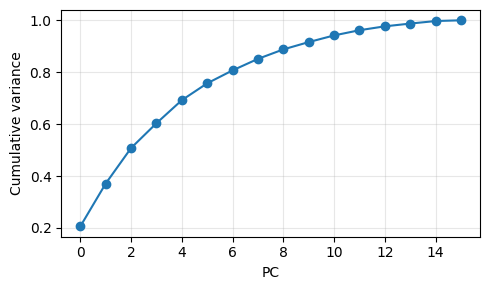

In [58]:
Ztr_t = Ztr.float(); Zva_t = Zva.float(); Zd_t = Zd.float()
stdzd, Zmu, Zsd = standardise_train_only(Ztr_t)
Ztr_s = stdzd(Ztr_t).numpy()
Zva_s = stdzd(Zva_t).numpy()
Zd_s  = stdzd(Zd_t ).numpy()

print("Latent σ (train):", Zsd.numpy().round(4).tolist())

# Correlations on protons
corr = np.corrcoef(Ztr_s, rowvar=False)
offdiag = corr - np.eye(L)
print("Mean |off-diag corr| on protons:", np.mean(np.abs(offdiag)).round(4))

# PCA spectrum
pca = PCA().fit(Ztr_s)
print("Proton PCA variance (top 8):", np.round(pca.explained_variance_ratio_[:8], 3))
plt.figure(figsize=(5,3))
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o')
plt.xlabel("PC"); plt.ylabel("Cumulative variance"); plt.grid(True, alpha=0.3)
plt.tight_layout(); plt.show()

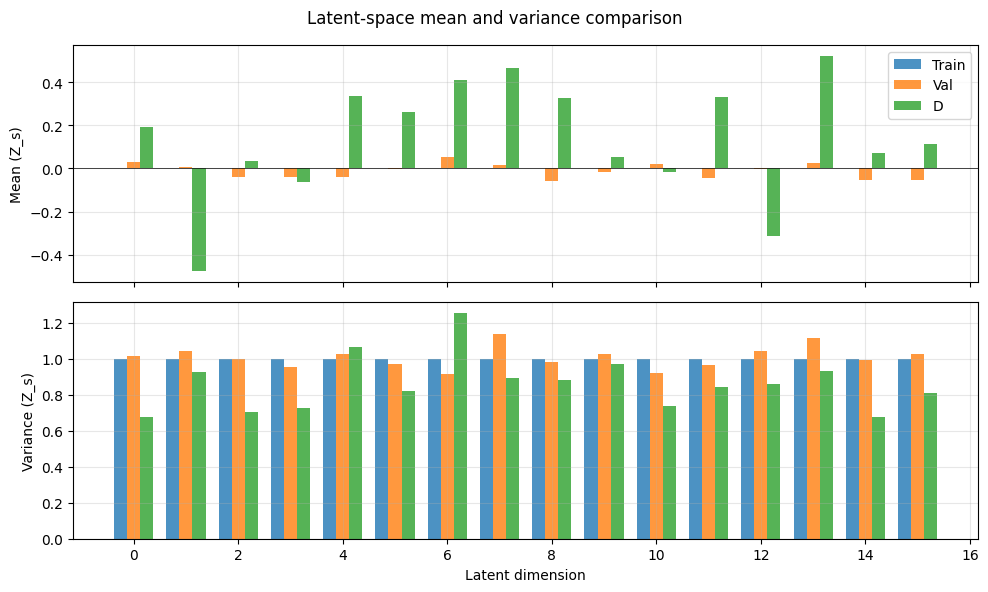

In [59]:
L = Ztr_s.shape[1]

stats = {
    "Train": (Ztr_s.mean(axis=0), Ztr_s.var(axis=0)),
    "Val":   (Zva_s.mean(axis=0), Zva_s.var(axis=0)),
    "D":     (Zd_s.mean(axis=0),  Zd_s.var(axis=0))
}

dims = np.arange(L)
width = 0.25

fig, axs = plt.subplots(2, 1, figsize=(10, 6), sharex=True)

# --- means ---
axs[0].bar(dims - width, stats["Train"][0], width, label="Train", alpha=0.8)
axs[0].bar(dims,         stats["Val"][0],   width, label="Val", alpha=0.8)
axs[0].bar(dims + width, stats["D"][0],     width, label="D",   alpha=0.8)
axs[0].axhline(0, color='k', lw=0.5)
axs[0].set_ylabel("Mean (Z_s)")
axs[0].legend()
axs[0].grid(alpha=0.3)

# --- variances ---
axs[1].bar(dims - width, stats["Train"][1], width, label="Train", alpha=0.8)
axs[1].bar(dims,         stats["Val"][1],   width, label="Val", alpha=0.8)
axs[1].bar(dims + width, stats["D"][1],     width, label="D",   alpha=0.8)
axs[1].set_ylabel("Variance (Z_s)")
axs[1].set_xlabel("Latent dimension")
axs[1].grid(alpha=0.3)

plt.suptitle("Latent-space mean and variance comparison")
plt.tight_layout()
plt.show()

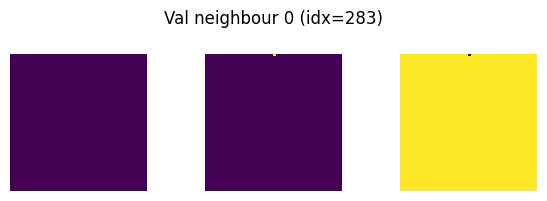

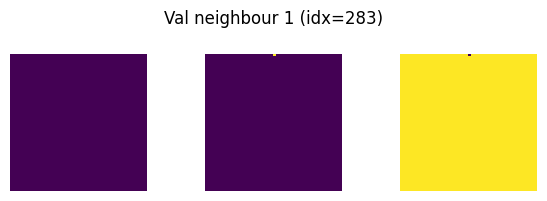

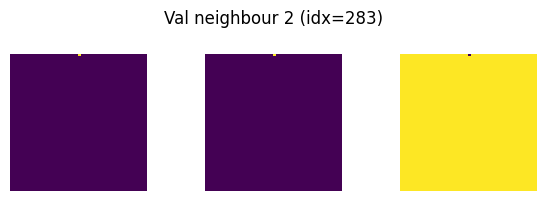

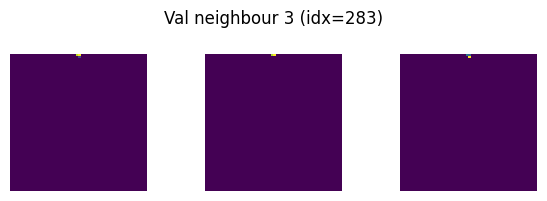

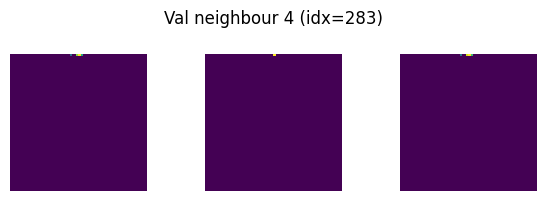

...

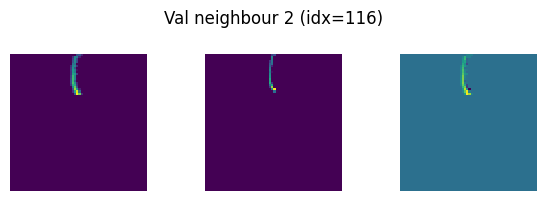

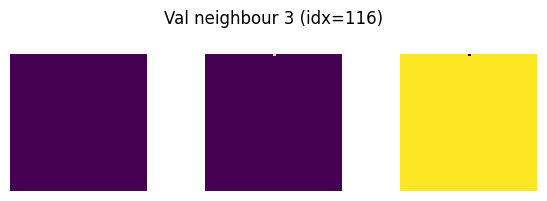

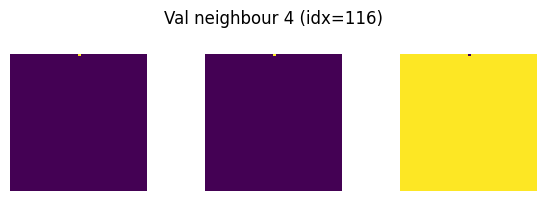

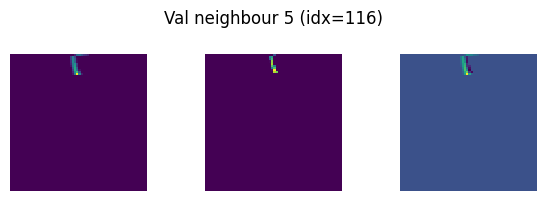

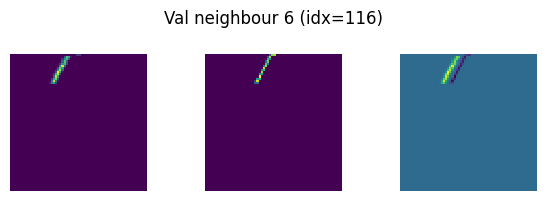

In [60]:
nbrs = NearestNeighbors(n_neighbors=6, metric='euclidean').fit(Zva_s)

# Choose three queries by RE: best, median, worst
REv_np = RE_va.numpy()
idx_best   = int(np.argmin(REv_np))
idx_worst  = int(np.argmax(REv_np))
idx_median = int(np.argsort(REv_np)[len(REv_np)//2])

def show_neighbours(idx):
    _, nn_idx = nbrs.kneighbors(Zva_s[idx:idx+1], return_distance=True)
    imgs = [Xva[idx:idx+1].to(device)]
    imgs += [Xva[j:j+1].to(device) for j in nn_idx[0]]
    for k,t in enumerate(imgs):
        show_triptych(t, title=f"Val neighbour {k} (idx={idx})")

for q in [idx_best, idx_median, idx_worst]:
    show_neighbours(q)


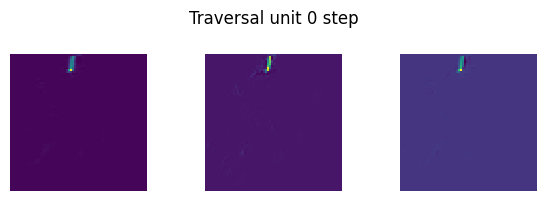

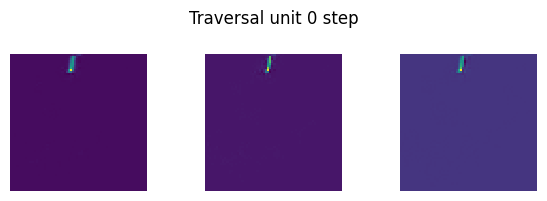

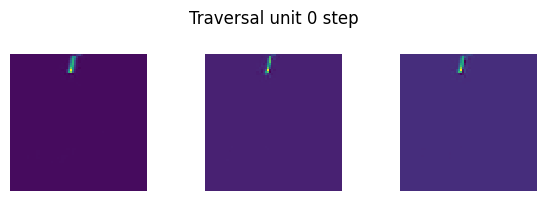

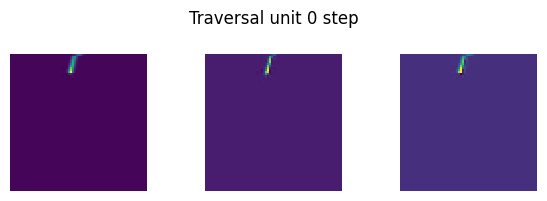

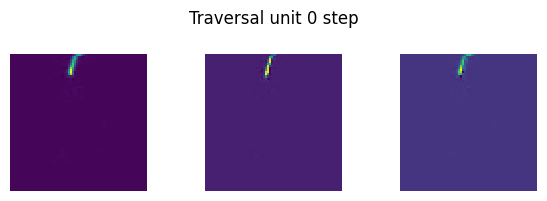

...

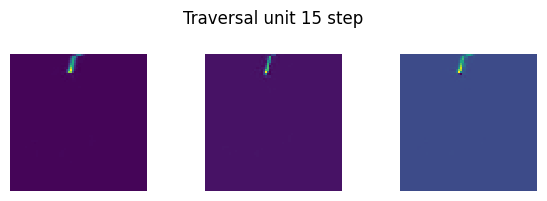

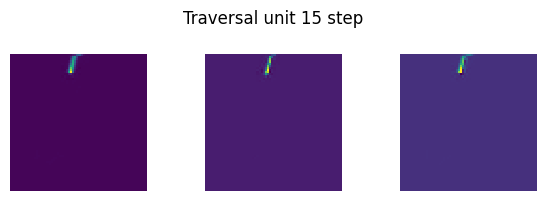

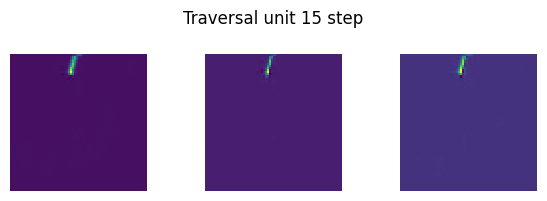

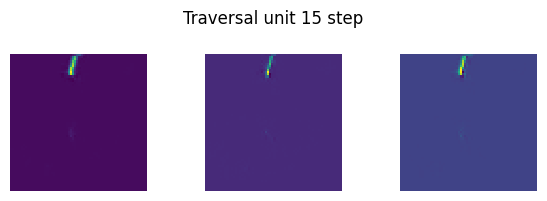

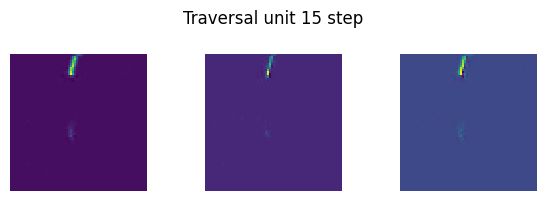

In [61]:
@torch.no_grad()
def traverse_unit(model, x0, i, Zsd, span=3.0, steps=7):
    z0 = encode(model, x0)                      # (1,L)
    alphas = torch.linspace(-span, span, steps, device=x0.device)
    outs = []
    for a in alphas:
        z = z0.clone()
        z[:, i] = z0[:, i] + a*Zsd[i].to(z.device)
        outs.append(decode(model, z))
    return outs

# Reference = median RE proton
ref = Xva[idx_median:idx_median+1].to(device)
Zsd_t = Zsd.to(device)

# Run for all units or a subset
for i in range(L):
    outs = traverse_unit(model, ref, i, Zsd_t, span=3.0, steps=7)
    # Show channel 0,1, and diff for each step
    for t in outs: show_triptych(t, title=f"Traversal unit {i} step")


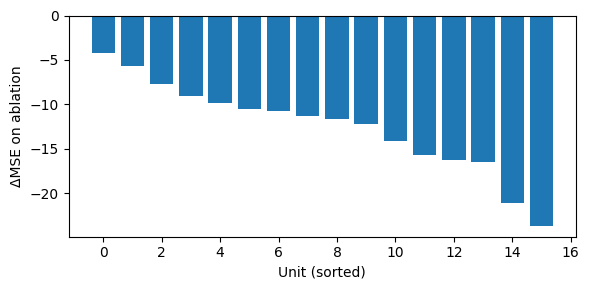

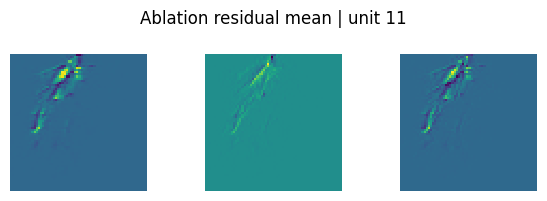

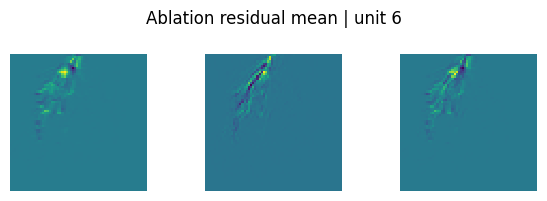

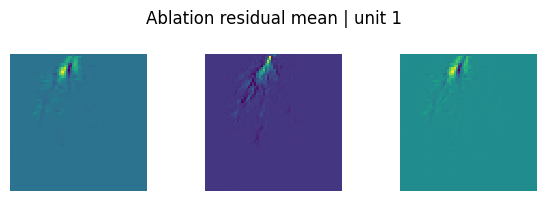

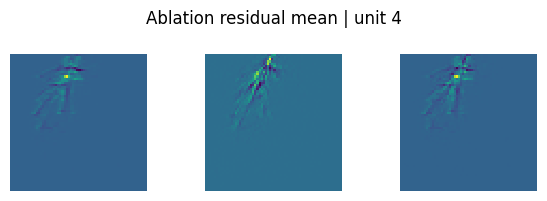

...

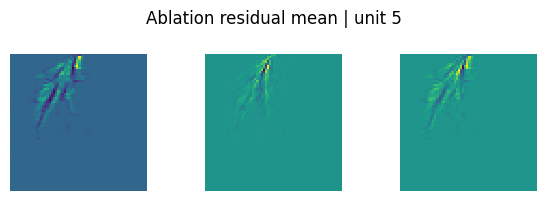

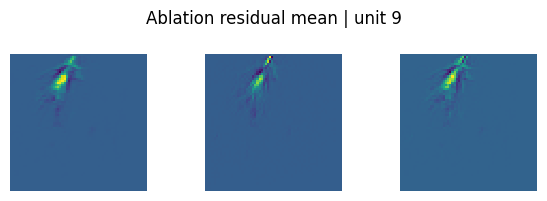

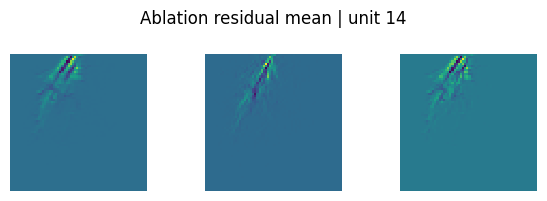

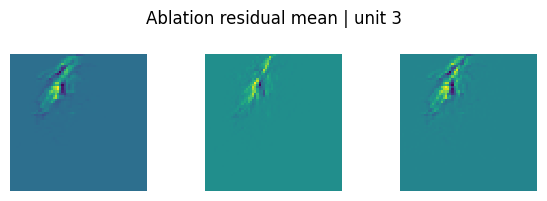

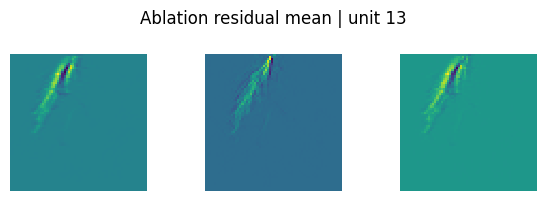

In [62]:
@torch.no_grad()
def ablate_unit_batch(model, Xb, i, Zmu_i):
    z = encode(model, Xb)                      # (B,L)
    y_full = decode(model, z)                  # (B,2,H,W)
    z_abl = z.clone(); z_abl[:, i] = Zmu_i.to(z.device)
    y_abl = decode(model, z_abl)
    dloss = ((y_full - Xb)**2).mean(dim=(1,2,3)) - ((y_abl - Xb)**2).mean(dim=(1,2,3))
    resid = (y_full - y_abl)                  # (B,2,H,W)
    return dloss.cpu(), resid.cpu()

# Use a random proton batch
idxs = torch.randperm(Nv)[:min(128, Nv)]
Xb = Xva[idxs].to(device)

mean_dloss = []
mean_resid = []
for i in range(L):
    dloss, resid = ablate_unit_batch(model, Xb, i, Zmu[i])
    mean_dloss.append(dloss.mean().item())
    mean_resid.append(resid.mean(dim=0, keepdim=True))  # (1,2,H,W)

order = np.argsort(mean_dloss)[::-1]
plt.figure(figsize=(6,3)); plt.bar(range(L), np.array(mean_dloss)[order])
plt.xlabel("Unit (sorted)"); plt.ylabel("ΔMSE on ablation"); plt.tight_layout(); plt.show()

# Visualise top-5 residual means
for j in range(min(15, L)):
    i = int(order[j])
    show_triptych(mean_resid[i], title=f"Ablation residual mean | unit {i}")

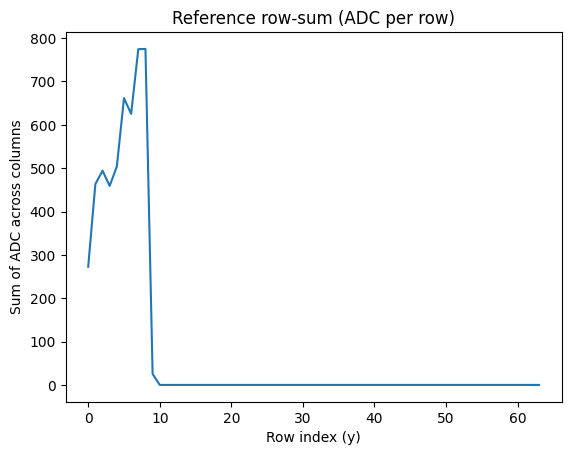

In [63]:
x0 = Xva[idx_median:idx_median+1].to(device)  # (1, 2, H, W)

# Example: channel 0
row_sums_ref = x0[0, 0].sum(axis=1).cpu().numpy()  # (H,)
plt.plot(row_sums_ref)
plt.title("Reference row-sum (ADC per row)")
plt.xlabel("Row index (y)")
plt.ylabel("Sum of ADC across columns")
plt.show()


In [64]:
@torch.no_grad()
def traverse_row_sums(model, x0, i, Zsd, span=3.0, steps=7, use_abs=True):
    z0 = encode(model, x0)
    alphas = torch.linspace(-span, span, steps, device=x0.device)
    row_sums_list = []
    for a in alphas:
        z = z0.clone()
        z[:, i] = z0[:, i] + a * Zsd[i]
        y = decode(model, z)  # (1,2,H,W)
        y_use = y.abs() if use_abs else y
        row_sums = y_use[0, 0].sum(axis=1).cpu().numpy()  # channel 0 only
        row_sums_list.append(row_sums)
    return alphas.cpu().numpy(), row_sums_list


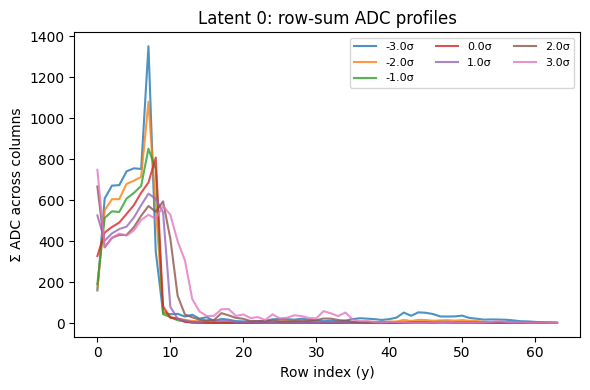

In [65]:
i = 0  # choose latent dimension
alphas, row_sums_list = traverse_row_sums(model, x0, i, Zsd.to(device), span=3.0, steps=7)

plt.figure(figsize=(6,4))
for a, rs in zip(alphas, row_sums_list):
    plt.plot(rs, label=f"{a:.1f}σ", alpha=0.8)
plt.title(f"Latent {i}: row-sum ADC profiles")
plt.xlabel("Row index (y)")
plt.ylabel("Σ ADC across columns")
plt.legend(ncol=3, fontsize=8)
plt.tight_layout()
plt.show()


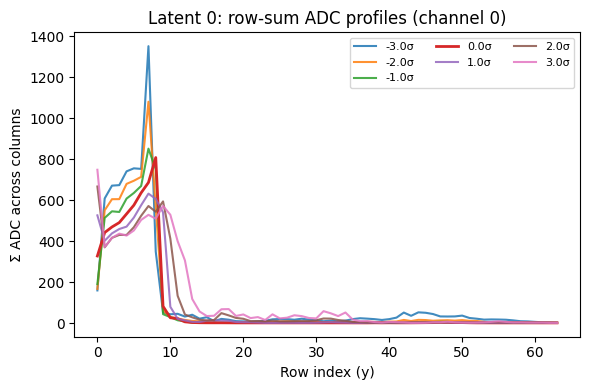

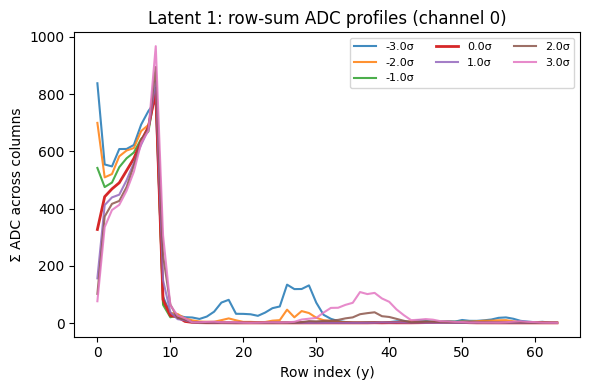

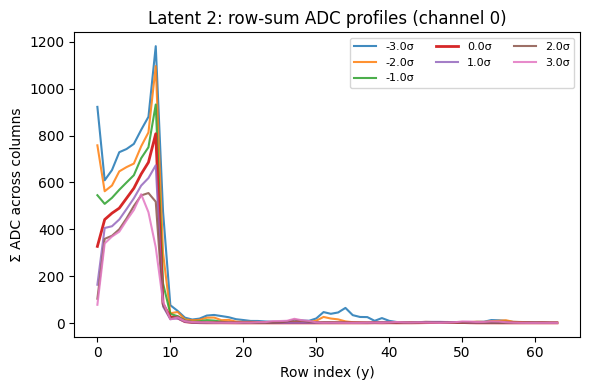

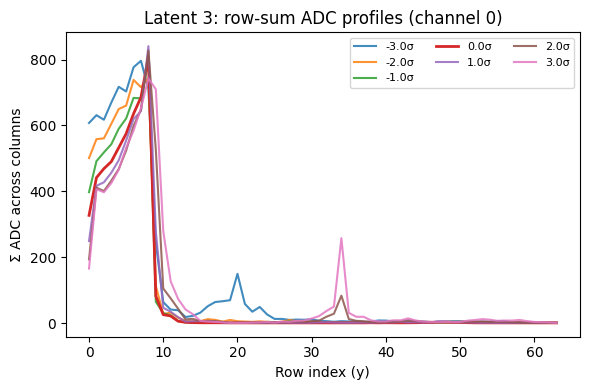

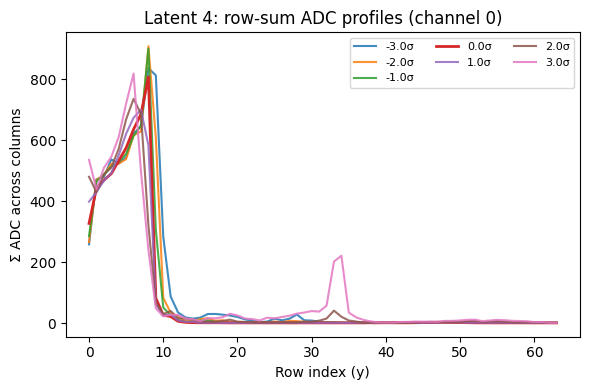

...

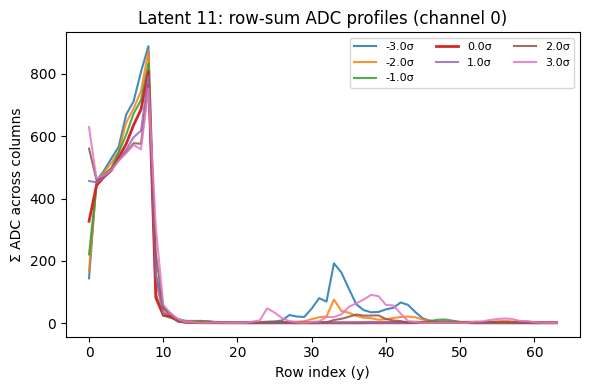

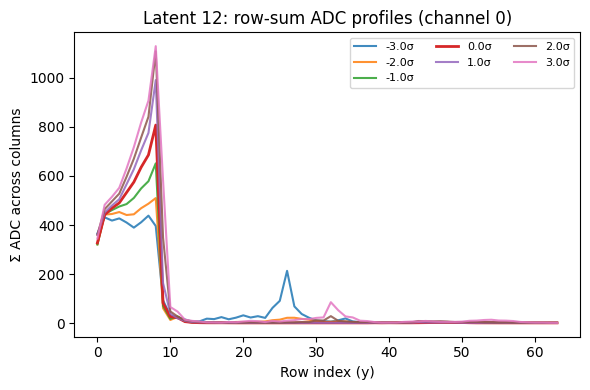

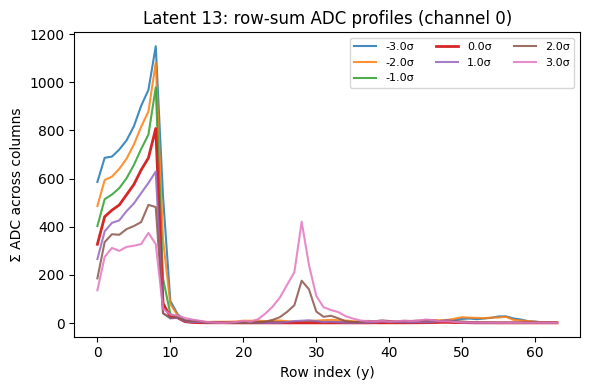

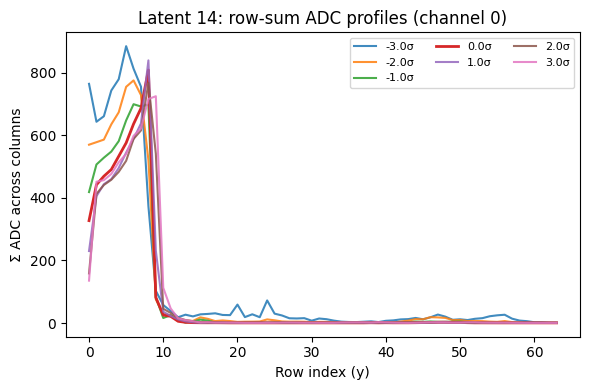

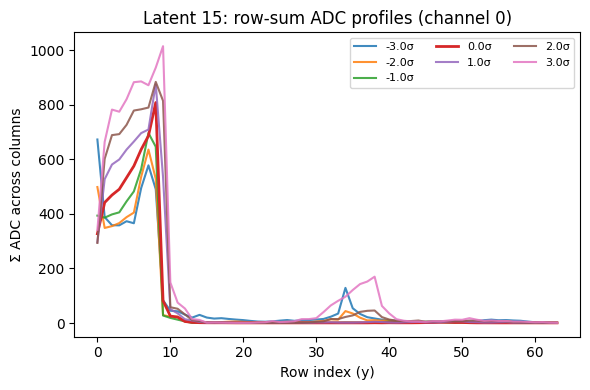

In [66]:
# assumes you already have:
# - model in eval() on `device`
# - x0: (1,2,H,W) proton from validation
# - Zsd: train-based latent std as a tensor of shape (L,)
# - functions encode(), decode(), and traverse_row_sums() from earlier

L = model.fc_enc.out_features
Zsd_t = Zsd.to(device)

# If you don't have traverse_row_sums() yet, define it here:
@torch.no_grad()
def traverse_row_sums(model, x0, i, Zsd, span=3.0, steps=7, use_abs=True):
    z0 = encode(model, x0)
    alphas = torch.linspace(-span, span, steps, device=x0.device)
    row_sums_list = []
    for a in alphas:
        z = z0.clone()
        z[:, i] = z0[:, i] + a * Zsd[i]
        y = decode(model, z)                      # (1,2,H,W)
        y_use = y.abs() if use_abs else y
        rs = y_use[0, 0].sum(dim=1).cpu().numpy() # channel 0 only; use ch1 via [0,1]
        row_sums_list.append(rs)
    return alphas.cpu().numpy(), row_sums_list

# Loop over all latent dimensions
for i in range(L):
    alphas, row_sums_list = traverse_row_sums(model, x0, i, Zsd_t, span=3.0, steps=7, use_abs=True)

    plt.figure(figsize=(6,4))
    for a, rs in zip(alphas, row_sums_list):
        if a == 0:
            plt.plot(rs, label=f"{a:.1f}σ", alpha=1, linewidth=2)
        else:
            plt.plot(rs, label=f"{a:.1f}σ", alpha=0.85)
    plt.title(f"Latent {i}: row-sum ADC profiles (channel 0)")
    plt.xlabel("Row index (y)")
    plt.ylabel("Σ ADC across columns")
    plt.legend(ncol=3, fontsize=8)
    plt.tight_layout()
    # plt.savefig(f"rowsum_traversal_latent_{i:02d}.png", dpi=150)
    plt.show()


In [67]:
Xtr[1432].shape

torch.Size([2, 64, 64])

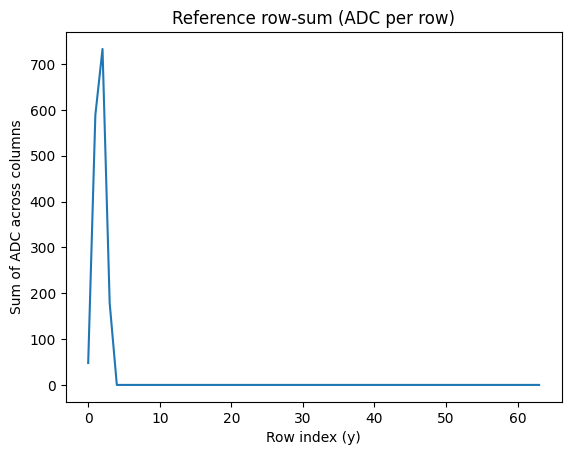

In [68]:
x0 = Xd[10].to(device)  # (1, 2, H, W)

# Example: channel 0
row_sums_ref = x0[0].sum(axis=1).cpu().numpy()  # (H,)
plt.plot(row_sums_ref)
plt.title("Reference row-sum (ADC per row)")
plt.xlabel("Row index (y)")
plt.ylabel("Sum of ADC across columns")
plt.show()


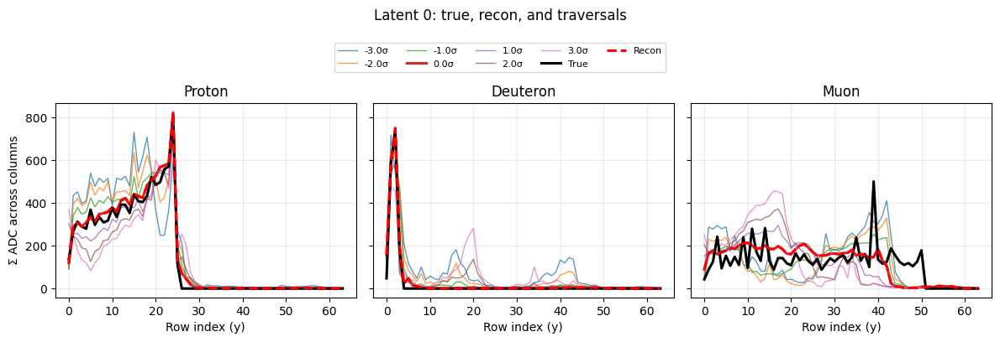

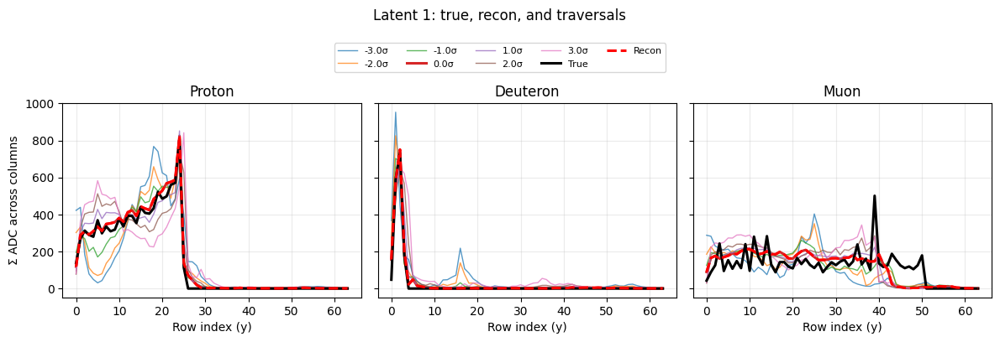

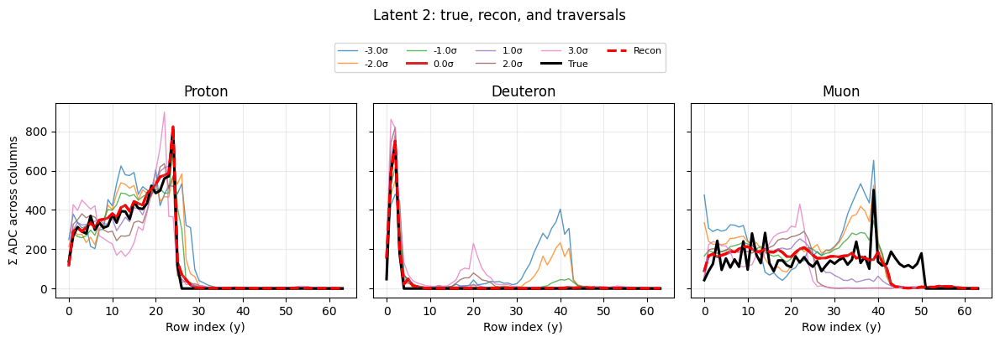

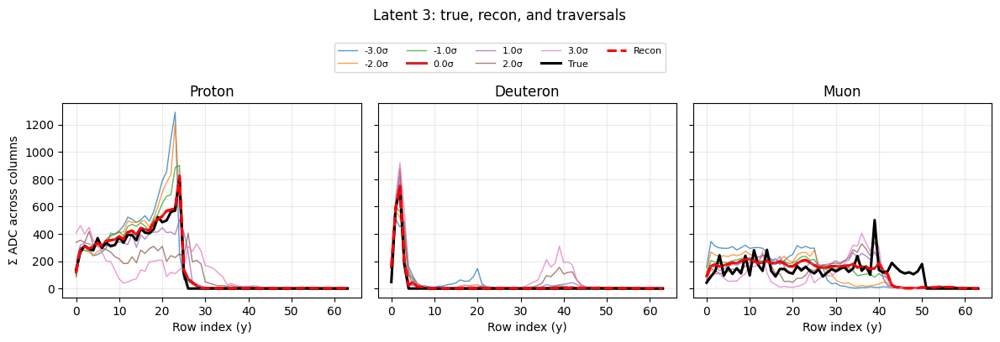

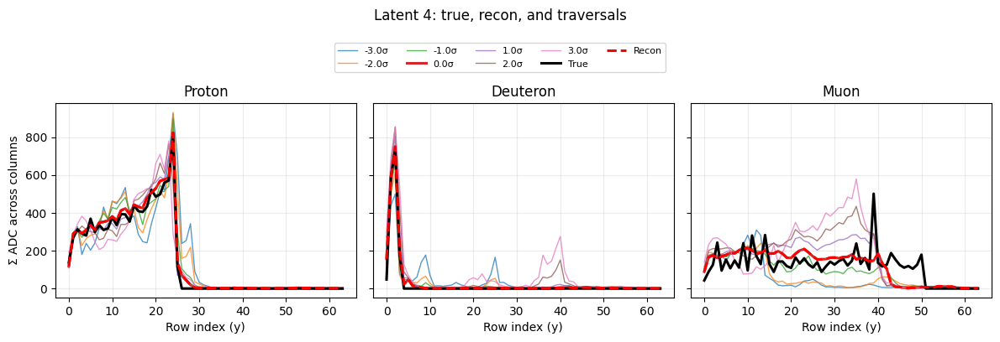

...

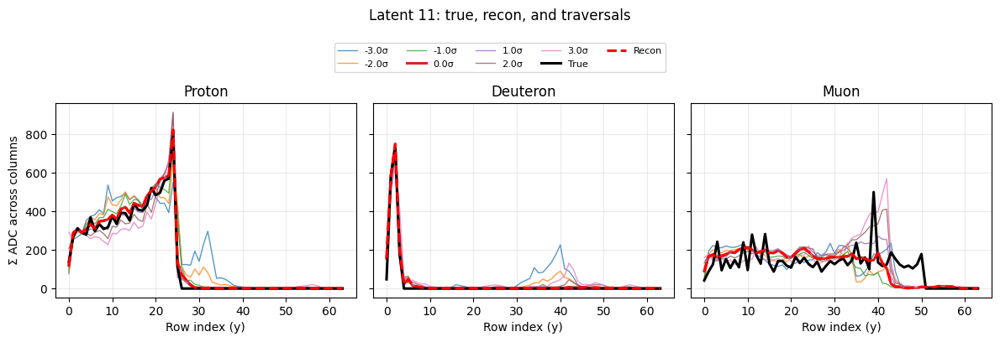

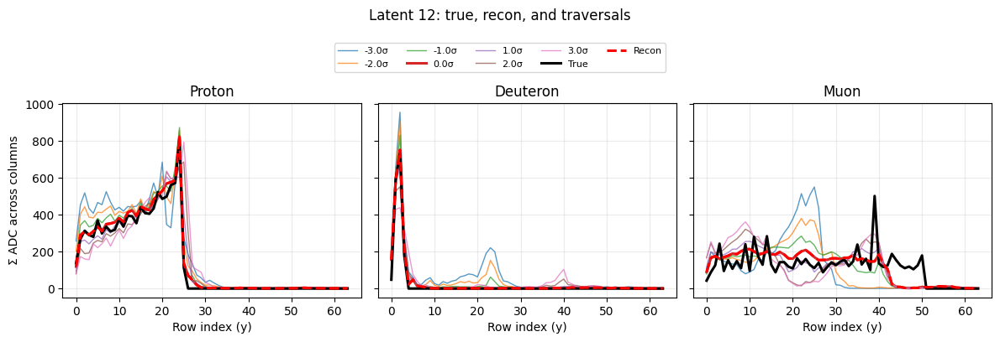

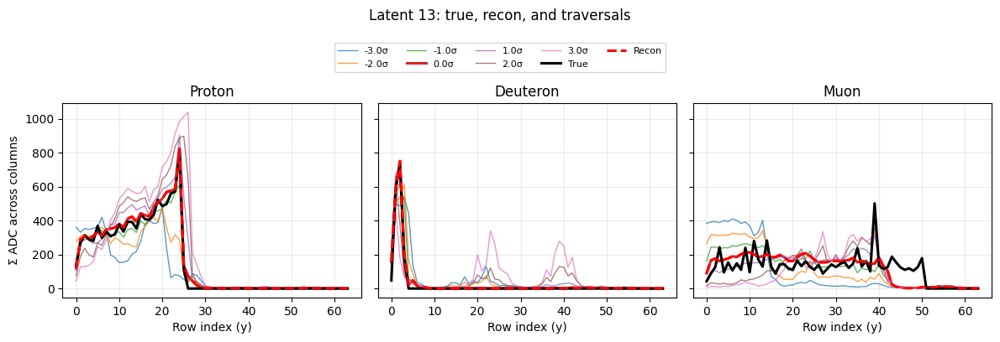

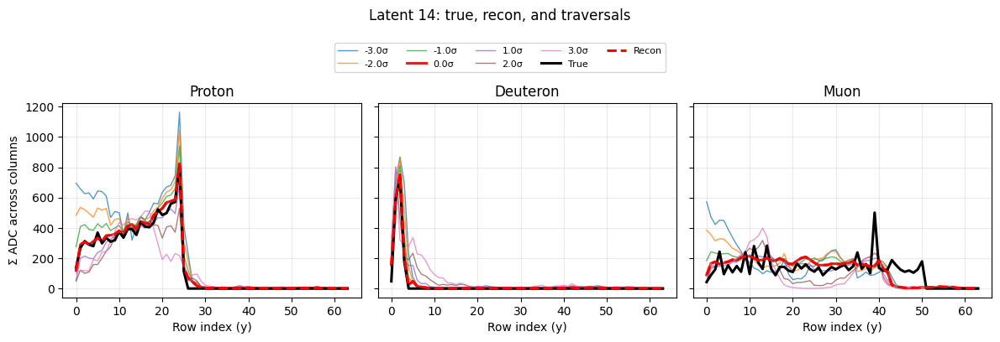

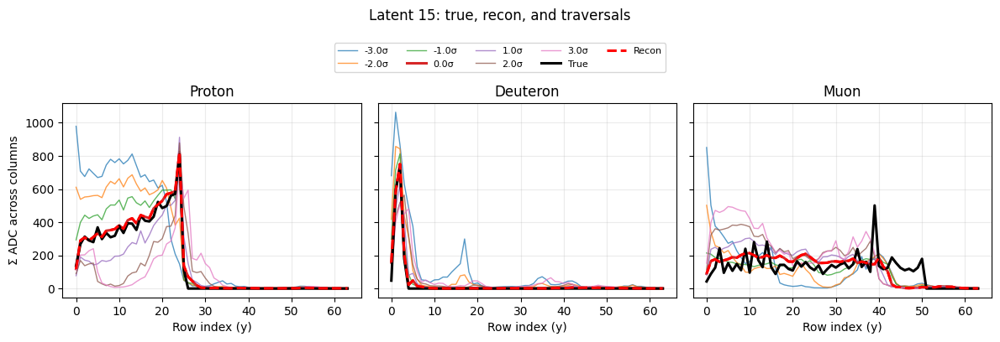

In [69]:
# Prereqs assumed:
# model.eval(), device set
# encode(), decode() already defined
# Zsd: tensor (L,)
# You have three single samples: x_p, x_d, x_m  # shape each (1,2,H,W)

L = model.fc_enc.out_features
Zsd_t = Zsd.to(device)

@torch.no_grad()
def traverse_row_sums(model, x0, i, Zsd, span=3.0, steps=15, use_abs=True, which="ch0", include_true=True):
    """Return alphas and row-sum profiles for one sample x0 and latent i."""
    z0 = encode(model, x0)
    alphas = torch.linspace(-span, span, steps, device=x0.device)
    profs = []
    
    # baseline: reconstruction
    y0 = decode(model, z0)
    y_use = y0.abs() if use_abs else y0
    if which == "ch0":
        rs_recon = y_use[0,0].sum(dim=1).cpu().numpy()
    elif which == "ch1":
        rs_recon = y_use[0,1].sum(dim=1).cpu().numpy()
    else:
        rs_recon = y_use[0].sum(dim=0).sum(dim=-1).cpu().numpy()

    # true profile
    if include_true:
        x_use = x0.abs() if use_abs else x0
        if which == "ch0":
            rs_true = x_use[0,0].sum(dim=1).cpu().numpy()
        elif which == "ch1":
            rs_true = x_use[0,1].sum(dim=1).cpu().numpy()
        else:
            rs_true = x_use[0].sum(dim=0).sum(dim=-1).cpu().numpy()
    else:
        rs_true = None

    # traversals
    for a in alphas:
        z = z0.clone()
        z[:, i] = z0[:, i] + a * Zsd[i]
        y = decode(model, z)
        y_use = y.abs() if use_abs else y
        if which == "ch0":
            rs = y_use[0,0].sum(dim=1).cpu().numpy()
        elif which == "ch1":
            rs = y_use[0,1].sum(dim=1).cpu().numpy()
        else:
            rs = y_use[0].sum(dim=0).sum(dim=-1).cpu().numpy()
        profs.append(rs)
    return alphas.cpu().numpy(), profs, rs_true, rs_recon

def plot_traversal_three(alphas, profs_list, titles, latent_idx, true_list, recon_list):
    fig, axs = plt.subplots(1, 3, figsize=(12, 3.6), sharey=True)
    for ax, profs, rs_true, rs_recon, ttl in zip(axs, profs_list, true_list, recon_list, titles):
        # plot traversals
        for a, rs in zip(alphas, profs):
            lw = 1.0 if not np.isclose(a, 0.0) else 2.2
            alpha = 0.75 if not np.isclose(a, 0.0) else 1.0
            ax.plot(rs, label=f"{a:.1f}σ", alpha=alpha, linewidth=lw)
        # add true and reconstructed baselines
        ax.plot(rs_true, color='black', lw=2.2, label='True')
        ax.plot(rs_recon, color='red', lw=2.2, label='Recon', linestyle='--')
        ax.set_title(ttl)
        ax.set_xlabel("Row index (y)")
        ax.grid(alpha=0.25)
    axs[0].set_ylabel("Σ ADC across columns")
    handles, labels = axs[0].get_legend_handles_labels()
    fig.legend(handles, labels, ncol=5, loc="upper center", bbox_to_anchor=(0.5, 1.02), fontsize=8)
    fig.suptitle(f"Latent {latent_idx}: true, recon, and traversals", y=1.12)
    fig.tight_layout()
    plt.show()

# ---- pick your three references (examples) ----
# x_p: a proton from val; x_d: a deuteron candidate from d; x_m: a muon candidate from d
# Ensure tensors on device and shape (1,2,H,W)
x_p = Xtr[1976].unsqueeze(0).to(device)   # (1,2,H,W)
x_d = Xd[10].unsqueeze(0).to(device)
x_m = Xd[1232].unsqueeze(0).to(device)

particles = [("Proton", x_p.to(device)), ("Deuteron", x_d.to(device)), ("Muon", x_m.to(device))]

# ---- run for all latent dimensions ----
for i in range(L):
    results = []
    trues, recons = [], []
    for name, x0 in particles:
        alphas, profs, rs_true, rs_recon = traverse_row_sums(model, x0, i, Zsd_t, span=3.0, steps=7)
        results.append((name, profs))
        trues.append(rs_true)
        recons.append(rs_recon)
    plot_traversal_three(alphas, [r[1] for r in results], [r[0] for r in results],
                         latent_idx=i, true_list=trues, recon_list=recons)


In [70]:
import numpy as np, matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.covariance import LedoitWolf
from sklearn.metrics import silhouette_score
from scipy.stats import ks_2samp

# Arrays you already have:
# Ztr: (N_tr, L), Zva: (N_va, L), Zd: (N_d, L)

Ztr = np.asarray(Ztr, dtype=np.float64)
Zva = np.asarray(Zva, dtype=np.float64)
Zd  = np.asarray(Zd,  dtype=np.float64)

mu = Ztr.mean(axis=0, keepdims=True)
sd = Ztr.std(axis=0, keepdims=True).clip(min=1e-6)

Ztr_s = (Ztr - mu)/sd
Zva_s = (Zva - mu)/sd
Zd_s  = (Zd  - mu)/sd


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: divide by zero encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: overflow encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: invalid value encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: divide by zero encountered in matmul
  X_transformed = X @ self.components_.T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: overflow encountered in matmul
  X_transformed = X @ self.components_.T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11

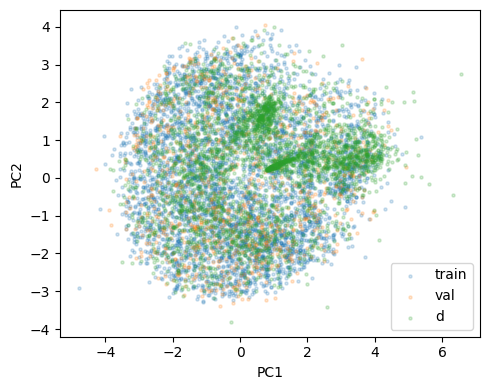

Explained variance PC1..PC3: [0.206 0.165 0.137]


In [71]:
pca = PCA(n_components=3).fit(Ztr_s)
T_tr = pca.transform(Ztr_s); T_va = pca.transform(Zva_s); T_d = pca.transform(Zd_s)

plt.figure(figsize=(5,4))
plt.scatter(T_tr[:,0], T_tr[:,1], s=5, alpha=0.2, label='train')
plt.scatter(T_va[:,0], T_va[:,1], s=5, alpha=0.2, label='val')
plt.scatter(T_d[:,0],  T_d[:,1],  s=5, alpha=0.2, label='d')
plt.xlabel('PC1'); plt.ylabel('PC2'); plt.legend(); plt.tight_layout(); plt.show()

print("Explained variance PC1..PC3:", np.round(pca.explained_variance_ratio_,3))


Strongest shifts (smallest p):
 dim 6: KS p=9.80e-02
 dim 8: KS p=1.05e-01
 dim 14: KS p=1.31e-01
 dim 10: KS p=1.51e-01
 dim 3: KS p=1.62e-01
Strongest shifts (smallest p):
 dim 7: KS p=4.04e-141
 dim 13: KS p=1.08e-107
 dim 1: KS p=7.68e-72
 dim 12: KS p=1.78e-68
 dim 11: KS p=1.95e-64


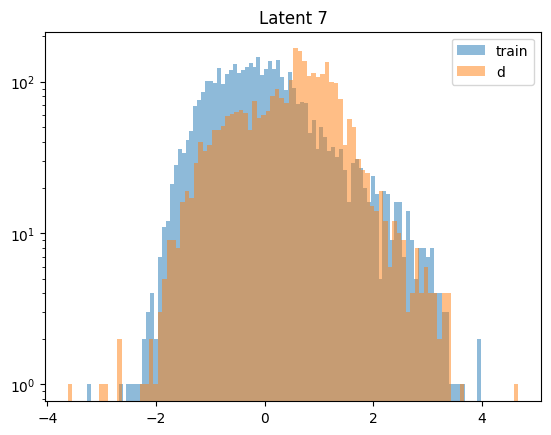

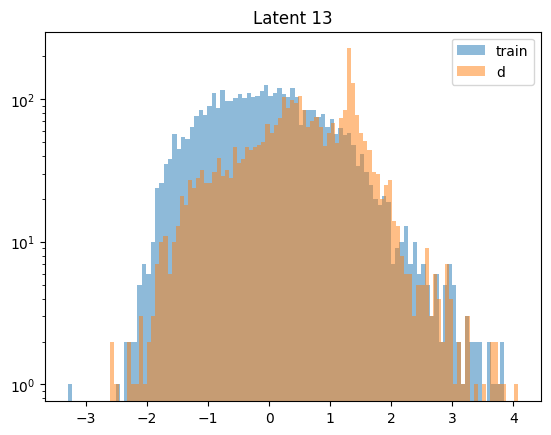

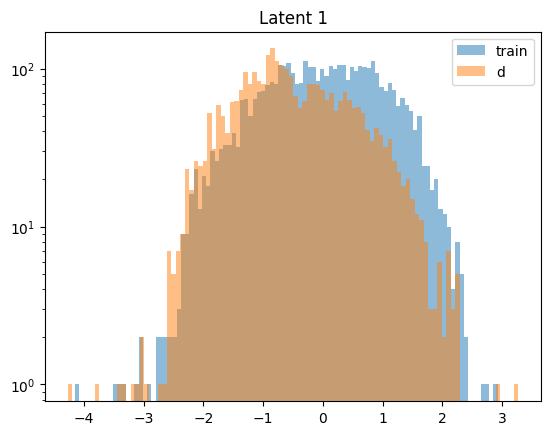

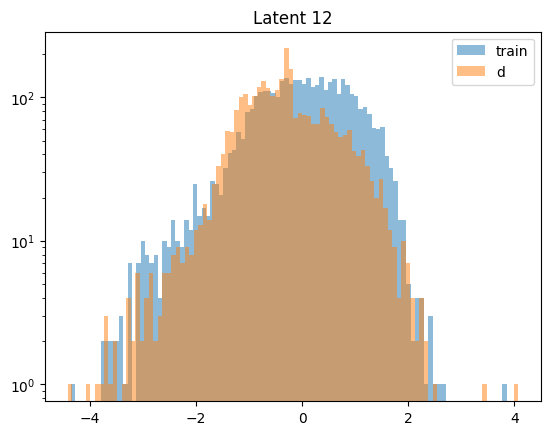

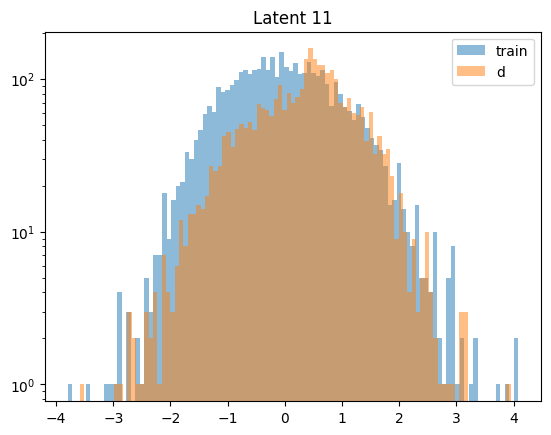

In [72]:
def ks_panel(A, B, names):
    pvals=[]
    for i in range(A.shape[1]):
        s = ks_2samp(A[:,i], B[:,i]).pvalue
        pvals.append(s)
    order = np.argsort(pvals)  # smallest p = largest shift
    print("Strongest shifts (smallest p):")
    for i in order[:5]:
        print(f" dim {names[i]}: KS p={pvals[i]:.2e}")
    return np.array(pvals), order

p_tr_va, ord_tr_va = ks_panel(Ztr_s, Zva_s, np.arange(Ztr_s.shape[1]))
p_tr_d,  ord_tr_d  = ks_panel(Ztr_s, Zd_s,  np.arange(Ztr_s.shape[1]))

for j in [7,13,1,12,11]:
    plt.hist(Ztr_s[:,j], bins=100, alpha=0.5, label='train')
    plt.hist(Zd_s[:,j],  bins=100, alpha=0.5, label='d')
    plt.title(f"Latent {j}"); plt.yscale('log'); plt.legend(); plt.show()



/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/linalg/_basic.py:1742: RuntimeWarning: divide by zero encountered in matmul
  B = (u * psigma_diag) @ u.conj().T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/linalg/_basic.py:1742: RuntimeWarning: overflow encountered in matmul
  B = (u * psigma_diag) @ u.conj().T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/linalg/_basic.py:1742: RuntimeWarning: invalid value encountered in matmul
  B = (u * psigma_diag) @ u.conj().T


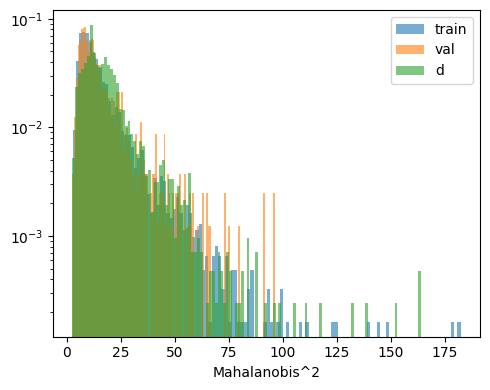

Quantiles train: [11.56729644 29.94483626 42.91258358 69.99112064]
Quantiles val:   [11.77574568 31.62978524 43.07504654 64.96585722]
Quantiles d:     [15.30326517 32.97730405 44.54164548 69.97173666]


In [73]:
lw = LedoitWolf().fit(Ztr_s)
Prec = lw.precision_
def maha(Z):
    return np.einsum('ij,jk,ik->i', Z, Prec, Z)

S_tr = maha(Ztr_s); S_va = maha(Zva_s); S_d = maha(Zd_s)

plt.figure(figsize=(5,4))
plt.hist(S_tr, bins=120, alpha=0.6, density=True, label='train')
plt.hist(S_va, bins=120, alpha=0.6, density=True, label='val')
plt.hist(S_d,  bins=120, alpha=0.6, density=True, label='d')
plt.yscale('log'); plt.legend(); plt.xlabel('Mahalanobis^2'); plt.tight_layout(); plt.show()

# Quantify shift by percentiles
q = [50, 90, 95, 99]
print("Quantiles train:", np.percentile(S_tr,q))
print("Quantiles val:  ", np.percentile(S_va,q))
print("Quantiles d:    ", np.percentile(S_d,q))


In [74]:
def centroid(Z): return Z.mean(0)
def cov(Z): return np.cov(Z, rowvar=False)

c_tr, c_va, c_d = centroid(Ztr_s), centroid(Zva_s), centroid(Zd_s)
print("||centroid(val) - centroid(train)||2:", np.linalg.norm(c_va - c_tr).round(3))
print("||centroid(d)   - centroid(train)||2:", np.linalg.norm(c_d  - c_tr).round(3))

# Frobenius distance between covariances
C_tr, C_va, C_d = cov(Ztr_s), cov(Zva_s), cov(Zd_s)
def frob(A,B): return np.linalg.norm(A-B, ord='fro')
print("||Cov(val)-Cov(train)||_F:", frob(C_va, C_tr).round(3))
print("||Cov(d)-Cov(train)||_F:  ", frob(C_d,  C_tr).round(3))


||centroid(val) - centroid(train)||2: 0.148
||centroid(d)   - centroid(train)||2: 1.203
||Cov(val)-Cov(train)||_F: 0.54
||Cov(d)-Cov(train)||_F:   2.029


In [75]:
def mmd_rbf(X, Y, gamma=None):
    if gamma is None:
        # median heuristic on pooled data
        Z = np.vstack([X, Y])
        D = np.sum((Z[:,None,:]-Z[None,:,:])**2, axis=2)
        med = np.median(D[D>0])
        gamma = 1.0/(med+1e-12)
    def k(a,b): 
        D = np.sum((a[:,None,:]-b[None,:,:])**2, axis=2)
        return np.exp(-gamma*D)
    Kxx = k(X,X); Kyy = k(Y,Y); Kxy = k(X,Y)
    m = X.shape[0]; n = Y.shape[0]
    return Kxx.sum()/(m*m) + Kyy.sum()/(n*n) - 2*Kxy.sum()/(m*n)

print("MMD(train, val):", float(mmd_rbf(Ztr_s, Zva_s)))
print("MMD(train, d):  ", float(mmd_rbf(Ztr_s, Zd_s)))


MMD(train, val): 0.0007756980404802771
MMD(train, d):   0.05050533024323001


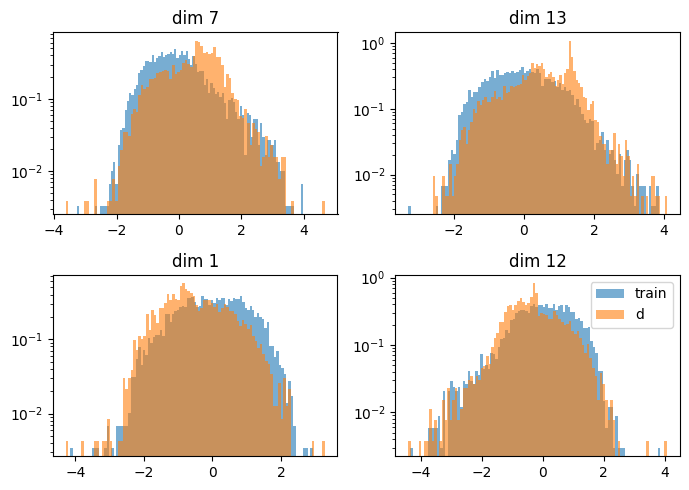

In [76]:
top = ord_tr_d[:4]  # 4 most shifted dimensions train vs d
fig, axs = plt.subplots(2,2, figsize=(7,5))
axs = axs.ravel()
for ax, j in zip(axs, top):
    ax.hist(Ztr_s[:,j], bins=100, alpha=0.6, density=True, label='train')
    ax.hist(Zd_s[:,j],  bins=100, alpha=0.6, density=True, label='d')
    ax.set_title(f"dim {j}"); ax.set_yscale('log')
plt.legend(); plt.tight_layout(); plt.show()


In [77]:
x0 = Xva[idx_median:idx_median+1].to(device)     
x0[0][0].shape

torch.Size([64, 64])

In [78]:
row_sums = x0[0][0].sum(axis=1)  # Sum along columns for each row
print(row_sums)

tensor([272.6190, 463.1859, 494.1081, 459.1791, 503.6500, 661.4906, 625.3583,
        774.5079, 775.0710,  25.2245,   0.0000,   0.0000,   0.0000,   0.0000,
          0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
          0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
          0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
          0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
          0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
          0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
          0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,   0.0000,
          0.0000], device='mps:0')


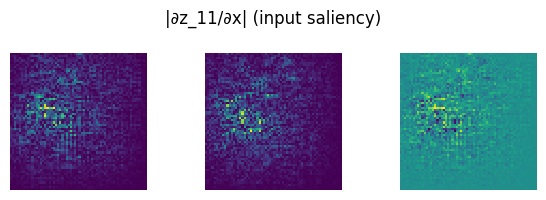

In [79]:
def latent_input_saliency(model, x, i):
    model.eval()
    x = x.clone().requires_grad_(True)
    e = model.encoder(x)
    z = model.fc_enc(e.flatten(1))
    zi = z[:, i].sum()
    g = torch.autograd.grad(zi, x, retain_graph=False)[0]  # (1,2,H,W)
    return g

i_star = int(order[0])                    # most important by ablation
x_ref   = ref.clone()
g = latent_input_saliency(model, x_ref, i_star)
show_triptych(g.abs(), title=f"|∂z_{i_star}/∂x| (input saliency)")


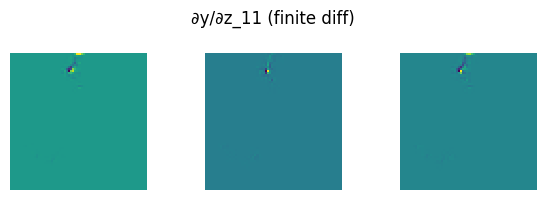

In [80]:
@torch.no_grad()
def decoder_column_fd(model, z0, i, eps=1e-2):
    y0 = decode(model, z0)
    z1 = z0.clone(); z1[:, i] += eps
    y1 = decode(model, z1)
    return (y1 - y0)/eps

with torch.no_grad():
    z0 = encode(model, ref)
Jcol = decoder_column_fd(model, z0, i_star, eps=1e-2)
show_triptych(Jcol, title=f"∂y/∂z_{i_star} (finite diff)")


In [81]:
latent_vectors = lat_tr
latent_vectors_val = lat_va
latent_vectors_d = lat_d

In [82]:
from sklearn.manifold import TSNE

Z_all = np.concatenate([latent_vectors, latent_vectors_d, latent_vectors_val], axis=0)
labels = np.concatenate([
    np.zeros(len(latent_vectors)),          # 0 = protons
    np.ones(len(latent_vectors_d)),         # 1 = deuterons
    np.full(len(latent_vectors_val), 2)     # 2 = validation
])

In [83]:
tsne = TSNE(
    n_components=2,
    perplexity=50,
    learning_rate=50,
    max_iter=2000,
    init='random',
    random_state=42
)
Z_2d = tsne.fit_transform(Z_all)

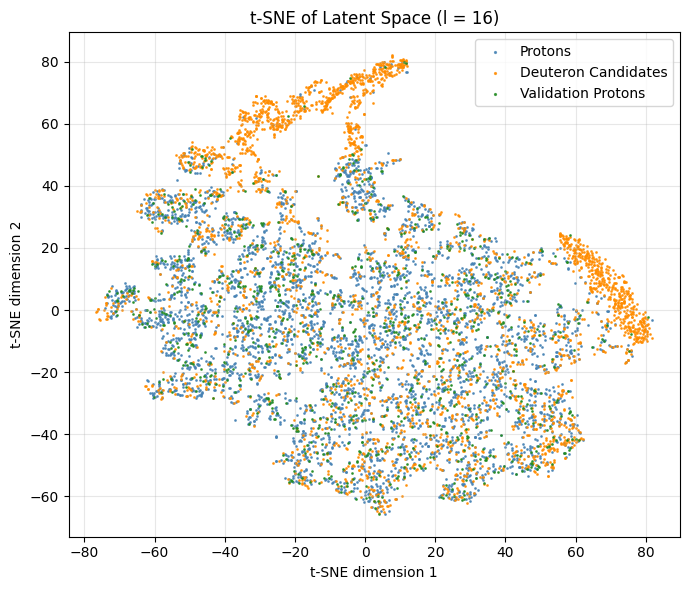

In [86]:
plt.figure(figsize=(7, 6))
colours = ['steelblue', 'darkorange', 'forestgreen']
labels_text = ['Protons', 'Deuteron Candidates', 'Validation Protons']

for i, (colour, label_name) in enumerate(zip(colours, labels_text)):
    plt.scatter(Z_2d[labels == i, 0],
                Z_2d[labels == i, 1],
                color=colour,
                alpha=0.8,
                s=1,
                label=label_name)

plt.xlabel("t-SNE dimension 1")
plt.ylabel("t-SNE dimension 2")
plt.legend(markerscale=1.3)
plt.title("t-SNE of Latent Space (l = 16)")
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [87]:
import matplotlib.colors as mcolors

Z_all = np.concatenate([latent_vectors, latent_vectors_d, latent_vectors_val])
RE_all = np.concatenate([RE_per_sample, RE_per_sample_d, RE_per_sample_val])

plt.figure(figsize=(7,6))
sc = plt.scatter(Z_2d[:, 0], Z_2d[:, 1],
                 c=RE_all,
                 cmap='viridis',
                 norm=mcolors.LogNorm(vmin=RE_all.min()+1e-8, vmax=RE_all.max()),
                 s=1)
plt.colorbar(sc, label='Reconstruction Error (log scale)')
plt.title("t-SNE coloured by Reconstruction Error (log colour scale)")
plt.tight_layout()
plt.show()

# low error regions and high error regions in deuteron candidates?
# overlap with proton latent vectors?
# separation with proton latent vectors

NameError: name 'RE_per_sample' is not defined

In [88]:
import umap
reducer = umap.UMAP(n_neighbors=30, min_dist=0.1, random_state=42)
Z_umap = reducer.fit_transform(Z_all)

/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


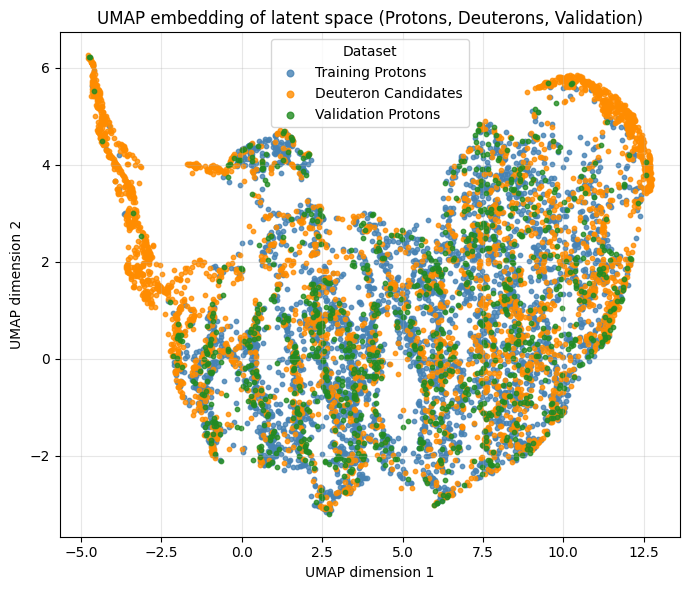

In [89]:
# labels: 0=Protons, 1=Deuterons, 2=Validation
palette = ['steelblue', 'darkorange', 'forestgreen']  # order matches labels

plt.figure(figsize=(7,6))
for i, name in enumerate(['Training Protons', 'Deuteron Candidates', 'Validation Protons']):
    m = (labels == i)
    plt.scatter(Z_umap[m, 0], Z_umap[m, 1],
                color=palette[i], s=10, alpha=0.8, label=name)

plt.xlabel("UMAP dimension 1")
plt.ylabel("UMAP dimension 2")
plt.title("UMAP embedding of latent space (Protons, Deuterons, Validation)")
plt.legend(title="Dataset", markerscale=1.5)
plt.grid(True, alpha=0.3)
plt.tight_layout()
# plt.savefig('UMAP.png', dpi=1000)
plt.show()


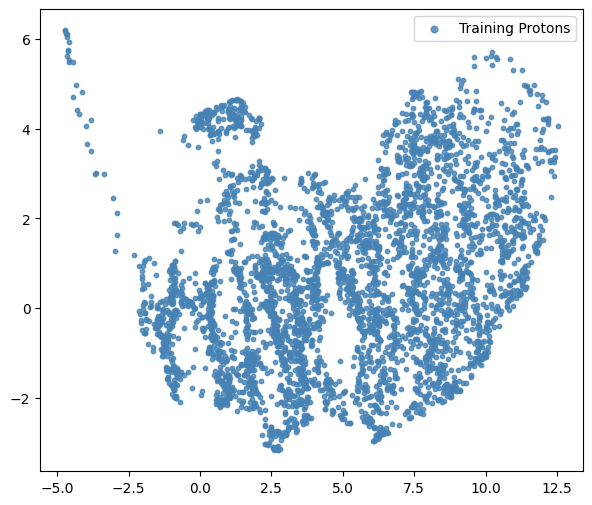

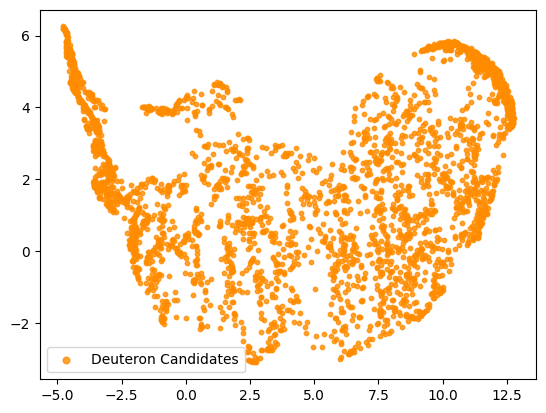

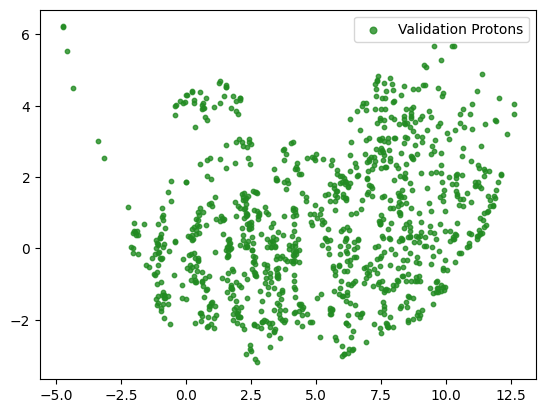

In [90]:
# labels: 0=Protons, 1=Deuterons, 2=Validation
palette = ['steelblue', 'darkorange', 'forestgreen']  # order matches labels

plt.figure(figsize=(7,6))
for i, name in enumerate(['Training Protons', 'Deuteron Candidates', 'Validation Protons']):
    m = (labels == i)
    plt.scatter(Z_umap[m, 0], Z_umap[m, 1],
                color=palette[i], s=10, alpha=0.8, label=name)
    plt.legend(markerscale=1.5)
    # plt.xlim(-5, 14)
    # plt.ylim(0, 10)
    plt.show()

# plt.xlabel("UMAP dimension 1")
# plt.ylabel("UMAP dimension 2")
# plt.title("UMAP embedding of latent space (Protons, Deuterons, Validation)")
# plt.legend(title="Dataset", markerscale=1.5)
# plt.grid(True, alpha=0.3)
# plt.tight_layout()
# plt.show()


In [91]:
palette = ['steelblue', 'darkorange', 'forestgreen']
names = ['Training Protons', 'Deuteron Candidates', 'Validation Protons']

norm = mcolors.LogNorm(vmin=RE_all.min() + 1e-8, vmax=RE_all.max())
cmap = plt.cm.viridis

fig, axes = plt.subplots(1, 3, figsize=(20, 4), sharex=True, sharey=True)

for i, ax in enumerate(axes):
    m = (labels == i)
    sc = ax.scatter(
        Z_umap[m, 0],
        Z_umap[m, 1],
        c=RE_all[m],
        cmap=cmap,
        norm=norm,
        s=3,
        alpha=0.8
    )
    ax.set_title(names[i], fontsize=12)
    ax.set_xlabel("UMAP dimension 1")
    if i == 0:
        ax.set_ylabel("UMAP dimension 2")
    ax.grid(True, alpha=0.3)

cbar = fig.colorbar(sc, ax=axes.ravel().tolist(), fraction=0.046, pad=0.04)
cbar.set_label('Reconstruction Error (log scale)')

fig.suptitle("UMAP embeddings coloured by Reconstruction Error (log scale)", fontsize=14)

# plt.savefig('UMAPandRE.png', dpi=1000)
plt.show()


NameError: name 'RE_all' is not defined

/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


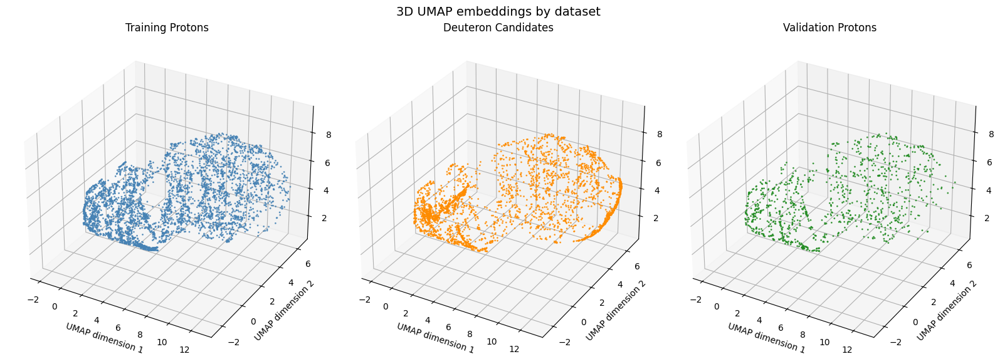

In [92]:
from mpl_toolkits.mplot3d import Axes3D

umap_3d = umap.UMAP(n_components=3, random_state=42)
embedding = umap_3d.fit_transform(Z_all)

palette = ['steelblue', 'darkorange', 'forestgreen']
names = ['Training Protons', 'Deuteron Candidates', 'Validation Protons']

fig = plt.figure(figsize=(16, 6))

for i, name in enumerate(names):
    mask = (labels == i)
    ax = fig.add_subplot(1, 3, i + 1, projection='3d')
    ax.scatter(
        embedding[mask, 0],
        embedding[mask, 1],
        embedding[mask, 2],
        color=palette[i],
        s=1,
        alpha=0.8
    )
    ax.set_title(name)
    ax.set_xlabel("UMAP dimension 1")
    ax.set_ylabel("UMAP dimension 2")
    ax.set_zlabel("UMAP dimension 3")
    # ax.view_init(elev=25, azim=45)  

fig.suptitle("3D UMAP embeddings by dataset", fontsize=14)
plt.tight_layout()
plt.show()


NameError: name 'RE_all' is not defined

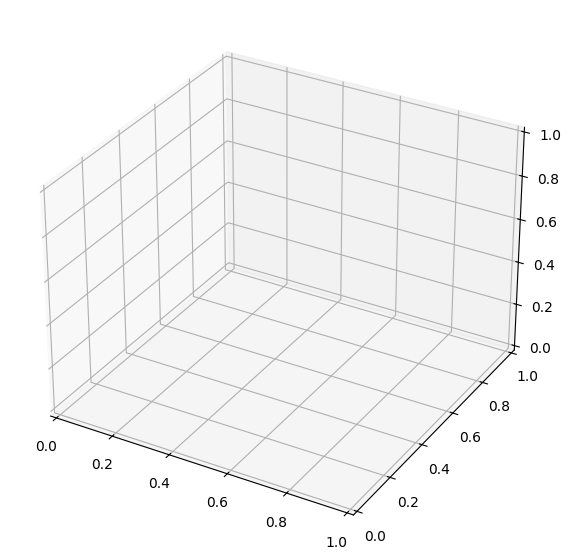

In [93]:
%matplotlib inline

fig = plt.figure(figsize=(9, 7))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot coloured by reconstruction error
sc = ax.scatter(
    embedding[:, 0],
    embedding[:, 1],
    embedding[:, 2],
    c=RE_all,
    cmap='viridis',
    # norm=mcolors.LogNorm(vmin=RE_all.min() + 1e-8, vmax=RE_all.max()),
    s=3,
    alpha=0.8
)

# Axis labels and title
ax.set_xlabel("UMAP dimension 1")
ax.set_ylabel("UMAP dimension 2")
ax.set_zlabel("UMAP dimension 3")
ax.set_title("3D UMAP embedding coloured by Reconstruction Error (log scale)")

# Colour bar
cbar = plt.colorbar(sc, ax=ax, fraction=0.046, pad=0.04)
cbar.set_label('Reconstruction Error (log scale)')

plt.tight_layout()
plt.show()


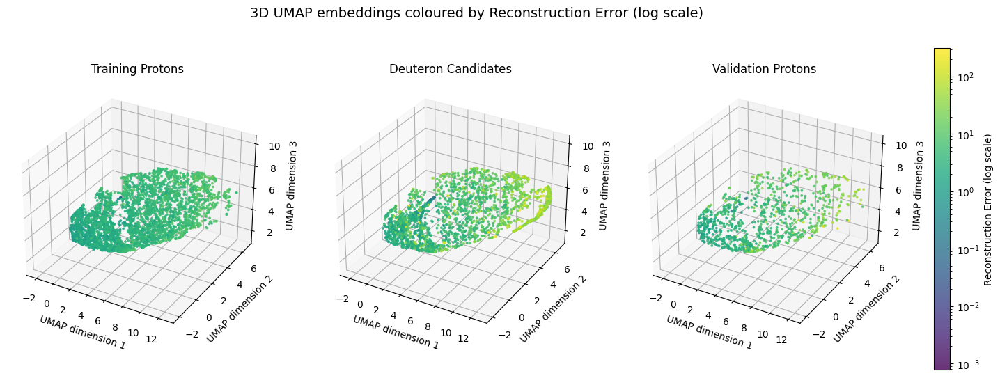

In [ ]:
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import numpy as np

# Assume: embedding (3D UMAP), RE_all (reconstruction errors), labels (0,1,2)
palette = ['steelblue', 'darkorange', 'forestgreen']
names = ['Training Protons', 'Deuteron Candidates', 'Validation Protons']

# Shared normalisation and colormap for all plots
norm = mcolors.LogNorm(vmin=RE_all.min() + 1e-8, vmax=RE_all.max())
cmap = plt.cm.viridis

fig = plt.figure(figsize=(18, 6))

for i, name in enumerate(names):
    mask = (labels == i)
    ax = fig.add_subplot(1, 3, i + 1, projection='3d')

    sc = ax.scatter(
        embedding[mask, 0],
        embedding[mask, 1],
        embedding[mask, 2],
        c=RE_all[mask],
        cmap=cmap,
        norm=norm,
        s=3,
        alpha=0.8
    )

    ax.set_title(name, fontsize=12)
    ax.set_xlabel("UMAP dimension 1")
    ax.set_ylabel("UMAP dimension 2")
    ax.set_zlabel("UMAP dimension 3")
    # ax.view_init(elev=25, azim=45)  # consistent 3D orientation

# Shared colour bar for all subplots
cbar = fig.colorbar(sc, ax=fig.get_axes(), fraction=0.046, pad=0.04)
cbar.set_label('Reconstruction Error (log scale)')

fig.suptitle("3D UMAP embeddings coloured by Reconstruction Error (log scale)", fontsize=14)
plt.show()


In [ ]:
latent_vectors.shape, latent_vectors_val.shape, latent_vectors_d.shape

((4126, 16), (1031, 16), (3110, 16))

In [ ]:
latent = np.concatenate([latent_vectors, latent_vectors_val])

Deuteron subset shape: (3110, 2)


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: divide by zero encountered in matmul
  current_pot = closest_dist_sq @ sample_weight
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:237: RuntimeWarning: overflow encountered in matmul
  current_pot = closest_dist_sq @ sample_weight
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-pac

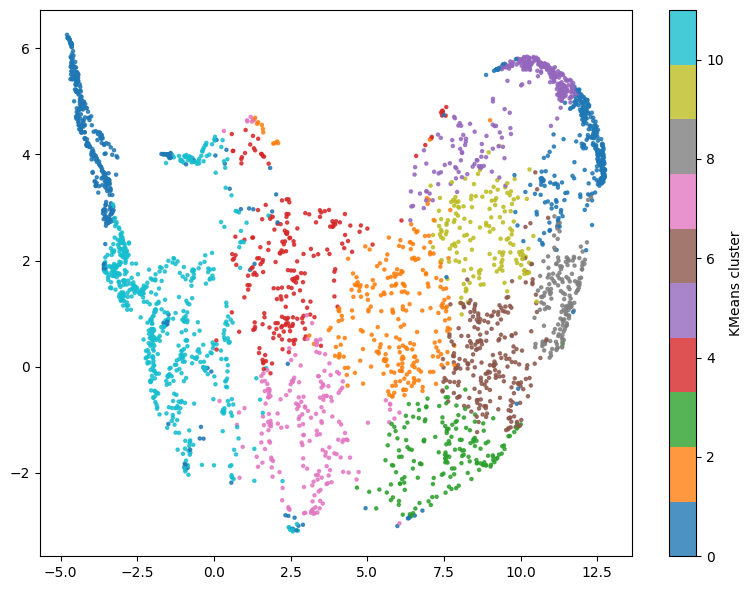

In [97]:
from sklearn.cluster import KMeans

Z_all = np.concatenate([latent_vectors, latent_vectors_d, latent_vectors_val], axis=0)
labels = np.concatenate([
    np.zeros(len(latent_vectors)),          # 0 = protons
    np.ones(len(latent_vectors_d)),         # 1 = deuterons
    np.full(len(latent_vectors_val), 2)     # 2 = validation
])

mask = (labels == 1)
Z_d = Z_all[mask]          # latent vectors
E_d = Z_umap[mask]      # 3D UMAP coordinates


mask_p = ((labels == 0) | (labels == 2))
Z_p = Z_all[mask_p]          # latent vectors
E_p = Z_umap[mask_p]      # 3D UMAP coordinates

print(f"Deuteron subset shape: {E_d.shape}")

kmeans = KMeans(n_clusters=12, random_state=42) #6
labels_km = kmeans.fit_predict(Z_d)

fig = plt.figure(figsize=(8, 6))
sc = plt.scatter(E_d[:, 0], E_d[:, 1],
                c=labels_km, cmap='tab10', s=5, alpha=0.8)
plt.colorbar(label='KMeans cluster')
ax.set_title("Deuteron candidates — KMeans clusters")
ax.set_xlabel("UMAP dim 1")
ax.set_ylabel("UMAP dim 2")
plt.tight_layout()
# plt.savefig('Kmeans.png', dpi=1000)
plt.show()


In [98]:
p_m = col[col['particle_type'] == 'proton']['beamline_mass'].values
d_m = col[col['particle_type'] == 'deuteron']['beamline_mass'].values


p_l = col[(col['particle_type'] == 'proton') & (col['height'] < 170)]['height'].values
d_l = col[col['particle_type'] == 'deuteron']['height'].values
d_p = col[col['particle_type'] == 'deuteron']['p'].values

d_diff = col[col['particle_type'] == 'deuteron']['maxdiff'].values
p_diff = col[(col['particle_type'] == 'proton') & (col['height'] < 170)]['maxdiff'].values

labels = labels_km

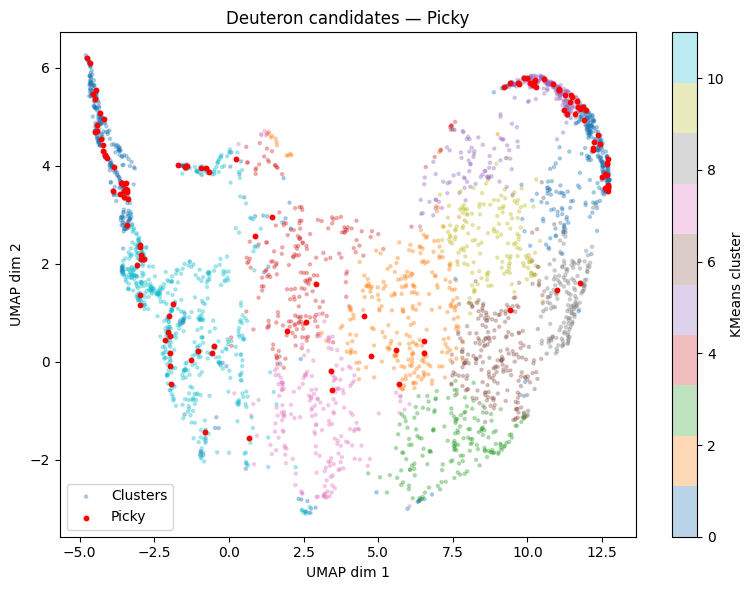

In [99]:
# Highlight points where highlight == 1
highlight_mask = (d_p == 1)

fig = plt.figure(figsize=(8, 6))
sc = plt.scatter(E_d[:, 0], E_d[:, 1], c=labels_km, cmap='tab10', s=5, alpha=0.3, label='Clusters')

# Overlay highlighted points
plt.scatter(E_d[highlight_mask, 0], E_d[highlight_mask, 1], 
            color='red', s=10, label='Picky', alpha=1)

plt.colorbar(sc, label='KMeans cluster')
plt.title("Deuteron candidates — Picky")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.legend()
plt.tight_layout()
# plt.savefig('picky.png', dpi=1000)
plt.show()

/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_49002/294825193.py:9: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = plt.scatter(m[:, 0], m[:, 1], cmap='tab10', s=5, alpha=0.8, label='Clusters')


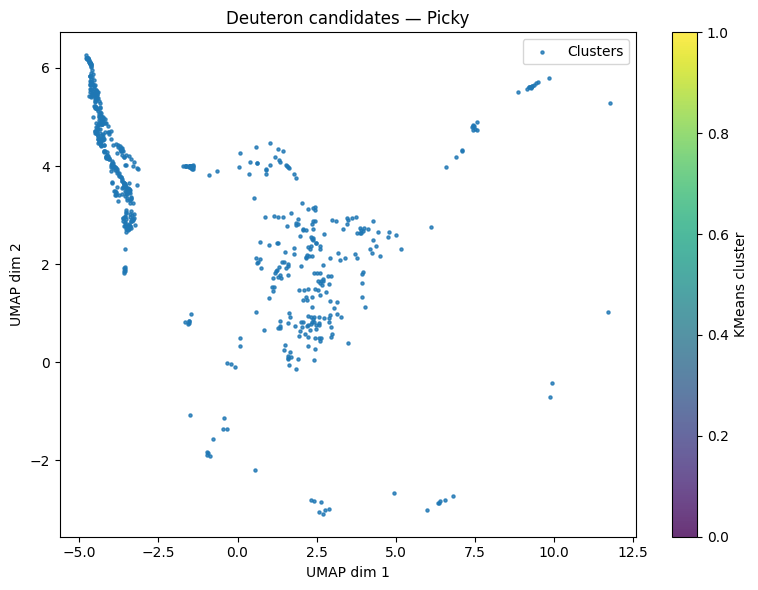

In [100]:
m0 = E_d[(labels == 0)]
m1 = E_d[(labels == 4)]
m = np.concatenate([m0, m1])

# Highlight points where highlight == 1
highlight_mask = (d_p == 1)

fig = plt.figure(figsize=(8, 6))
sc = plt.scatter(m[:, 0], m[:, 1], cmap='tab10', s=5, alpha=0.8, label='Clusters')

plt.colorbar(sc, label='KMeans cluster')
plt.title("Deuteron candidates — Picky")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.legend()
plt.tight_layout()
plt.show()

In [101]:
unique, counts = np.unique(highlight_mask, return_counts=True)

unique, counts

(array([False,  True]), array([2987,  123]))

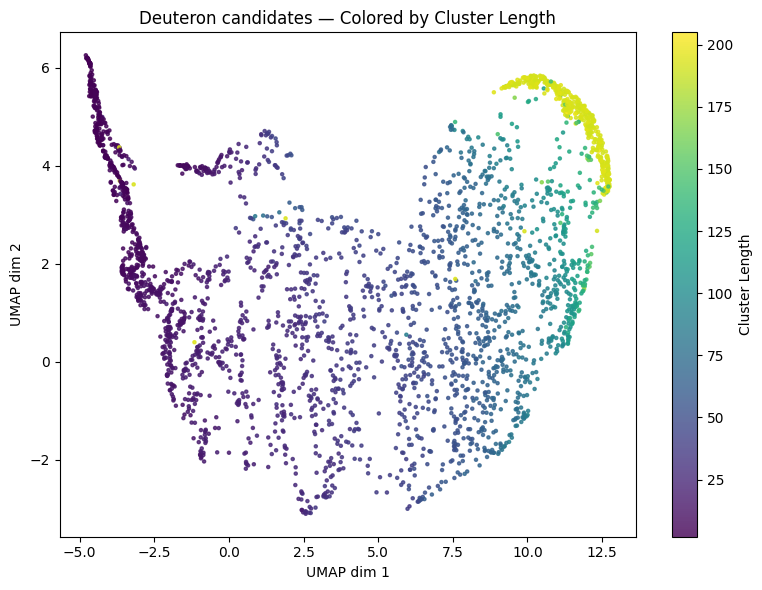

In [102]:
fig = plt.figure(figsize=(8, 6))

# Scatter plot colored by cluster length
sc = plt.scatter(E_d[:, 0], E_d[:, 1],
                 c=d_l, cmap='viridis', s=5, alpha=0.8)

# Add a colorbar to indicate cluster length
cbar = plt.colorbar(sc)
cbar.set_label("Cluster Length")

plt.title("Deuteron candidates — Colored by Cluster Length")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
# plt.savefig('length.png', dpi=1000)
plt.show()

In [103]:
import numpy as np
from scipy.stats import pearsonr
import matplotlib.pyplot as plt

# Inputs:
# lat_d: np.ndarray of shape (N, L)  — deuteron latent vectors
# d_l:   np.ndarray of shape (N,)    — deuteron cluster lengths

L = lat_d.shape[1]
corrs = np.zeros(L)
pvals = np.zeros(L)

for i in range(L):
    r, p = pearsonr(lat_d[:, i], d_l)
    corrs[i] = r
    pvals[i] = p

# Rank by absolute correlation
order = np.argsort(np.abs(corrs))[::-1]

print("Top latent dimensions correlated with length:")
for i in order[:5]:
    print(f"  dim {i:02d}: r={corrs[i]:+.3f}, p={pvals[i]:.2e}")

Top latent dimensions correlated with length:
  dim 09: r=-0.478, p=5.46e-177
  dim 06: r=-0.379, p=1.19e-106
  dim 15: r=+0.335, p=2.33e-82
  dim 10: r=-0.304, p=1.77e-67
  dim 00: r=+0.303, p=6.26e-67


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/stats/_stats_py.py:4776: RuntimeWarning: overflow encountered in vecdot
  r = xp.vecdot(xm / normxm, ym / normym, axis=axis)


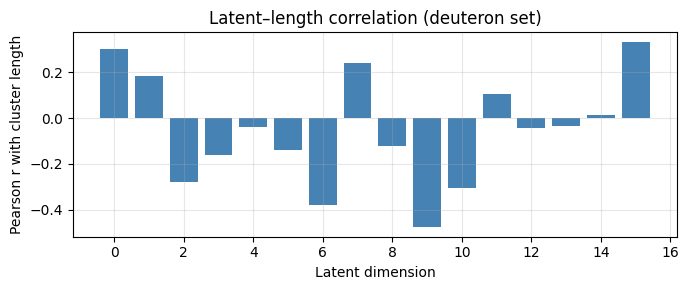

In [104]:
plt.figure(figsize=(7,3))
plt.bar(range(L), corrs, color='steelblue')
plt.xlabel("Latent dimension")
plt.ylabel("Pearson r with cluster length")
plt.title("Latent–length correlation (deuteron set)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

Multiple regression R² = 0.577


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/linear_model/_base.py:280: RuntimeWarning: divide by zero encountered in matmul
  return X @ coef_ + self.intercept_
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/linear_model/_base.py:280: RuntimeWarning: overflow encountered in matmul
  return X @ coef_ + self.intercept_
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/linear_model/_base.py:280: RuntimeWarning: invalid value encountered in matmul
  return X @ coef_ + self.intercept_


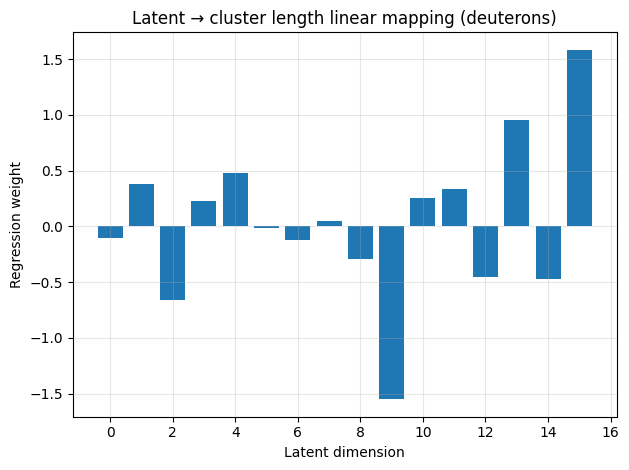

In [105]:
from sklearn.linear_model import LinearRegression

reg = LinearRegression().fit(lat_d, d_l)
r2 = reg.score(lat_d, d_l)
print(f"Multiple regression R² = {r2:.3f}")

plt.bar(range(L), reg.coef_)
plt.xlabel("Latent dimension")
plt.ylabel("Regression weight")
plt.title("Latent → cluster length linear mapping (deuterons)")
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

In [112]:
bins = np.linspace(0, 175, 30)

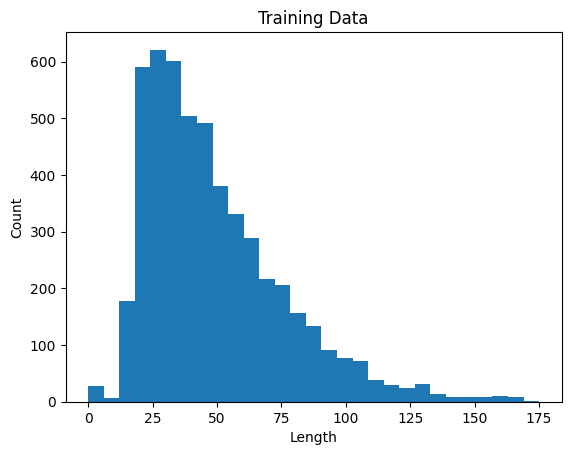

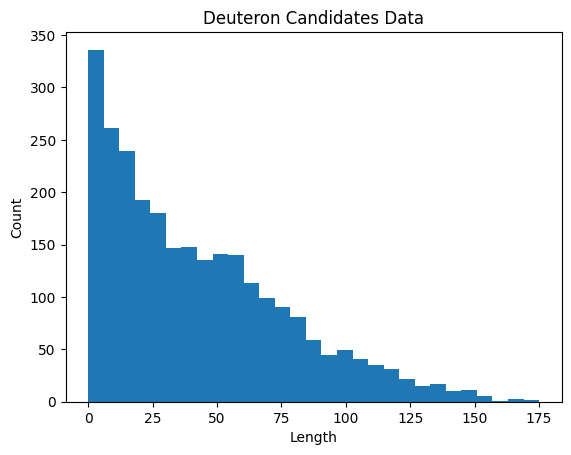

In [113]:
plt.hist(p_l, bins=bins); plt.title('Training Data'); plt.xlabel('Length'); plt.ylabel('Count'); plt.show()
plt.hist(d_l, bins=bins); plt.title('Deuteron Candidates Data'); plt.xlabel('Length'); plt.ylabel('Count'); plt.show()

In [111]:
latent_vectors.shape

(4126, 16)

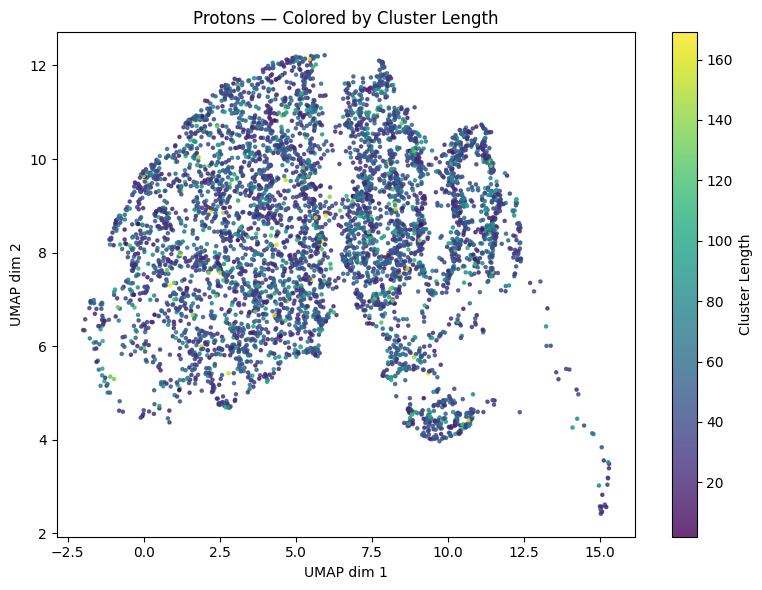

In [ ]:
fig = plt.figure(figsize=(8, 6))

# Scatter plot colored by cluster length
sc = plt.scatter(E_p[:, 0], E_p[:, 1],
                 c=p_l, cmap='viridis', s=5, alpha=0.8)

# Add a colorbar to indicate cluster length
cbar = plt.colorbar(sc)
cbar.set_label("Cluster Length")

plt.title("Protons — Colored by Cluster Length")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
# plt.savefig('length.png', dpi=1000)
plt.show()

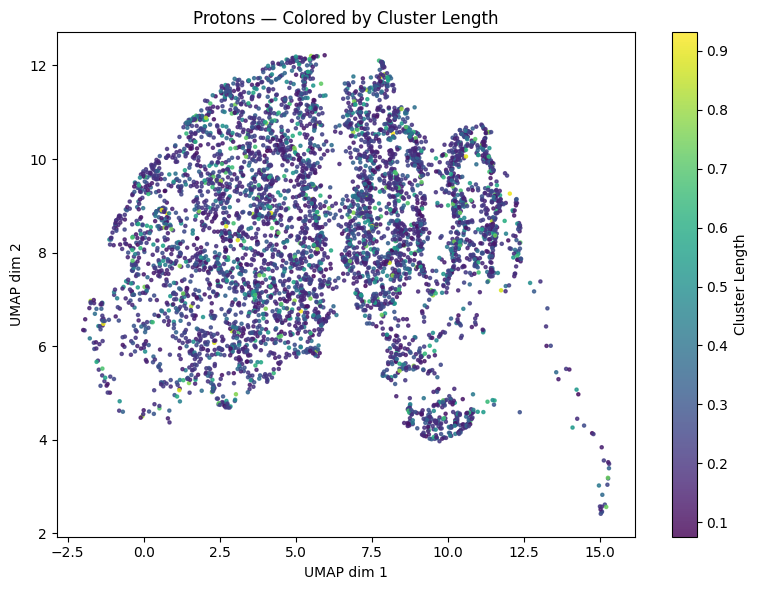

In [ ]:
fig = plt.figure(figsize=(8, 6))

# Scatter plot colored by cluster length
sc = plt.scatter(E_p[:, 0], E_p[:, 1],
                 c=p_diff, cmap='viridis', s=5, alpha=0.8)

# Add a colorbar to indicate cluster length
cbar = plt.colorbar(sc)
cbar.set_label("Cluster Length")

plt.title("Protons — Colored by Cluster Length")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
# plt.savefig('length.png', dpi=1000)
plt.show()

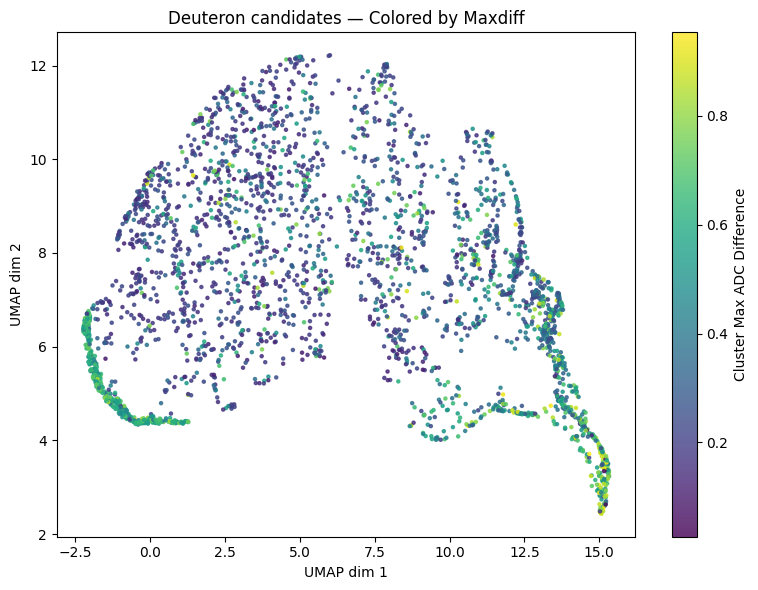

In [ ]:
fig = plt.figure(figsize=(8, 6))

# Scatter plot colored by cluster length
sc = plt.scatter(E_d[:, 0], E_d[:, 1],
                 c=d_diff, cmap='viridis', s=5, alpha=0.8)

# Add a colorbar to indicate cluster length
cbar = plt.colorbar(sc)
cbar.set_label("Cluster Max ADC Difference")

plt.title("Deuteron candidates — Colored by Maxdiff")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
# plt.savefig('maxdiff.png', dpi=1000)
plt.show()

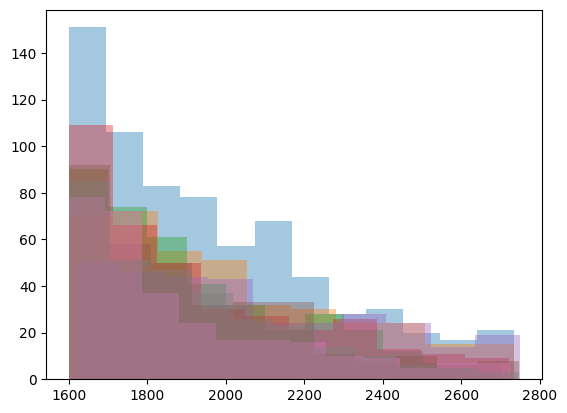

In [ ]:
for i in range(8):
    mass = d_m[labels == i]
    plt.hist(mass, bins='auto', alpha=0.4, label=f'Label {i}')

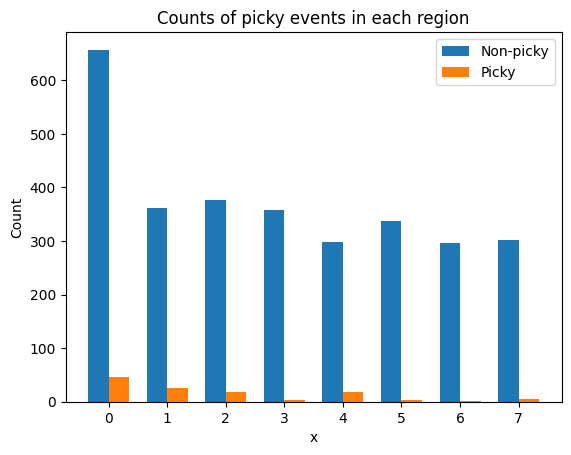

In [ ]:
k = 8
counts = np.zeros((k, 2))  # rows: x, cols: label
for i in range(k):
    for j in [0, 1]:
        counts[i, j] = np.sum((labels == i) & (d_p == j))

x_vals = np.arange(k)  # positions for x = 0, 1
width = 0.35

plt.bar(x_vals - width/2, counts[:, 0], width, label='Non-picky', color='tab:blue')
plt.bar(x_vals + width/2, counts[:, 1], width, label='Picky', color='tab:orange')

# plt.xticks(x_vals, ['x=0', 'x=1', 'x=2', 'x=3'])
plt.ylabel('Count')
plt.xlabel('x')
plt.legend()
plt.title('Counts of picky events in each region')
plt.show()


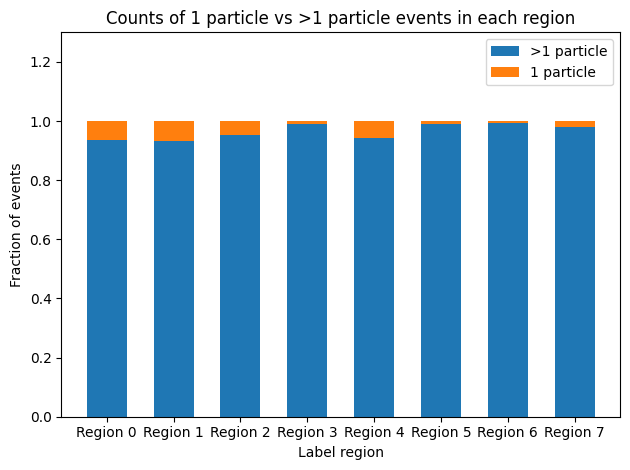

In [ ]:
k = 8
counts = np.zeros((k, 2))  # rows: label (0–5), cols: [non-picky, picky]

for i in range(k):
    for j in [0, 1]:
        counts[i, j] = np.sum((labels == i) & (d_p == j))

# Normalise per label
row_sums = counts.sum(axis=1, keepdims=True)
counts_norm = np.divide(counts, row_sums, where=row_sums != 0)  # avoid divide-by-zero

x_vals = np.arange(k)
width = 0.6

# plt.figure(figsize=(8, 5))
plt.bar(x_vals, counts_norm[:, 0], width, label='>1 particle', color='tab:blue')
plt.bar(x_vals, counts_norm[:, 1], width, bottom=counts_norm[:, 0],
        label='1 particle', color='tab:orange')

plt.ylabel('Fraction of events')
plt.xlabel('Label region')
plt.title('Counts of 1 particle vs >1 particle events in each region')
plt.xticks(x_vals, [f'Region {i}' for i in range(k)])
plt.ylim(0, 1.3)
plt.legend()
plt.tight_layout()
plt.savefig('pickyCount.png', dpi=1000)
plt.show()


In [ ]:
# look at mass plot of just the picky

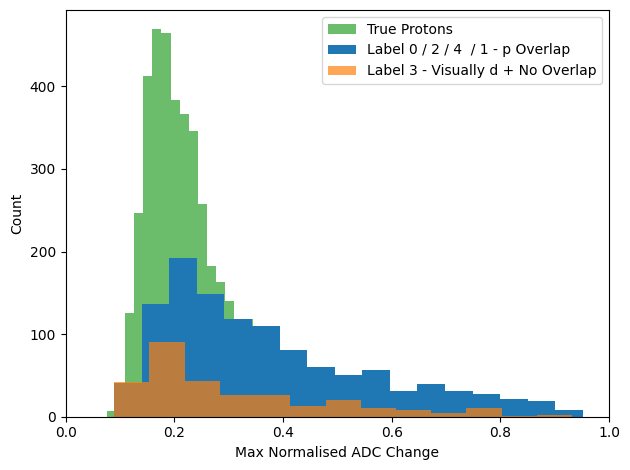

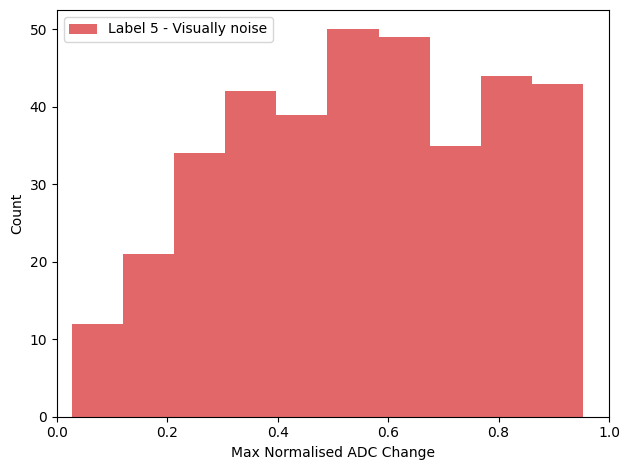

In [ ]:
mass_0 = d_diff[(labels == 0) | (labels == 2) | (labels == 5) | (labels == 1) ]
mass_1 = d_diff[(labels == 1)]
mass_2 = d_diff[(labels == 4)]
mass_3 = p_diff

# Plot
plt.hist(mass_3, bins='auto', alpha=0.7, label='True Protons', color='tab:green')
plt.hist(mass_0, bins='auto', alpha=1.0, label='Label 0 / 2 / 4  / 1 - p Overlap', color='tab:blue')
plt.hist(mass_1, bins='auto', alpha=0.7, label='Label 3 - Visually d + No Overlap', color='tab:orange')
plt.xlim(0, 1)
plt.xlabel('Max Normalised ADC Change')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()

plt.hist(mass_2, bins='auto', alpha=0.7, label='Label 5 - Visually noise', color='tab:red')


# plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')

plt.xlim(0, 1)
plt.xlabel('Max Normalised ADC Change')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()

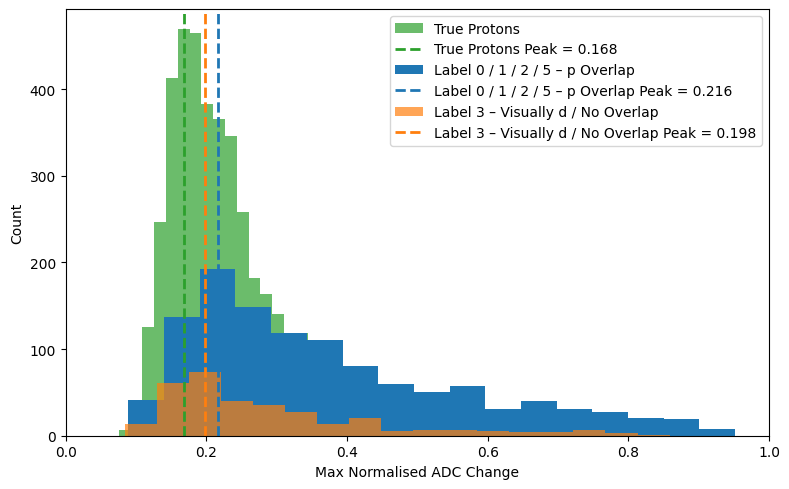

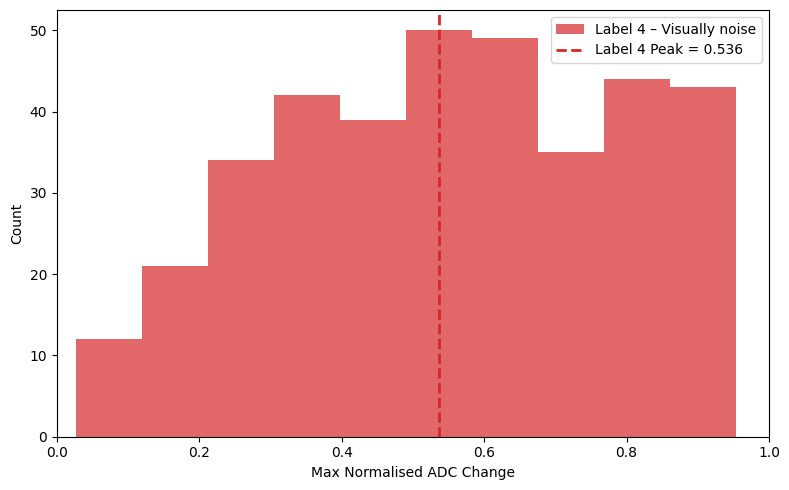

In [ ]:
mass_0 = d_diff[(labels == 0) | (labels == 1) | (labels == 2) | (labels == 5)]
mass_1 = d_diff[(labels == 3)]
mass_2 = d_diff[(labels == 4)]
mass_3 = p_diff

plt.figure(figsize=(8, 5))

datasets = [
    (mass_3, 'True Protons', 'tab:green', 0.7),
    (mass_0, 'Label 0 / 1 / 2 / 5 – p Overlap', 'tab:blue', 1.0),
    (mass_1, 'Label 3 – Visually d / No Overlap', 'tab:orange', 0.7),
]

for data, label, colour, alpha in datasets:
    counts, bins, _ = plt.hist(data, bins='auto', alpha=alpha, label=label, color=colour)
    max_bin_idx = np.argmax(counts)
    peak_x = 0.5 * (bins[max_bin_idx] + bins[max_bin_idx + 1])
    plt.axvline(peak_x, color=colour, linestyle='--', linewidth=2,
                label=f'{label} Peak = {peak_x:.3f}')

plt.xlim(0, 1)
plt.xlabel('Max Normalised ADC Change')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(8, 5))
counts, bins, _ = plt.hist(mass_2, bins='auto', alpha=0.7, label='Label 4 – Visually noise', color='tab:red')
max_bin_idx = np.argmax(counts)
peak_x = 0.5 * (bins[max_bin_idx] + bins[max_bin_idx + 1])
plt.axvline(peak_x, color='tab:red', linestyle='--', linewidth=2,
            label=f'Label 4 Peak = {peak_x:.3f}')

plt.xlim(0, 1)
plt.xlabel('Max Normalised ADC Change')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()


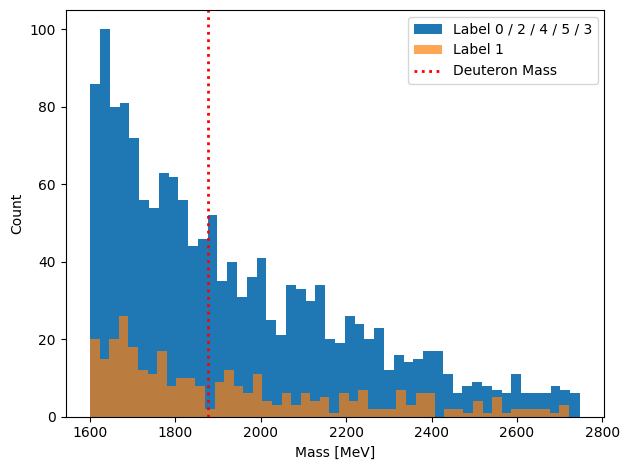

In [ ]:
mass_0 = d_m[(labels == 0) | (labels == 2) | (labels == 4) | (labels == 5) | (labels == 1) ]
mass_1 = d_m[(labels == 3)]

# Plot
plt.hist(mass_0, bins=50, alpha=1.0, label='Label 0 / 2 / 4 / 5 / 3', color='tab:blue')
plt.hist(mass_1, bins=50, alpha=0.7, label='Label 1', color='tab:orange')
plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')

plt.xlabel('Mass [MeV]')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.show()

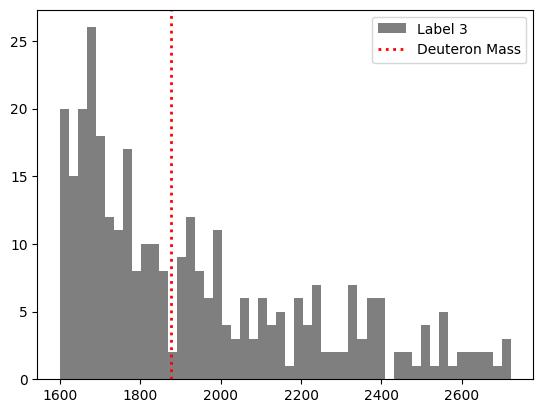

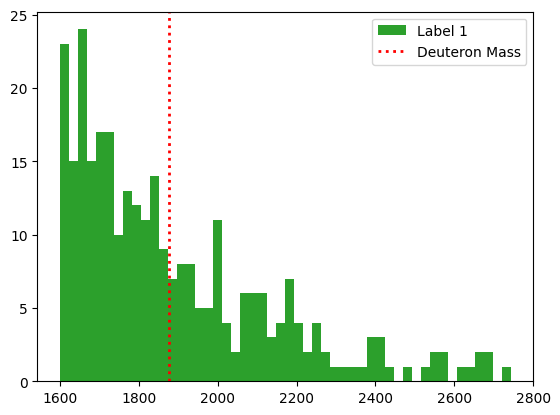

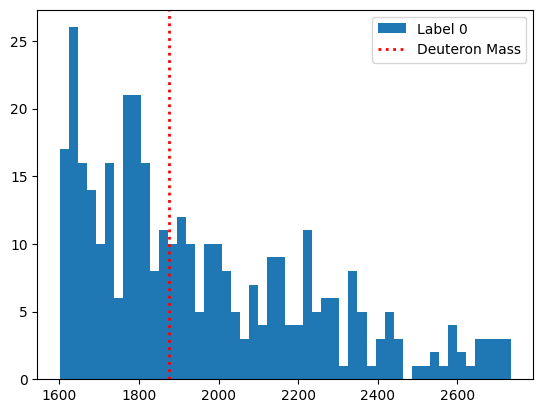

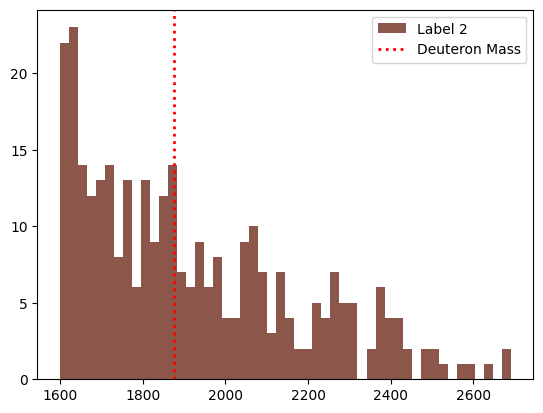

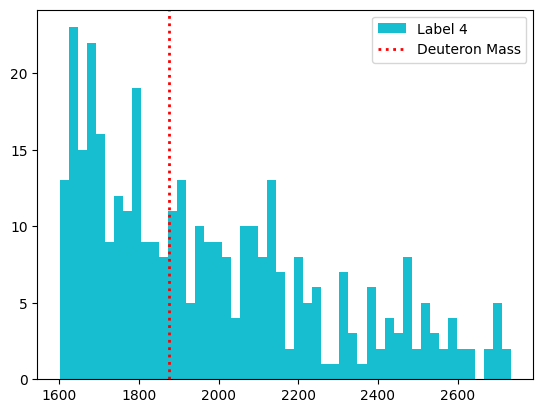

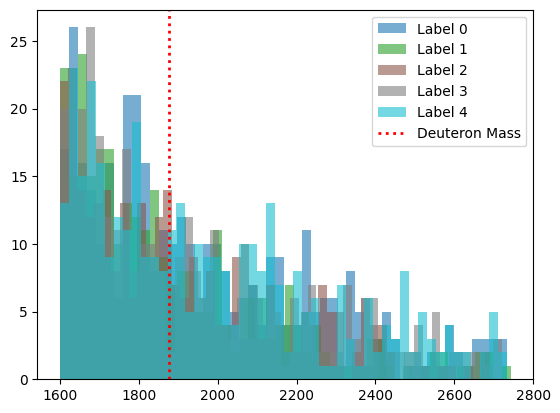

In [ ]:
labels = labels_km

m0 = d_m[(labels == 0)]
m1 = d_m[(labels == 1)]
m2 = d_m[(labels == 2)]
m3 = d_m[(labels == 3)]
m4 = d_m[(labels == 4)]
m5 = d_m[(labels == 5)]


label_colours = {
    0: 'tab:blue',   
    1: 'tab:green',  
    2: 'tab:brown',  
    3: 'tab:gray',   
    4: 'tab:cyan'   
}

plt.hist(m3, bins=50, alpha=1, color=label_colours[3], label='Label 3')
plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')
plt.legend(); plt.show()

plt.hist(m1, bins=50, alpha=1, color=label_colours[1], label='Label 1')
plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')
plt.legend(); plt.show()

plt.hist(m0, bins=50, alpha=1, color=label_colours[0], label='Label 0')
plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')
plt.legend(); plt.show()

plt.hist(m2, bins=50, alpha=1, color=label_colours[2], label='Label 2')
plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')
plt.legend(); plt.show()

plt.hist(m4, bins=50, alpha=1, color=label_colours[4], label='Label 4')
plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')
plt.legend(); plt.show()

for i, m in enumerate([m0, m1, m2, m3, m4]):
    plt.hist(m, bins=50, alpha=0.6, color=label_colours[i], label=f'Label {i}')

plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')
plt.legend(); plt.show()


In [ ]:
d_p.shape, d_m.shape, labels.shape

((2421,), (2421,), (2421,))

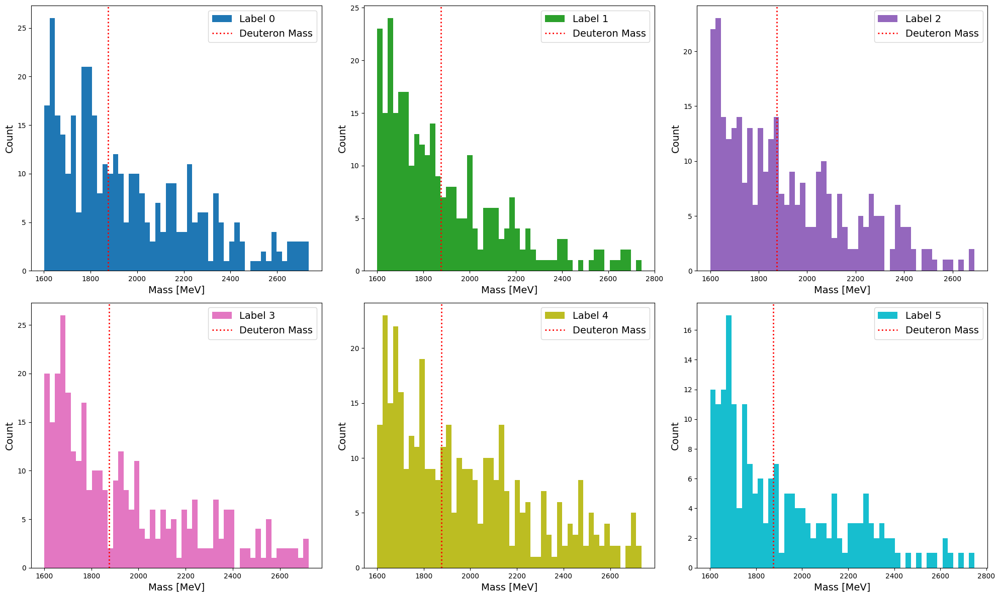

In [ ]:
# Define consistent colours
label_colours = {
    0: 'tab:blue',
    1: 'tab:green',
    2: 'tab:purple',
    3: 'tab:pink',
    4: 'tab:olive',
    5: 'tab:cyan'
}

# Your datasets
datasets = {0: m0, 1: m1, 2: m2, 3: m3, 4: m4, 5:m5}

# Create a grid (2 rows, 3 columns)
fig, axes = plt.subplots(2, 3, figsize=(20, 12))
axes = axes.flatten()

for i, label in enumerate(datasets.keys()):
    ax = axes[i]
    ax.hist(datasets[label], bins=50, alpha=1, color=label_colours[label], label=f'Label {label}')
    ax.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')
    ax.legend(fontsize=14)
    ax.set_xlabel('Mass [MeV]', fontsize=14)
    ax.set_ylabel('Count', fontsize=14)

# Hide any unused subplot (since we have 5 plots but 6 slots)
for j in range(len(datasets), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
# plt.savefig('labelsvmass.png', dpi=500)
plt.show()


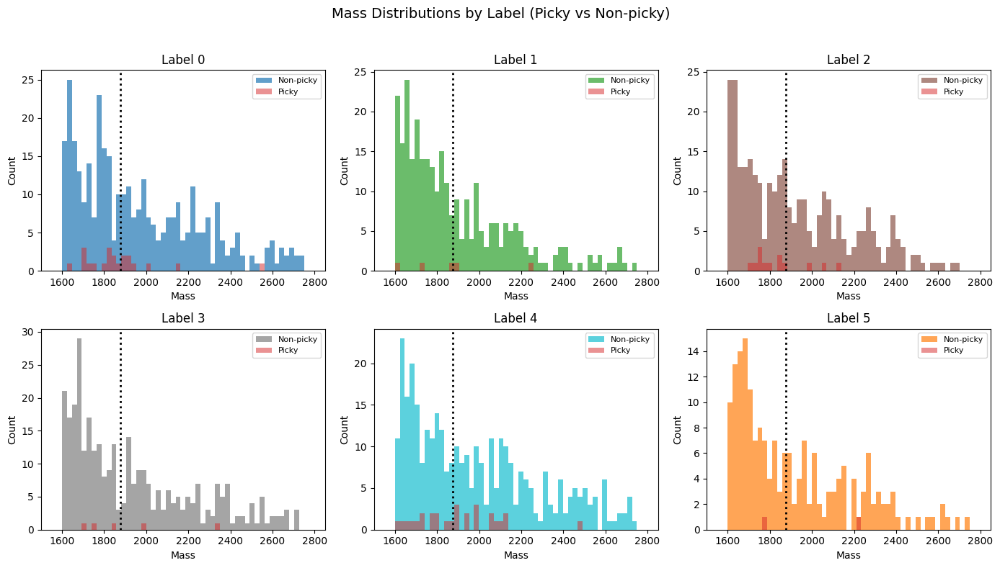

In [ ]:
labels = labels_km

label_colours = {
    0: 'tab:blue',
    1: 'tab:green',
    2: 'tab:brown',
    3: 'tab:gray',
    4: 'tab:cyan',
    5: 'tab:orange'
}

unique_labels = np.unique(labels)

fig, axes = plt.subplots(2, 3, figsize=(14, 8))
axes = axes.flatten()

bins = np.linspace(1600, 2750, 50)

for ax, lbl in zip(axes, unique_labels):
    mask = (labels == lbl)
    m_label = d_m[mask]
    m_label_picky = d_m[mask & (d_p == 1)]
    m_label_nonpicky = d_m[mask & (d_p == 0)]

    # Plot both histograms
    ax.hist(m_label_nonpicky, bins=bins, alpha=0.7,
            color=label_colours.get(lbl, 'tab:gray'),
            label='Non-picky')
    ax.hist(m_label_picky, bins=bins, alpha=0.5,
            color='tab:red',
            label='Picky')

    # Deuteron mass line
    ax.axvline(1875.6, c='black', linestyle=':', linewidth=2)

    ax.set_title(f'Label {lbl}')
    ax.set_xlim(1500, 2850)
    ax.set_xlabel('Mass')
    ax.set_ylabel('Count')
    ax.legend(fontsize=8)

# Hide any unused subplots (if fewer than 6 clusters)
for ax in axes[len(unique_labels):]:
    ax.axis('off')

plt.suptitle('Mass Distributions by Label (Picky vs Non-picky)', fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_52256/281858489.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap('tab10', num_labels)  # You can also try 'tab20' or 'Set3'


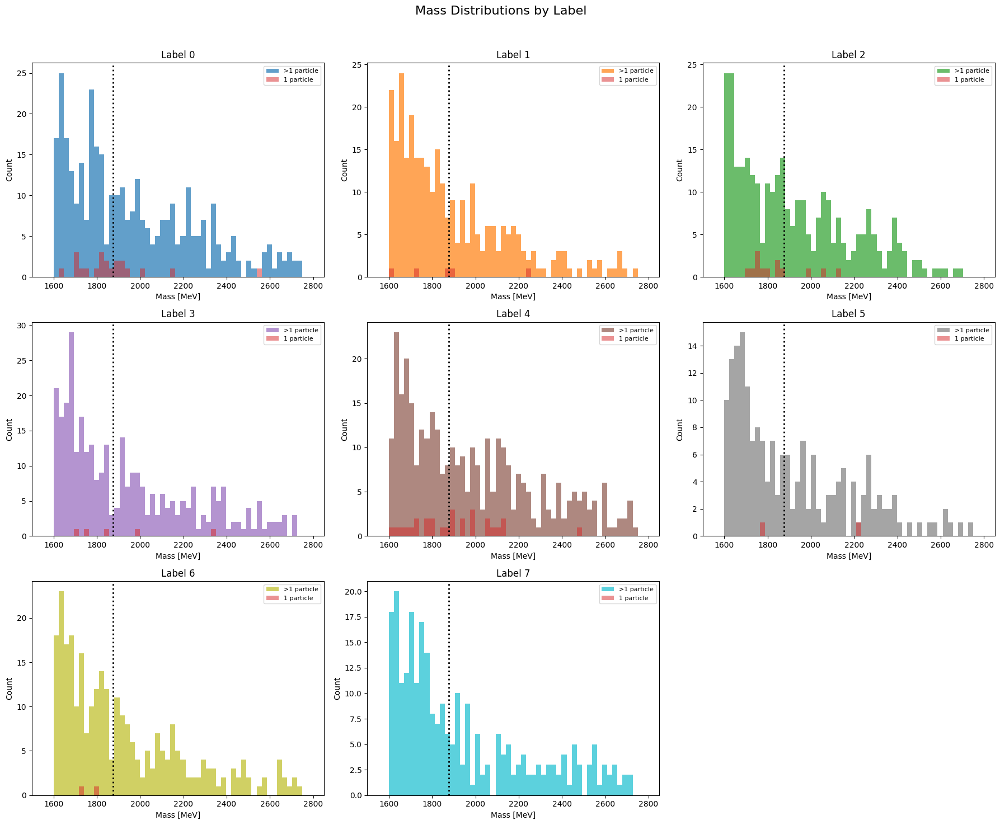

In [ ]:
import math

unique_labels = np.unique(labels)

num_labels = len(unique_labels)
cmap = plt.cm.get_cmap('tab10', num_labels)  # You can also try 'tab20' or 'Set3'
label_colours = {lbl: cmap(i) for i, lbl in enumerate(unique_labels)}

# Determine subplot grid size automatically (square-like layout)
n_cols = math.ceil(math.sqrt(num_labels))
n_rows = math.ceil(num_labels / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(6 * n_cols, 5 * n_rows))
axes = np.array(axes).flatten()

bins = np.linspace(1600, 2750, 50)

for ax, lbl in zip(axes, unique_labels):
    mask = (labels == lbl)
    m_label = d_m[mask]
    m_label_picky = d_m[mask & (d_p == 1)]
    m_label_nonpicky = d_m[mask & (d_p == 0)]

    # Plot histograms
    ax.hist(m_label_nonpicky, bins=bins, alpha=0.7,
            color=label_colours[lbl],
            label='>1 particle')
    ax.hist(m_label_picky, bins=bins, alpha=0.5,
            color='tab:red',
            label='1 particle')

    # Deuteron mass line
    ax.axvline(1875.6, c='black', linestyle=':', linewidth=2)

    ax.set_title(f'Label {lbl}', fontsize=12)
    ax.set_xlim(1500, 2850)
    ax.set_xlabel('Mass [MeV]', fontsize=10)
    ax.set_ylabel('Count', fontsize=10)
    ax.legend(fontsize=8)

# Hide unused subplots (if any)
for ax in axes[len(unique_labels):]:
    ax.axis('off')

plt.suptitle('Mass Distributions by Label', fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig('pickyinMass.png', dpi=1000)

plt.show()


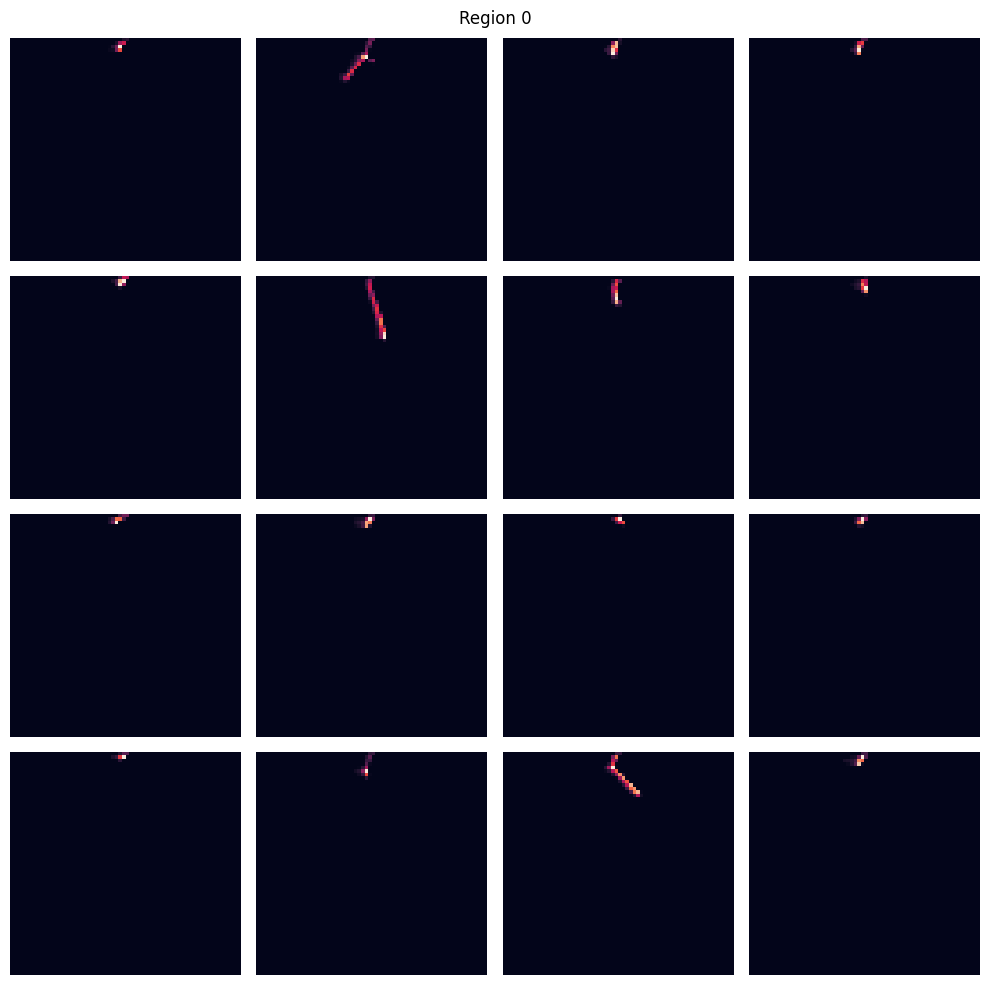

In [ ]:
num_images = 16  # Number of images to display
grid_size = int(np.ceil(np.sqrt(num_images)))  # Grid dimensions (grid_size x grid_size)

# Filter the original images for the selected cluster
cluster_id = 0 # Change this to the desired cluster ID
cluster_mask = (labels_km == cluster_id)
cluster_indices = np.where(cluster_mask)[0]

# Randomly select up to `num_images` images from the cluster
if len(cluster_indices) > num_images:
    selected_indices = np.random.choice(cluster_indices, size=num_images, replace=False)
else:
    selected_indices = cluster_indices

selected_images = d[selected_indices]

fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))

for i in range(grid_size * grid_size):
    ax = axes[i // grid_size, i % grid_size]
    if i < len(selected_images):
        sns.heatmap(selected_images[i, 1], ax=ax, cbar=False, xticklabels=False, yticklabels=False)
    else:
        ax.axis('off')  # Turn off unused subplots

fig.suptitle(f'Region {cluster_id}')
plt.tight_layout()
plt.show()

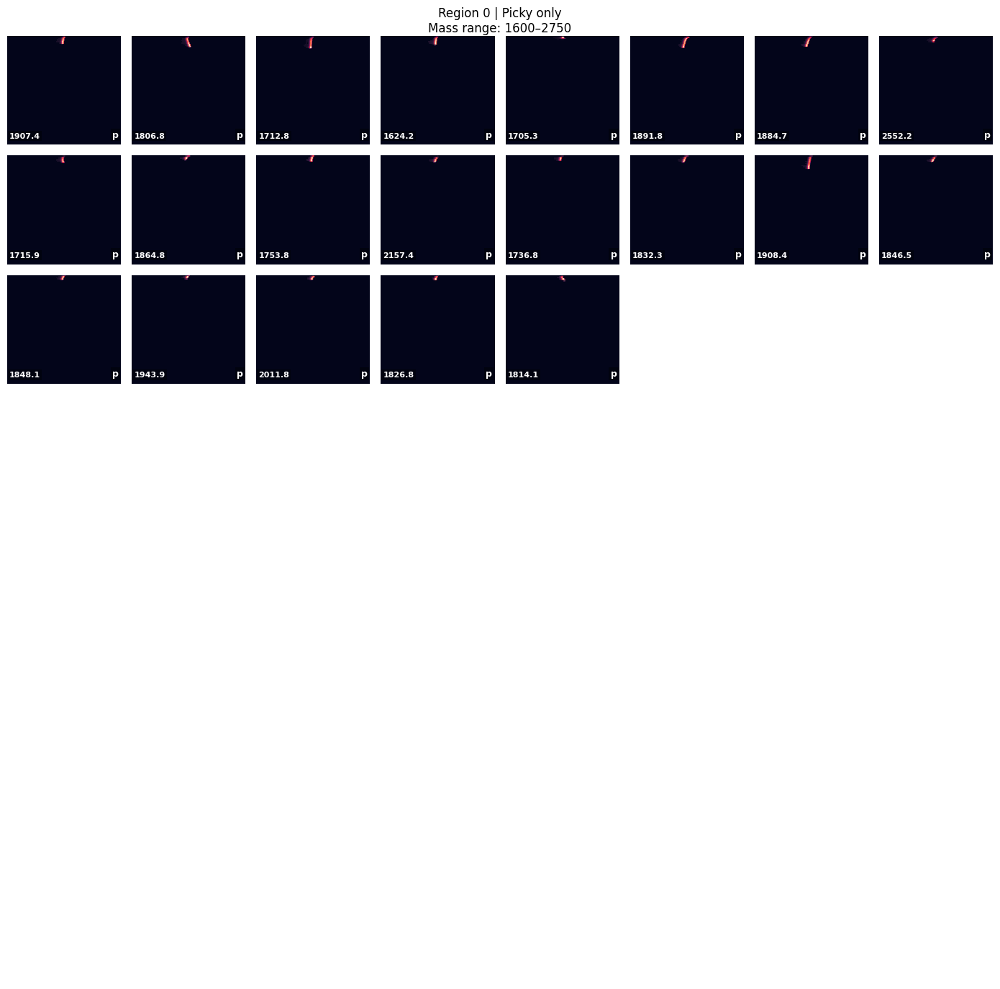

In [ ]:
num_images = 64
grid_size = int(np.ceil(np.sqrt(num_images)))

# --- Selection parameters ---
cluster_id = 0
mass_min, mass_max = 1600, 2750
picky_only = True  # True = picky only, False = non-picky only, None = both

# --- Masks ---
cluster_mask = (labels_km == cluster_id)
mass_mask = (d_m >= mass_min) & (d_m <= mass_max)

if picky_only is True:
    picky_mask = (d_p == 1)
elif picky_only is False:
    picky_mask = (d_p == 0)
else:
    picky_mask = np.ones_like(d_p, dtype=bool)

combined_mask = cluster_mask & mass_mask & picky_mask
selected_indices = np.where(combined_mask)[0]

# --- Randomly select subset ---
if len(selected_indices) > num_images:
    selected_indices = np.random.choice(selected_indices, size=num_images, replace=False)

selected_images = deutimages[selected_indices]
selected_masses = d_m[selected_indices]
selected_picky = d_p[selected_indices]

# --- Plot ---
fig, axes = plt.subplots(grid_size, grid_size, figsize=(14, 14))

for i in range(grid_size * grid_size):
    ax = axes[i // grid_size, i % grid_size]
    if i < len(selected_images):
        sns.heatmap(selected_images[i, 1], ax=ax, cbar=False,
                    xticklabels=False, yticklabels=False)

        # --- Annotate mass (bottom-left) ---
        ax.text(0.02, 0.05, f"{selected_masses[i]:.1f}",
                transform=ax.transAxes,
                fontsize=8, color='white', ha='left', va='bottom',
                fontweight='bold',
                bbox=dict(facecolor='black', alpha=0.4, lw=0, pad=1.5))

        # --- Annotate 'p' if picky (bottom-right) ---
        if selected_picky[i] == 1:
            ax.text(0.98, 0.05, 'p',
                    transform=ax.transAxes,
                    fontsize=9, color='white', ha='right', va='bottom',
                    fontweight='bold',
                    bbox=dict(facecolor='black', alpha=0.4, lw=0, pad=1.5))
    else:
        ax.axis('off')

# --- Title ---
sel_type = (
    "Picky only" if picky_only is True else
    "Non-picky only" if picky_only is False else
    "All events"
)
fig.suptitle(f"Region {cluster_id} | {sel_type}\nMass range: {mass_min}–{mass_max}",
             fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
# cluster_id = 3

# cluster_mask = (labels_km == cluster_id)
# cluster_indices = np.where(cluster_mask)[0]
# print(f"Cluster {cluster_id}: {len(cluster_indices)} samples")

# filtered_idx = cluster_indices[(RE_per_sample_d[cluster_indices] >= 0) &
#                                (RE_per_sample_d[cluster_indices] < 3000)]

# print(f"Filtered: {len(filtered_idx)} samples with RE in range")

# k = min(10, len(filtered_idx))
# if k == 0:
#     print(f"No samples found in cluster {cluster_id} with RE in range.")
# else:
#     selected = np.random.choice(filtered_idx, size=k, replace=False)

#     fig, axs = plt.subplots(k, 2, figsize=(6, 3*k))
#     for ii in range(k):
#         idx = selected[ii]
#         axs[ii, 0].imshow(Xd_np[idx], cmap='viridis', aspect='auto')
#         axs[ii, 0].set_title(f"Original (idx={idx}, RE={RE_per_sample_d[idx]:.1f})")
#         axs[ii, 0].axis('off')

#         axs[ii, 1].imshow(recon_all[idx], cmap='viridis', aspect='auto')
#         axs[ii, 1].set_title("Reconstruction")
#         axs[ii, 1].axis('off')

#     plt.tight_layout()
#     plt.show()

Deuteron subset shape: (2421, 2)


/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_52256/859799654.py:16: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  sc = plt.scatter(E_d[:, 0], E_d[:, 1], cmap='tab10', s=5, alpha=0.8)


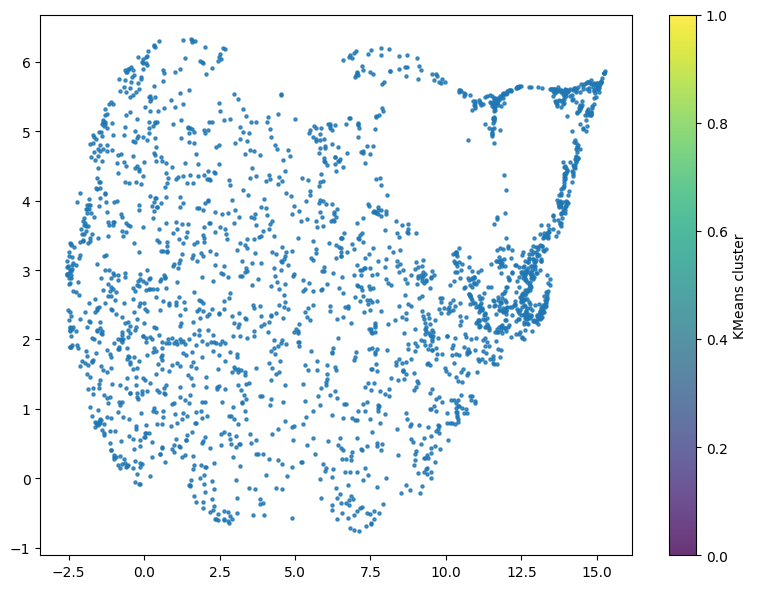

In [ ]:
Z_all = np.concatenate([latent_vectors, latent_vectors_d, latent_vectors_val], axis=0)
labels = np.concatenate([
    np.zeros(len(latent_vectors)),          # 0 = protons
    np.ones(len(latent_vectors_d)),         # 1 = deuterons
    np.full(len(latent_vectors_val), 2)     # 2 = validation
])

mask = (labels == 1)
Z_d = Z_all[mask]          # latent vectors
E_d = Z_umap[mask]      # 3D UMAP coordinates

print(f"Deuteron subset shape: {E_d.shape}")


fig = plt.figure(figsize=(8, 6))
sc = plt.scatter(E_d[:, 0], E_d[:, 1], cmap='tab10', s=5, alpha=0.8)
plt.colorbar(label='KMeans cluster')
ax.set_title("Deuteron candidates — KMeans clusters")
ax.set_xlabel("UMAP dim 1")
ax.set_ylabel("UMAP dim 2")
plt.tight_layout()
plt.show()


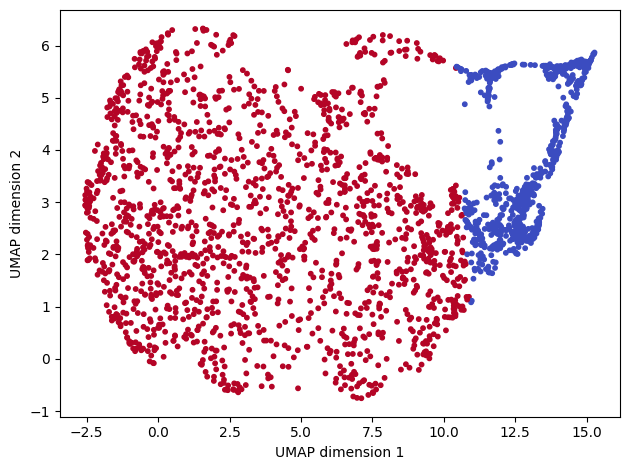

In [ ]:

# Example: UMAP coordinates
x = E_d[:, 0]
y = E_d[:, 1]

# Define your line: y = m*x + c
m = -10    # slope
c = 110    # intercept

# Compute which side each point is on
side = y < (m * x + c)
labels = side.astype(int)   # 0 or 1 cluster assignment

# Plot
# plt.figure(figsize=(7, 5))
plt.scatter(x, y, c=labels, cmap='coolwarm', s=10)
# plt.plot(x, m*x + c, 'k--', linewidth=2, label='Manual boundary')
plt.xlabel("UMAP dimension 1")
plt.ylabel("UMAP dimension 2")
# plt.legend()
plt.tight_layout()
plt.savefig('linear.png', dpi=1000)
plt.show()


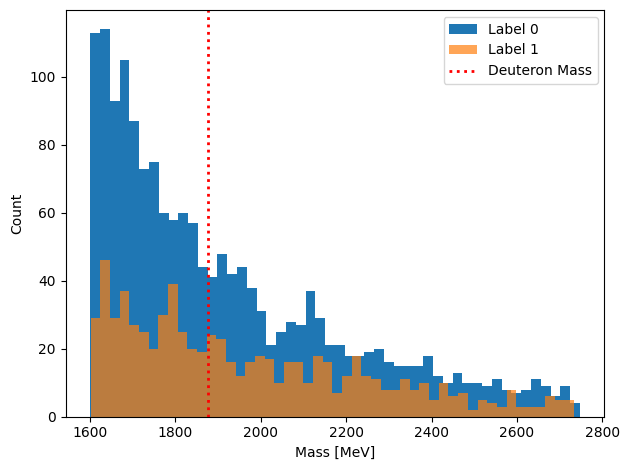

In [ ]:
mass_0 = d_m[(labels == 1)]
mass_1 = d_m[(labels == 0)]

# Plot
plt.hist(mass_0, bins=50, alpha=1.0, label='Label 0', color='tab:blue')
plt.hist(mass_1, bins=50, alpha=0.7, label='Label 1', color='tab:orange')
plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')

plt.xlabel('Mass [MeV]')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.savefig('linearcut.png', dpi=1000)
plt.show()

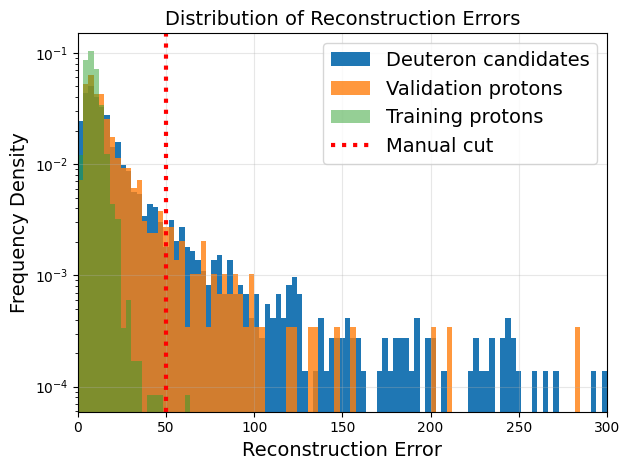

In [ ]:
# plt.figure(figsize=(12, 7))

bins = np.linspace(0, 300, 100)

plt.hist(RE_per_sample_d, bins=bins, alpha=1, label='Deuteron candidates', density=True)
plt.hist(RE_per_sample_val, bins=bins, alpha=0.8, label='Validation protons', density=True)
plt.hist(RE_per_sample, bins=bins, alpha=0.5, label='Training protons', density=True)

plt.axvline(50, linewidth=3, linestyle=":", c='red', label='Manual cut')

plt.xlabel("Reconstruction Error", fontsize=14)
plt.ylabel("Frequency Density", fontsize=14)
plt.title("Distribution of Reconstruction Errors", fontsize=14)
plt.grid(True, alpha=0.3)
plt.yscale('log')
plt.xlim(0, 300)
plt.legend(fontsize=14)
plt.tight_layout()
plt.savefig('reconerror.png', dpi=1000)
plt.show()

In [ ]:
unique, counts = np.unique(labels, return_counts=True)
unique, counts

(array([0, 1]), array([ 738, 1683]))

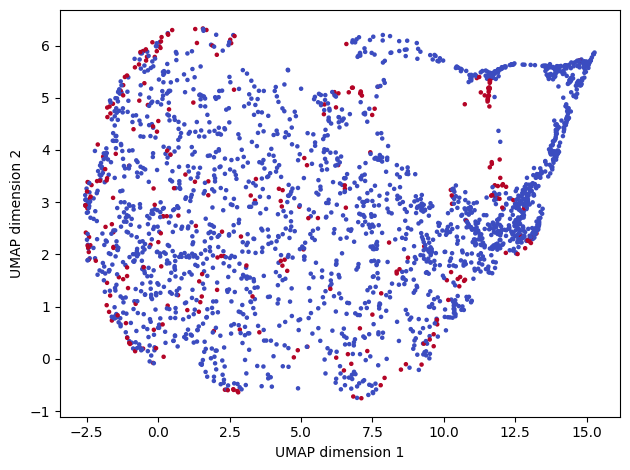

In [ ]:
labels = RE_per_sample_d > 50

x = E_d[:, 0]
y = E_d[:, 1]

plt.scatter(x, y, c=labels, cmap='coolwarm', s=5)
plt.xlabel("UMAP dimension 1")
plt.ylabel("UMAP dimension 2")
plt.tight_layout()
plt.show()


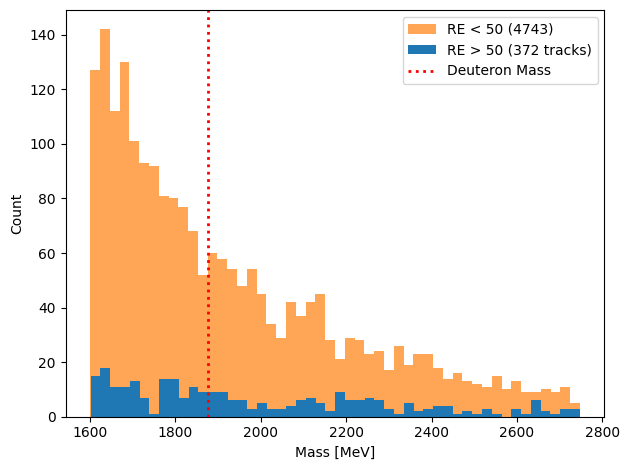

In [ ]:
mass_0 = d_m[(labels == 1)]
mass_1 = d_m[(labels == 0)]

# Plot

plt.hist(mass_1, bins=50, alpha=0.7, label='RE < 50 (4743)', color='tab:orange')
plt.hist(mass_0, bins=50, alpha=1.0, label='RE > 50 (372 tracks)', color='tab:blue')
plt.axvline(1875.6, c='red', linestyle=':', linewidth=2, label='Deuteron Mass')

plt.xlabel('Mass [MeV]')
plt.ylabel('Count')
plt.legend()
plt.tight_layout()
plt.savefig('REcutSeparation.png', dpi=1000)
plt.show()

# ANGLE PROXY

<Axes: >

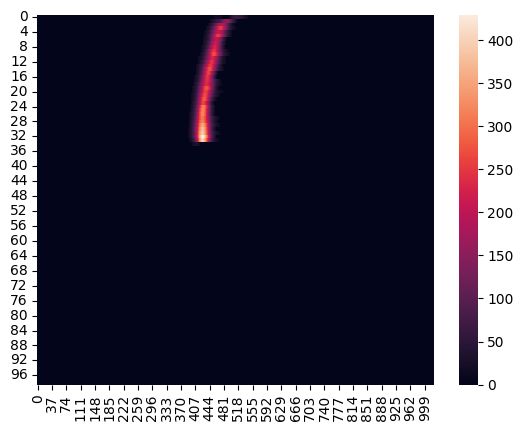

In [ ]:
sns.heatmap(p_c[1])

In [ ]:
height = col[col['particle_type'] == 'proton'].iloc[1]['height']
height

np.int64(35)

In [ ]:
a = p_c[1]
start = np.argmax(a[0,:])
end = np.argmax(a[34,:])

In [ ]:
end

np.int64(411)

In [ ]:
theta = np.arctan((start - end) / height)
theta = np.degrees(theta)
theta

np.float64(70.88702626632669)

In [ ]:
images = []

for idx, row in col.iterrows():
    padded = pad_image(
        row['image_intensity'])
    images.append(padded)

ind_images = []

for idx, row in ind.iterrows():
    padded = pad_image(
        row['image_intensity'])
    ind_images.append(padded)

In [ ]:
heights = col['height'].values
starts = np.array([np.argmax(img[0,:]) for img in images])
ends = np.array([np.argmax(img[h-1, :]) for img, h in zip(images, heights)])

thetas = np.arctan((starts - ends) / heights)
thetas = np.degrees(thetas)

col['thetas'] = thetas

In [ ]:
heights = ind['height'].values
starts = np.array([np.argmax(img[0,:]) for img in images])
ends = np.array([np.argmax(img[h-1, :]) for img, h in zip(images, heights)])

thetas = np.arctan((starts - ends) / heights)
thetas = np.degrees(thetas)

ind['thetas'] = thetas

(array([  5.,   7.,  12.,   9.,  15.,  11.,   4.,   8.,   1.,   4.,   8.,
          2.,   4.,   2.,   8.,   4.,   2.,   1.,   7.,   1.,   0.,   2.,
          3.,   0.,   1.,   3.,   3.,   4.,   1.,   3.,   4.,   1.,   3.,
          3.,   4.,   1.,   2.,   4.,   2.,   1.,   3.,   2.,   4.,   5.,
          2.,   2.,   3.,   1.,   3.,   1.,   2.,   5.,   1.,   6.,   6.,
          3.,   3.,   1.,   1.,   3.,   5.,   4.,   4.,   7.,   0.,   0.,
          5.,   5.,   7.,   4.,   0.,   3.,   5.,   3.,   4.,   4.,  12.,
          3.,   3.,   3.,   2.,   2.,   4.,   9.,   7.,   3.,   1.,   5.,
          3.,   4.,   4.,   6.,  11.,   7.,   3.,   7.,   4.,   5.,   3.,
          3.,  13.,   8.,   7.,  11.,   8.,   8.,   8.,  11.,  15.,  17.,
         12.,  14.,  19.,  13.,  14.,  29.,  21.,  22.,  30.,  36.,  28.,
         37.,  35.,  33.,  56.,  50.,  62.,  69.,  91.,  98., 135., 157.,
        154., 186., 228., 237., 310., 343., 390., 417., 519., 515., 496.,
        457., 421., 336., 223., 167., 

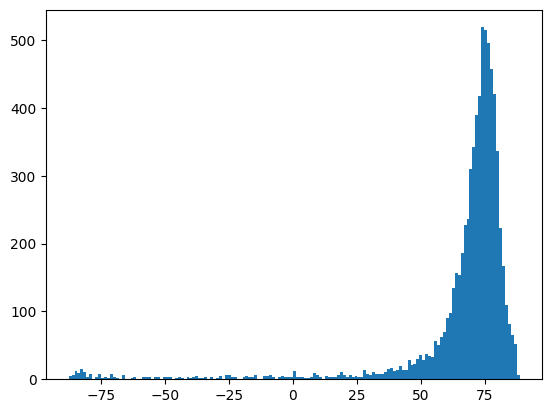

In [ ]:
plt.hist(col['thetas'], bins='auto')

# SCORING DEUTERON CANDIDATES

Using the picky deuterons 

In [ ]:
i = np.where((d_p == 1) & ((labels == 0) | (labels == 4)))[0]
len(i)

49

In [ ]:
labels[i]

array([4, 0, 0, 0, 0, 4, 4, 4, 4, 4, 0, 4, 0, 4, 0, 0, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 0, 0, 0, 4, 0, 0, 4, 4, 0, 0, 4, 0, 4, 0, 0, 4, 4, 4,
       4, 0, 0, 4, 0], dtype=int32)

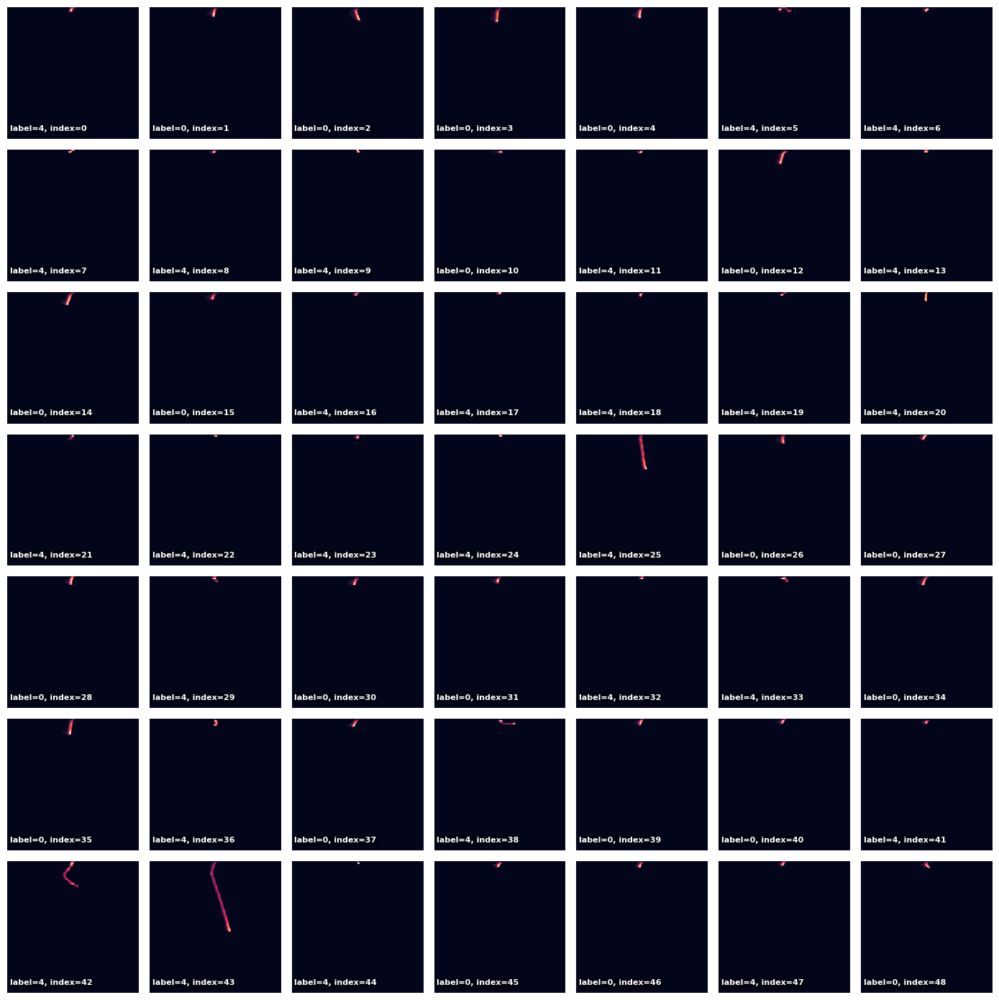

In [ ]:
num_images = len(i) 
grid_size = int(np.ceil(np.sqrt(num_images)))

selected_images = deutimages[i]
selected_labels = labels[i]

fig, axes = plt.subplots(grid_size, grid_size, figsize=(14, 14))

for img in range(grid_size * grid_size):
    ax = axes[img // grid_size, img % grid_size]
    if img < len(selected_images):
        sns.heatmap(selected_images[img, 1], ax=ax, cbar=False, xticklabels=False, yticklabels=False)
        ax.text(0.02, 0.05, f"label={selected_labels[img]:.0f}, index={img}",
            transform=ax.transAxes,
            fontsize=8, color='white', ha='left', va='bottom',
            fontweight='bold',
            bbox=dict(facecolor='black', alpha=0.4, lw=0, pad=1.5))
    else:
        ax.axis('off')  # Turn off unused subplots

        

plt.tight_layout()
plt.show()

In [ ]:
d_p.shape

(2421,)

In [ ]:
labels.shape

(2421,)

In [ ]:
latent_vectors_d.shape

(2421, 16)

In [ ]:
l = latent_vectors_d[i]
l.shape

(46, 16)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.ensemble import IsolationForest

Mean per dimension: [  1.5383993  -5.713488  -11.2432995   4.5790358  31.731953   -7.815964
   2.8729439  11.648659   -5.2238145   0.7947453  -6.584886   17.009535
  39.682285    2.2233593 -14.652217   32.172165 ]
Variance per dimension: [ 83.43004  111.32854   65.978004 156.45703  452.72522  127.41496
 432.69598   58.2821   260.4216    34.950935  55.012875 243.26347
 817.2766    64.4594    46.64105  351.5281  ]
Average variance across dimensions: 210.11662


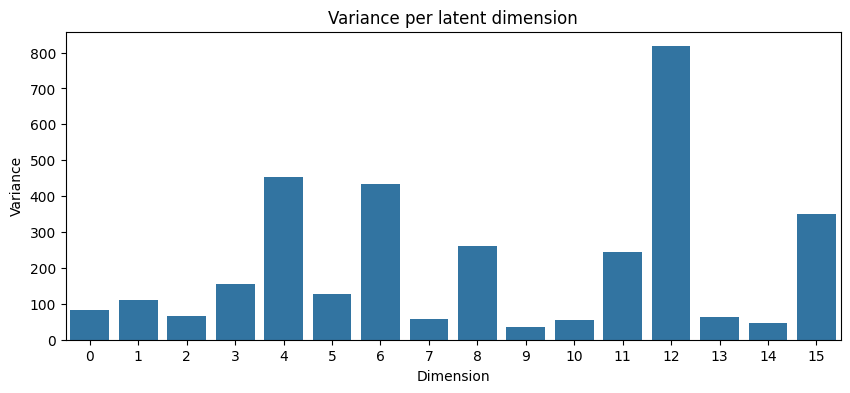

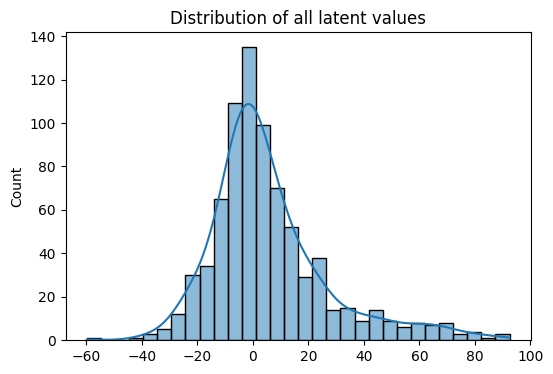

In [ ]:
# Per-dimension statistics
means = l.mean(axis=0)
stds = l.std(axis=0)
variances = l.var(axis=0)

# Summary
print("Mean per dimension:", means)
print("Variance per dimension:", variances)
print("Average variance across dimensions:", np.mean(variances))

# Visualise variance
plt.figure(figsize=(10, 4))
sns.barplot(x=np.arange(16), y=variances)
plt.title("Variance per latent dimension")
plt.xlabel("Dimension")
plt.ylabel("Variance")
plt.show()

# Optional: Distribution across all numbers
plt.figure(figsize=(6,4))
sns.histplot(l.flatten(), bins=30, kde=True)
plt.title("Distribution of all latent values")
plt.show()


Mean per dimension: [10.789544    7.4245677  -4.518595    2.5446444   5.187247    0.42325377
 -8.486302    3.275518   -6.902376   -6.128163    8.18707     4.0757475
 15.375081    1.1784196  -7.628266    6.2725616 ]
Variance per dimension: [ 366.31018  448.98068  557.4048   404.73276  980.7685   576.4596
  412.1755   546.57385  733.7253   367.03418  513.3095   598.5781
 1009.14166  575.74927  454.269    865.8417 ]
Average variance across dimensions: 588.1909


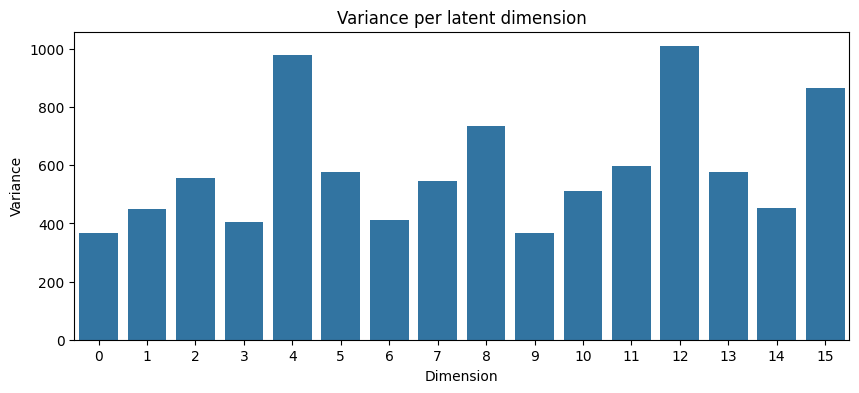

/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: overflow encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: invalid value encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)


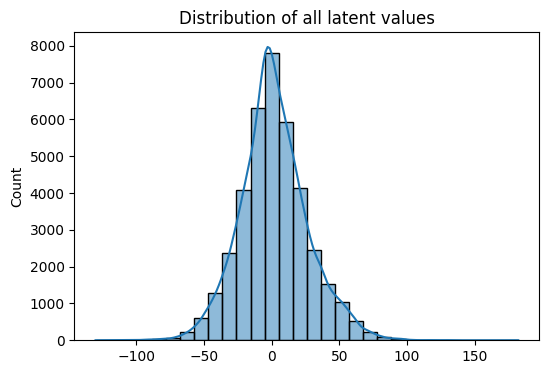

In [ ]:
# Per-dimension statistics
means = latent_vectors_d.mean(axis=0)
stds = latent_vectors_d.std(axis=0)
variances = latent_vectors_d.var(axis=0)

# Summary
print("Mean per dimension:", means)
print("Variance per dimension:", variances)
print("Average variance across dimensions:", np.mean(variances))

# Visualise variance
plt.figure(figsize=(10, 4))
sns.barplot(x=np.arange(16), y=variances)
plt.title("Variance per latent dimension")
plt.xlabel("Dimension")
plt.ylabel("Variance")
plt.show()

# Optional: Distribution across all numbers
plt.figure(figsize=(6,4))
sns.histplot(latent_vectors_d.flatten(), bins=30, kde=True)
plt.title("Distribution of all latent values")
plt.show()


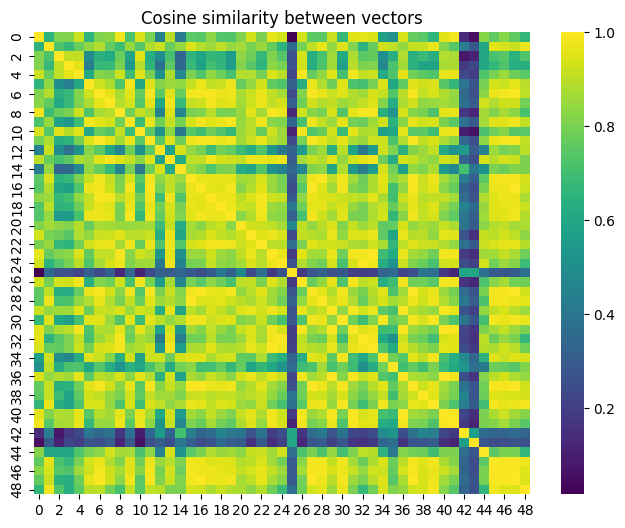

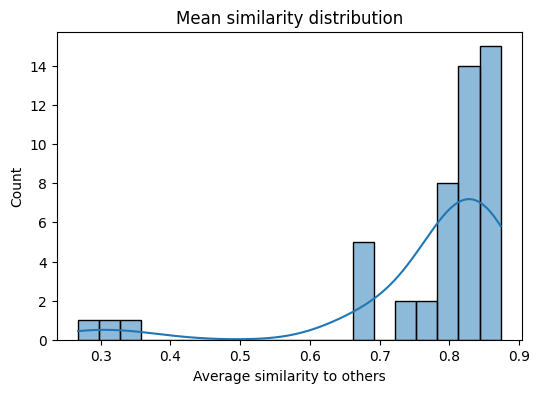

In [ ]:
# Compute pairwise cosine similarity
similarity_matrix = cosine_similarity(l)

# Show as heatmap
plt.figure(figsize=(8,6))
sns.heatmap(similarity_matrix, cmap="viridis")
plt.title("Cosine similarity between vectors")
plt.show()

# Mean similarity per vector (to see which are unusual)
mean_sim = similarity_matrix.mean(axis=1)
plt.figure(figsize=(6,4))
sns.histplot(mean_sim, bins=20, kde=True)
plt.title("Mean similarity distribution")
plt.xlabel("Average similarity to others")
plt.show()


In [ ]:
remove = np.where(mean_sim < 0.5)[0]
print(remove)
len(remove)

[25 42 43]


3

In [ ]:
f = i[43]

<Axes: >

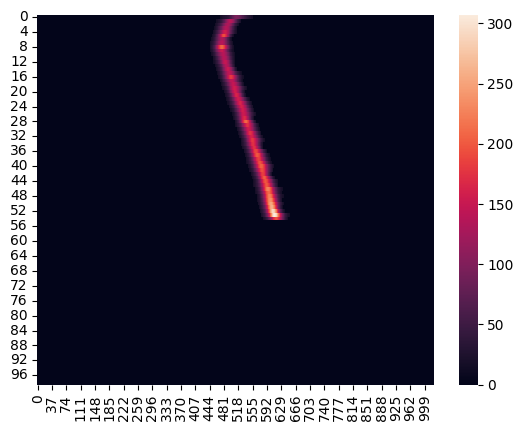

In [ ]:
sns.heatmap(deutimages[f][0])

In [ ]:
i = np.delete(i, remove)
len(i)

46

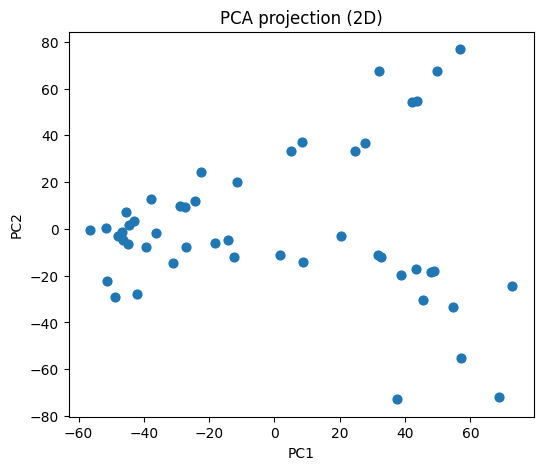

Explained variance ratio: [0.47901624 0.29321396]


In [ ]:
pca = PCA(n_components=2)
X_pca = pca.fit_transform(l)

plt.figure(figsize=(6,5))
plt.scatter(X_pca[:,0], X_pca[:,1], s=40)
plt.title("PCA projection (2D)")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()

print("Explained variance ratio:", pca.explained_variance_ratio_)


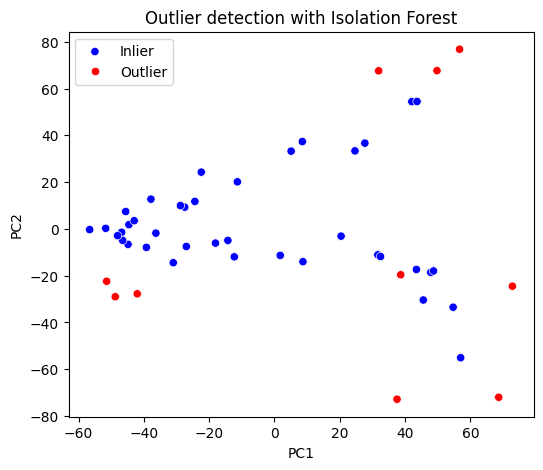

Outlier indices: [ 1  2  3 10 12 14 25 35 42 43]


In [ ]:
iso = IsolationForest(contamination=0.2, random_state=1)
outlier_labels = iso.fit_predict(l)

# Visualise outliers in PCA space
plt.figure(figsize=(6,5))
sns.scatterplot(x=X_pca[:,0], y=X_pca[:,1], hue=outlier_labels, palette={1:'blue', -1:'red'})
plt.title("Outlier detection with Isolation Forest")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.legend(["Inlier", "Outlier"])
plt.show()

# Get indices of suspected outliers
outlier_indices = np.where(outlier_labels == -1)[0]
print("Outlier indices:", outlier_indices)


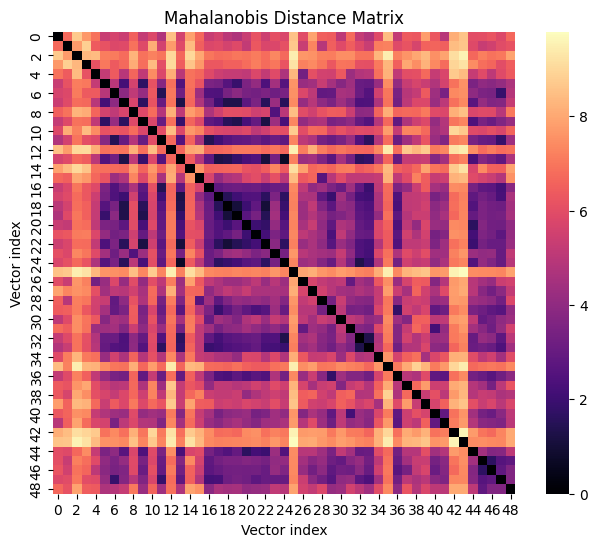

In [ ]:
import numpy as np
from scipy.spatial import distance
import seaborn as sns
import matplotlib.pyplot as plt

# Assume latent_vectors is (87, 16)
cov = np.cov(l, rowvar=False)
inv_cov = np.linalg.inv(cov)

# Compute full pairwise distance matrix
n = l.shape[0]
mahal_matrix = np.zeros((n, n))

for i in range(n):
    for j in range(n):
        mahal_matrix[i, j] = distance.mahalanobis(l[i], l[j], inv_cov)

plt.figure(figsize=(8,6))
sns.heatmap(mahal_matrix, cmap="magma", square=True)
plt.title("Mahalanobis Distance Matrix")
plt.xlabel("Vector index")
plt.ylabel("Vector index")
plt.show()


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: divide by zero encountered in matmul
  ret = a @ b
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: overflow encountered in matmul
  ret = a @ b
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/utils/extmath.py:203: RuntimeWarning: invalid value encountered in matmul
  ret = a @ b


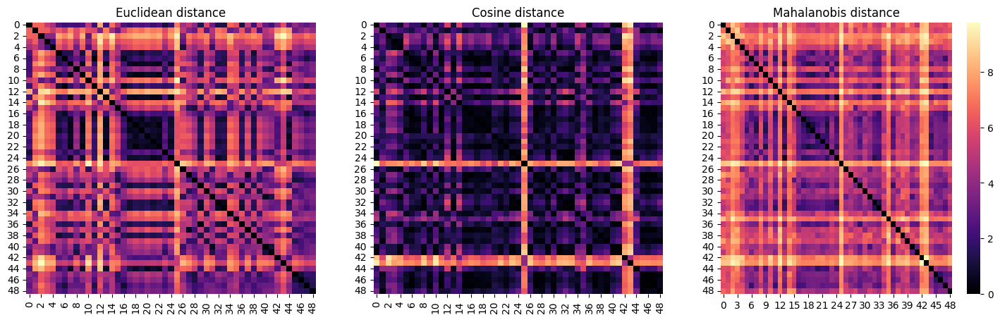

In [ ]:
from sklearn.metrics import pairwise_distances

eucl = pairwise_distances(l, metric='euclidean')
cos = pairwise_distances(l, metric='cosine')

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
sns.heatmap(eucl, ax=axes[0], cmap="magma", cbar=False)
axes[0].set_title("Euclidean distance")

sns.heatmap(cos, ax=axes[1], cmap="magma", cbar=False)
axes[1].set_title("Cosine distance")

sns.heatmap(mahal_matrix, ax=axes[2], cmap="magma")
axes[2].set_title("Mahalanobis distance")

plt.show()

In [ ]:
latent_vectors_d.shape

(2421, 16)

In [ ]:
l.shape

(49, 16)

In [ ]:
from sklearn.covariance import LedoitWolf
from sklearn.metrics.pairwise import cosine_distances
from scipy.stats import chi2

def fit_covariance(Z, use_shrinkage=True):
    """
    Z: (T, D) array used to estimate covariance (ideally many latents; can be refs+queries).
    Returns (mu, precision) where precision = Σ^{-1}.
    """
    mu = Z.mean(axis=0)
    X = Z - mu
    if use_shrinkage:
        est = LedoitWolf().fit(X)
        Sigma = est.covariance_
    else:
        Sigma = np.cov(X, rowvar=False)
    # precision
    eigvals, eigvecs = np.linalg.eigh(Sigma)
    # numerical guard
    eigvals = np.maximum(eigvals, 1e-8)
    precision = (eigvecs @ np.diag(1.0 / eigvals) @ eigvecs.T)
    return mu, precision

def pairwise_mahalanobis2(queries, refs, precision, centre=None):
    """
    Vectorised squared Mahalanobis distances between every query and reference.
    queries: (M,D), refs: (N,D), precision: (D,D).
    centre: optional mean to subtract from both sets (use the mean from fit_covariance).
    Returns D2: (M,N)
    """
    Q = queries if centre is None else (queries - centre)
    R = refs    if centre is None else (refs - centre)
    QP = Q @ precision               # (M,D)
    RP = R @ precision               # (N,D)
    q_quad = np.sum(QP * Q, axis=1)  # (M,)
    r_quad = np.sum(RP * R, axis=1)  # (N,)
    cross  = QP @ R.T                # (M,N)
    D2 = q_quad[:, None] + r_quad[None, :] - 2.0 * cross
    # numerical noise may make tiny negatives—clip
    np.maximum(D2, 0.0, out=D2)
    return D2

def score_against_references(
    refs, queries, cov_fit='all', also_cosine=True
):
    """
    refs:    (N, D) = 24 x 16
    queries: (M, D) = 2529 x 16
    cov_fit: 'all' uses refs+queries to fit Σ; 
             'refs' uses only the 24 refs (OK but less stable);
             or pass a precomputed array to fit on (e.g. training latents).
    Returns a dict of useful outputs.
    """
    D = refs.shape[1]
    if isinstance(cov_fit, str):
        if cov_fit == 'all':
            Z_for_cov = np.vstack([refs, queries])
        elif cov_fit == 'refs':
            Z_for_cov = refs
        else:
            raise ValueError("cov_fit must be 'all', 'refs', or an array.")
    else:
        Z_for_cov = np.asarray(cov_fit)

    mu, P = fit_covariance(Z_for_cov, use_shrinkage=True)

    # Squared Mahalanobis distances M x N
    D2_maha = pairwise_mahalanobis2(queries, refs, P, centre=mu)

    # Per-query best (nearest) reference
    nn_idx = np.argmin(D2_maha, axis=1)
    nn_d2  = D2_maha[np.arange(D2_maha.shape[0]), nn_idx]

    # χ² p-values for interpretability (df = D)
    p_vals = 1.0 - chi2.cdf(nn_d2, df=D)  # small p => unusually far

    out = {
        "D2_maha": D2_maha,
        "nearest_ref_index": nn_idx,
        "nearest_maha_d2": nn_d2,
        "nearest_p_value": p_vals,
    }

    if also_cosine:
        # Cosine distances (direction only). Optionally centre/whiten first if desired.
        D_cos = cosine_distances(queries, refs)  # M x N
        nn_idx_cos = np.argmin(D_cos, axis=1)
        nn_cos = D_cos[np.arange(D_cos.shape[0]), nn_idx_cos]
        out.update({
            "D_cos": D_cos,
            "nearest_ref_index_cos": nn_idx_cos,
            "nearest_cos_dist": nn_cos
        })

    return out


In [ ]:
# refs: (24,16)  your reference latent vectors
# queries: (2529,16)  the vectors to score

res = score_against_references(l, latent_vectors_d, cov_fit='all', also_cosine=True)

# Per-query best match (Mahalanobis)
nearest_ref = res["nearest_ref_index"]      # (2529,)
best_d2     = res["nearest_maha_d2"]        # squared distance
p_values    = res["nearest_p_value"]        # small p => unusual w.r.t. Σ

# Example: flag queries that are unlikely under the reference distribution
alpha = 0.01
anomalous_mask = p_values < alpha
anomalous_indices = np.where(anomalous_mask)[0]

# If you also want cosine-based nearest
nearest_ref_cos = res["nearest_ref_index_cos"]
best_cos        = res["nearest_cos_dist"]


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/linalg/_basic.py:1742: RuntimeWarning: divide by zero encountered in matmul
  B = (u * psigma_diag) @ u.conj().T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/linalg/_basic.py:1742: RuntimeWarning: overflow encountered in matmul
  B = (u * psigma_diag) @ u.conj().T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/linalg/_basic.py:1742: RuntimeWarning: invalid value encountered in matmul
  B = (u * psigma_diag) @ u.conj().T
/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_52256/746596412.py:21: RuntimeWarning: divide by zero encountered in matmul
  precision = (eigvecs @ np.diag(1.0 / eigvals) @ eigvecs.T)
/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_52256/746596412.py:21: RuntimeWarning: overflow encountered in matmul
  precision = (eigvecs @ np.diag(1.0 / eigvals) @ eigvecs.T)
/var/folders/cm/m55y72dj6cd5lkwrf

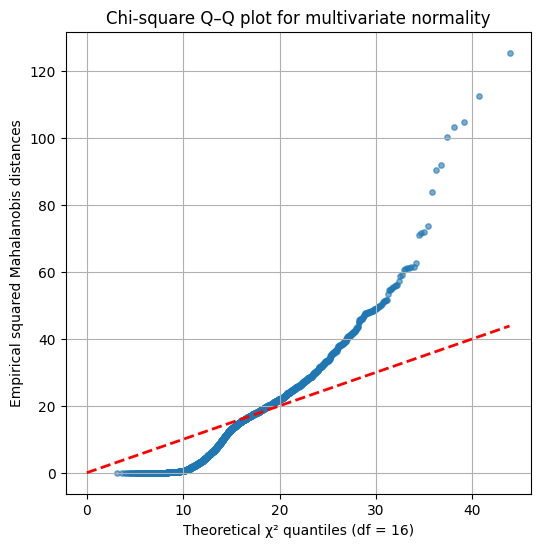

In [ ]:
X = latent_vectors_d

mu = X.mean(axis=0)
Sigma = np.cov(X, rowvar=False)

D2 = best_d2  # efficient (x-μ)^T Σ⁻¹ (x-μ)

n, D = len(D2), X.shape[1]
D2_sorted = np.sort(D2)
quantiles = chi2.ppf((np.arange(1, n+1) - 0.5) / n, df=16)

plt.figure(figsize=(6,6))
plt.scatter(quantiles, D2_sorted, s=15, alpha=0.6)
plt.plot([0, max(quantiles)], [0, max(quantiles)], 'r--', lw=2)
plt.xlabel('Theoretical χ² quantiles (df = {})'.format(D))
plt.ylabel('Empirical squared Mahalanobis distances')
plt.title('Chi-square Q–Q plot for multivariate normality')
plt.grid(True)
plt.show()


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: overflow encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: invalid value encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: overflow encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.

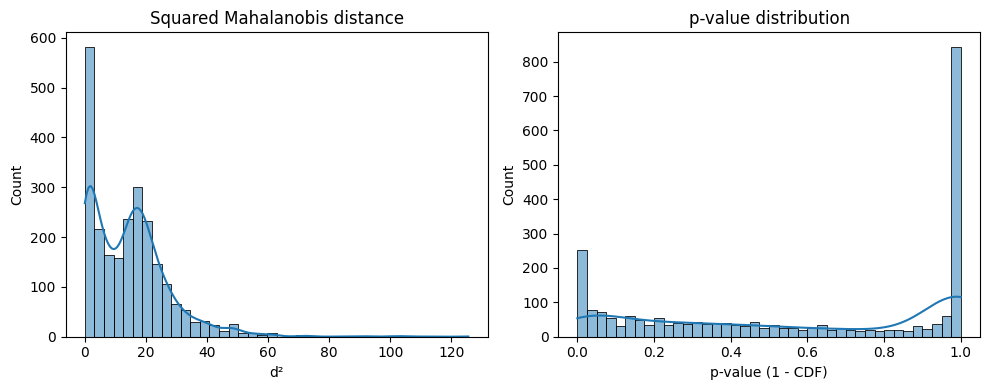

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(10, 4))

sns.histplot(best_d2, bins=40, ax=ax[0], kde=True)
ax[0].set_title("Squared Mahalanobis distance")
ax[0].set_xlabel("d²")
ax[0].set_ylabel("Count")

sns.histplot(p_values, bins=40, ax=ax[1], kde=True)
ax[1].set_title("p-value distribution")
ax[1].set_xlabel("p-value (1 - CDF)")
ax[1].set_ylabel("Count")

plt.tight_layout()
plt.show()


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: divide by zero encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: overflow encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: invalid value encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: divide by zero encountered in matmul
  X_transformed = X @ self.components_.T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: overflow encountered in matmul
  X_transformed = X @ self.components_.T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11

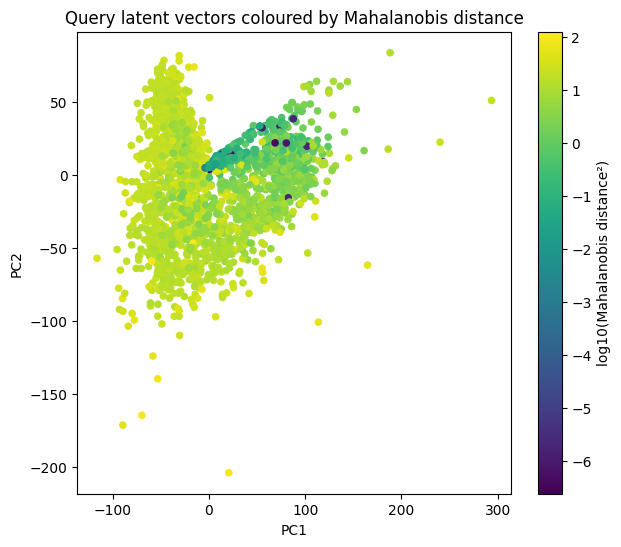

In [ ]:
X = latent_vectors_d  # your 2529 queries
pca = PCA(n_components=2)
X2d = pca.fit_transform(X)

plt.figure(figsize=(7,6))
plt.scatter(X2d[:,0], X2d[:,1], c=np.log10(best_d2), cmap="viridis", s=20)
plt.colorbar(label="log10(Mahalanobis distance²)")
plt.title("Query latent vectors coloured by Mahalanobis distance")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: divide by zero encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: overflow encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_pca.py:604: RuntimeWarning: invalid value encountered in matmul
  C = X.T @ X
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: divide by zero encountered in matmul
  X_transformed = X @ self.components_.T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/sklearn/decomposition/_base.py:148: RuntimeWarning: overflow encountered in matmul
  X_transformed = X @ self.components_.T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11

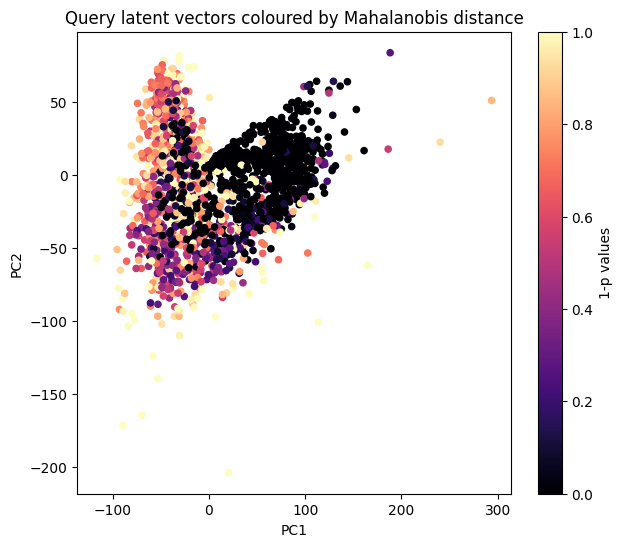

In [ ]:
from sklearn.decomposition import PCA

X = latent_vectors_d  # your 2529 queries
pca = PCA(n_components=2)
X2d = pca.fit_transform(X)

plt.figure(figsize=(7,6))
plt.scatter(X2d[:,0], X2d[:,1], c=1-p_values, cmap="magma", s=20)
plt.colorbar(label="1-p values")
plt.title("Query latent vectors coloured by Mahalanobis distance")
plt.xlabel("PC1")
plt.ylabel("PC2")
plt.show()


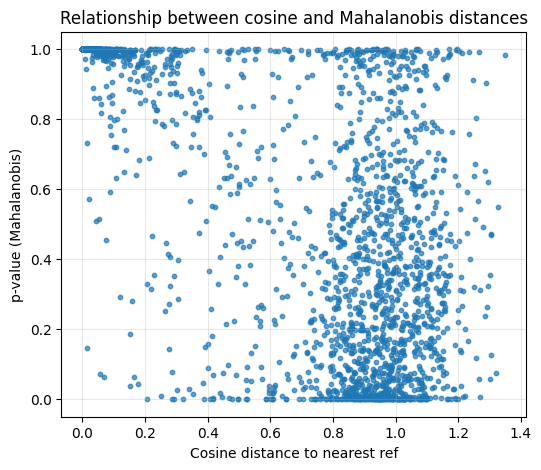

In [ ]:
plt.figure(figsize=(6,5))
plt.scatter(best_cos, p_values, s=10, alpha=0.7)
plt.xlabel("Cosine distance to nearest ref")
plt.ylabel("p-value (Mahalanobis)")
plt.title("Relationship between cosine and Mahalanobis distances")
plt.grid(True, alpha=0.3)
plt.show()


In [ ]:
print(f"Median Mahalanobis distance²: {np.median(best_d2):.2f}")
print(f"5th–95th percentile: {np.percentile(best_d2,[5,95])}")
print(f"Fraction of queries flagged as anomalies (p<0.01): {(p_values<0.01).mean()*100:.1f}%")


Median Mahalanobis distance²: 13.80
5th–95th percentile: [ 0.04835987 38.14825058]
Fraction of queries flagged as anomalies (p<0.01): 8.1%


46 reference vectors detected inside queries.
Lowest Mahalanobis (non-ref): [2398 1016 2394  362 1748 1180 2356  157  557 1942 1263 1916  461 2057
 1276  420  272 1669 1185 1869  669 1587 1569 1658 1439  378 1020 1442
  241 2000  771  179]
Highest Mahalanobis (non-ref): [ 720 1680 1989 1299 1515   79  161  346  874  463  468 2245  816  600
  943  426  425  436  843  580 2112  270 2023 1313  209 1325 2253  569
  751  175 2015  621]


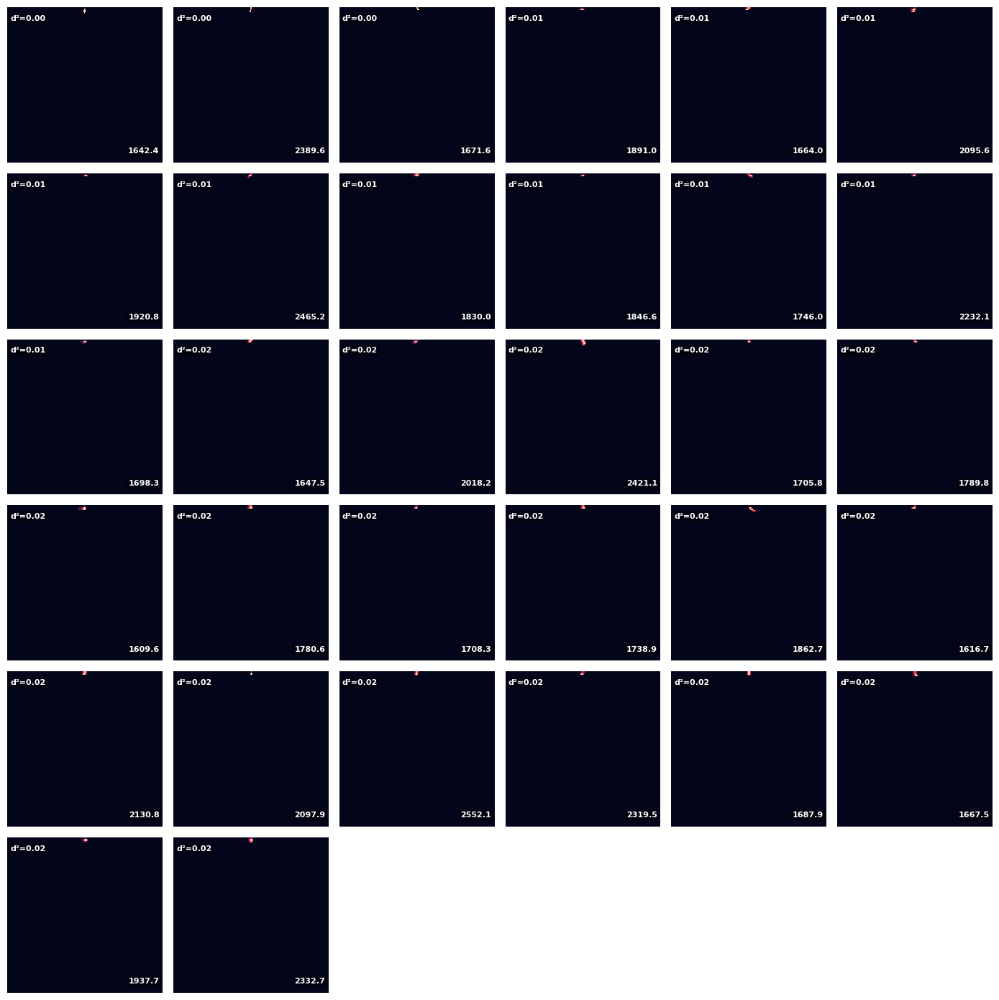

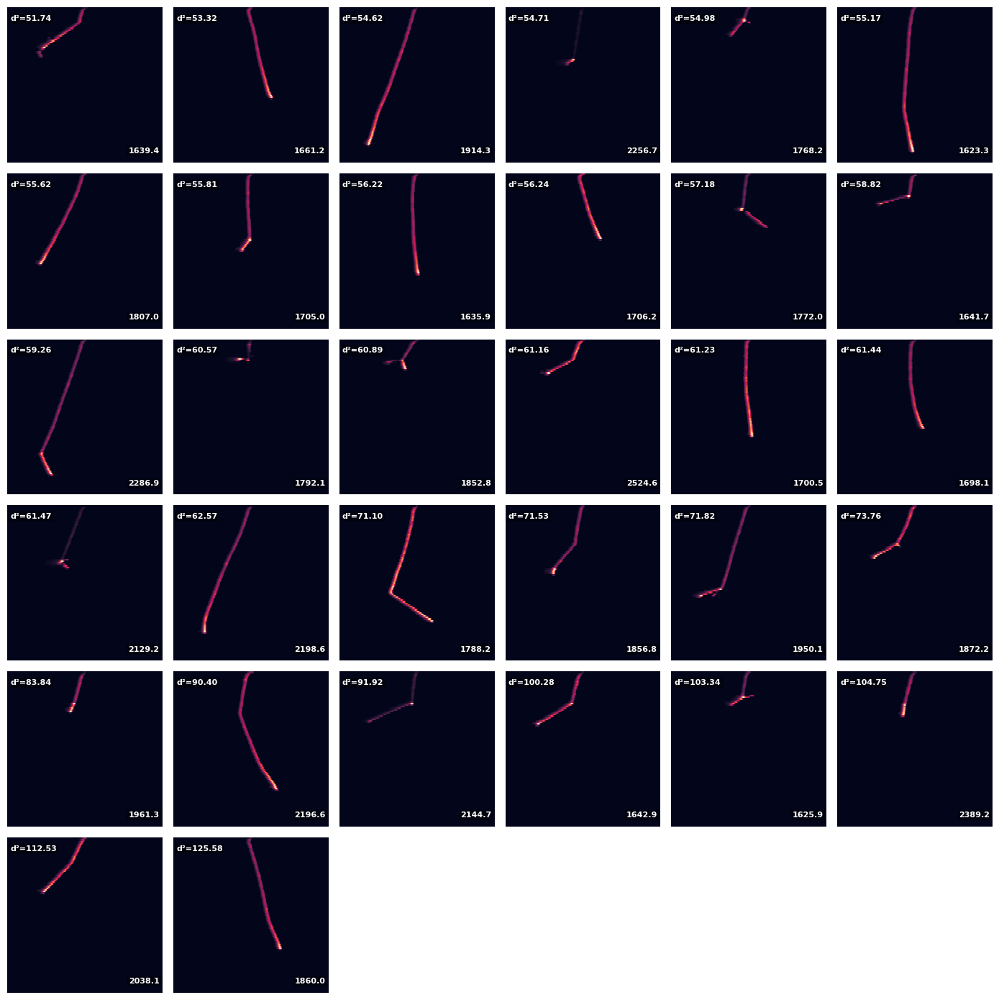

In [ ]:
# --- Parameters ---
num_images = 32
grid_size = int(np.ceil(np.sqrt(num_images)))

# Identify which query entries are references (exact or near match)
def find_reference_indices(refs, queries, tol=1e-8):
    ref_set = set()
    for i, q in enumerate(queries):
        if np.any(np.all(np.isclose(refs, q[None, :], atol=tol), axis=1)):
            ref_set.add(i)
    return np.array(sorted(ref_set))

ref_indices_in_queries = find_reference_indices(l, latent_vectors_d)
print(f"{len(ref_indices_in_queries)} reference vectors detected inside queries.")

# --- Exclude refs from sorting ---
valid_mask = np.ones(len(latent_vectors_d), dtype=bool)
valid_mask[ref_indices_in_queries] = False

valid_indices = np.where(valid_mask)[0]
valid_d2 = best_d2[valid_indices]
valid_p = p_values[valid_indices]
valid_images = deutimages[valid_indices]

# --- Sort remaining (non-reference) samples by Mahalanobis distance ---
idx_sorted = np.argsort(valid_d2)
normal_idxs = valid_indices[idx_sorted[:num_images]]
anomalous_idxs = valid_indices[idx_sorted[-num_images:]]

print("Lowest Mahalanobis (non-ref):", normal_idxs)
print("Highest Mahalanobis (non-ref):", anomalous_idxs)


def plot_mahalanobis_examples(indices, title):
    """
    Plot decoded LArTPC images for given indices, annotated with Mahalanobis stats and candidate mass.
    """
    selected_images = deutimages[indices]
    selected_d2 = best_d2[indices]
    selected_p = p_values[indices]
    selected_m = d_m[indices]   # <-- include mass

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(14, 14))

    for i in range(grid_size * grid_size):
        ax = axes[i // grid_size, i % grid_size]
        if i < len(selected_images):
            sns.heatmap(selected_images[i, 1], ax=ax, cbar=False,
                        xticklabels=False, yticklabels=False)

            # --- Top-left: Mahalanobis distance ---
            ax.text(0.02, 0.95, f"d²={selected_d2[i]:.2f}",
                    transform=ax.transAxes,
                    fontsize=8, color='white', ha='left', va='top',
                    fontweight='bold',
                    bbox=dict(facecolor='black', alpha=0.4, lw=0, pad=1.5))

            # --- Bottom-left: p-value ---
            # ax.text(0.02, 0.05, f"p={selected_p[i]:.3f}",
            #         transform=ax.transAxes,
            #         fontsize=8, color='white', ha='left', va='bottom',
            #         fontweight='bold',
            #         bbox=dict(facecolor='black', alpha=0.4, lw=0, pad=1.5))

            # --- Bottom-right: candidate mass ---
            ax.text(0.98, 0.05, f"{selected_m[i]:.1f}",
                    transform=ax.transAxes,
                    fontsize=8, color='white', ha='right', va='bottom',
                    fontweight='bold',
                    bbox=dict(facecolor='black', alpha=0.4, lw=0, pad=1.5))

        else:
            ax.axis('off')

    # fig.suptitle(title, fontsize=12)
    plt.tight_layout()
    # plt.savefig('noise.png', dpi=1000)
    plt.show()


# --- Plot closest and most anomalous events ---
plot_mahalanobis_examples(normal_idxs, "Closest (non-reference) samples – low Mahalanobis distance")
plot_mahalanobis_examples(anomalous_idxs, "Most anomalous (non-reference) samples – high Mahalanobis distance")


46 reference vectors detected inside queries.
Randomly selected indices with d² in range [0.0, 3.0]: [1996  830  622 1203 2269 1101 1214  177 2124  512 2065 1004 1494 1396
  378 1446  381   33 1230 1267 1927 1898 1051 1475]


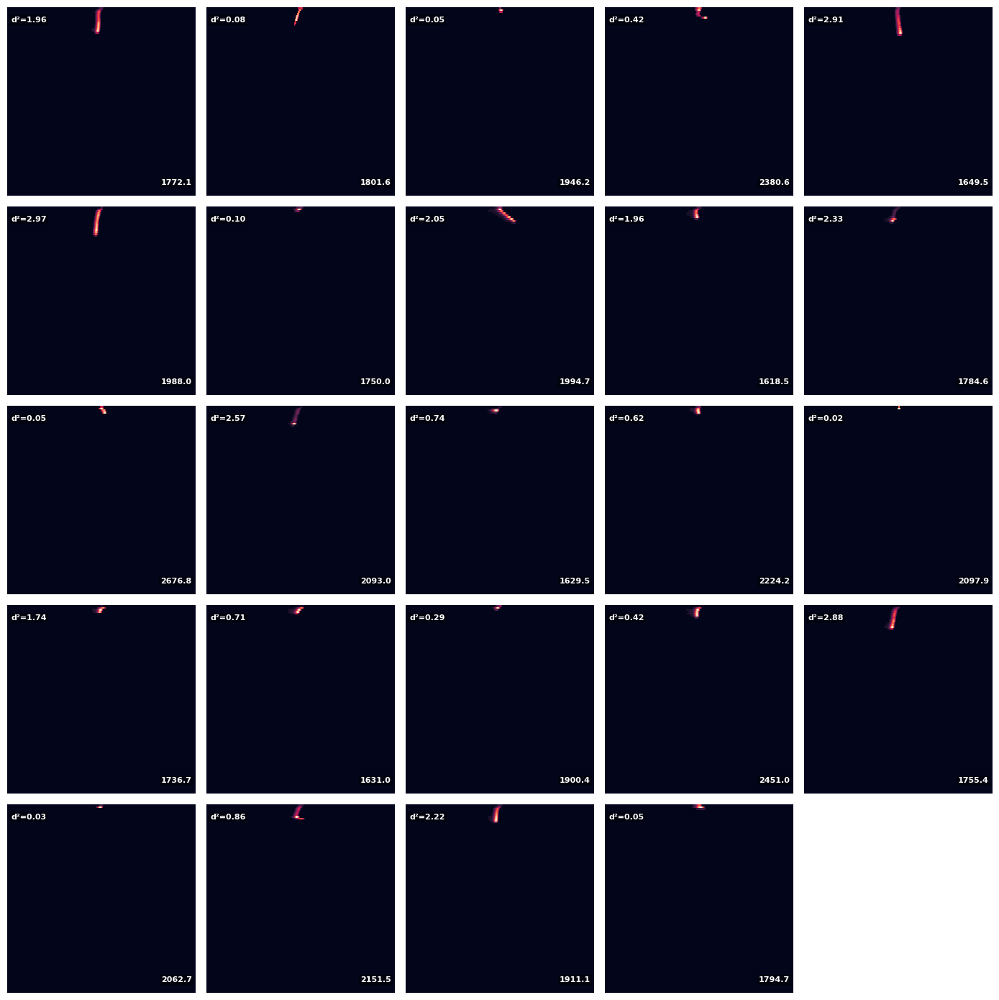

In [ ]:
# --- Parameters ---
num_images = 24
grid_size = int(np.ceil(np.sqrt(num_images)))

# Identify which query entries are references (exact or near match)
def find_reference_indices(refs, queries, tol=1e-8):
    ref_set = set()
    for i, q in enumerate(queries):
        if np.any(np.all(np.isclose(refs, q[None, :], atol=tol), axis=1)):
            ref_set.add(i)
    return np.array(sorted(ref_set))

ref_indices_in_queries = find_reference_indices(l, latent_vectors_d)
print(f"{len(ref_indices_in_queries)} reference vectors detected inside queries.")

# --- Exclude refs from sorting ---
valid_mask = np.ones(len(latent_vectors_d), dtype=bool)
valid_mask[ref_indices_in_queries] = False

valid_indices = np.where(valid_mask)[0]
valid_d2 = best_d2[valid_indices]
valid_p = p_values[valid_indices]
valid_images = deutimages[valid_indices]

# --- Filter by Mahalanobis distance range ---
def filter_by_d2_range(d2_values, indices, d2_min=None, d2_max=None):
    """
    Filter indices based on a range of Mahalanobis distances.
    """
    mask = np.ones(len(d2_values), dtype=bool)
    if d2_min is not None:
        mask &= (d2_values >= d2_min)
    if d2_max is not None:
        mask &= (d2_values <= d2_max)
    return indices[mask]

# Example: Set your desired range for Mahalanobis distance
d2_min = 0.0  # Minimum d² value (inclusive)
d2_max = 3.0  # Maximum d² value (inclusive)

filtered_indices = filter_by_d2_range(valid_d2, valid_indices, d2_min, d2_max)
filtered_d2 = best_d2[filtered_indices]
filtered_p = p_values[filtered_indices]
filtered_images = deutimages[filtered_indices]

# --- Randomly select a subset of filtered samples ---
if len(filtered_indices) > num_images:
    selected_indices = np.random.choice(filtered_indices, size=num_images, replace=False)
else:
    selected_indices = filtered_indices

print(f"Randomly selected indices with d² in range [{d2_min}, {d2_max}]:", selected_indices)

def plot_mahalanobis_examples(indices, title):
    """
    Plot decoded LArTPC images for given indices, annotated with Mahalanobis stats and candidate mass.
    """
    selected_images = deutimages[indices]
    selected_d2 = best_d2[indices]
    selected_p = p_values[indices]
    selected_m = d_m[indices]   # <-- include mass

    fig, axes = plt.subplots(grid_size, grid_size, figsize=(14, 14))

    for i in range(grid_size * grid_size):
        ax = axes[i // grid_size, i % grid_size]
        if i < len(selected_images):
            sns.heatmap(selected_images[i, 1], ax=ax, cbar=False,
                        xticklabels=False, yticklabels=False)

            # --- Top-left: Mahalanobis distance ---
            ax.text(0.02, 0.95, f"d²={selected_d2[i]:.2f}",
                    transform=ax.transAxes,
                    fontsize=8, color='white', ha='left', va='top',
                    fontweight='bold',
                    bbox=dict(facecolor='black', alpha=0.4, lw=0, pad=1.5))

            # # --- Bottom-left: p-value ---
            # ax.text(0.02, 0.05, f"p={selected_p[i]:.3f}",
            #         transform=ax.transAxes,
            #         fontsize=8, color='white', ha='left', va='bottom',
            #         fontweight='bold',
            #         bbox=dict(facecolor='black', alpha=0.4, lw=0, pad=1.5))

            # --- Bottom-right: candidate mass ---
            ax.text(0.98, 0.05, f"{selected_m[i]:.1f}",
                    transform=ax.transAxes,
                    fontsize=8, color='white', ha='right', va='bottom',
                    fontweight='bold',
                    bbox=dict(facecolor='black', alpha=0.4, lw=0, pad=1.5))

        else:
            ax.axis('off')

    plt.tight_layout()
    plt.show()

# --- Plot randomly selected events ---
plot_mahalanobis_examples(selected_indices, f"Randomly selected samples with d² in range [{d2_min}, {d2_max}]")

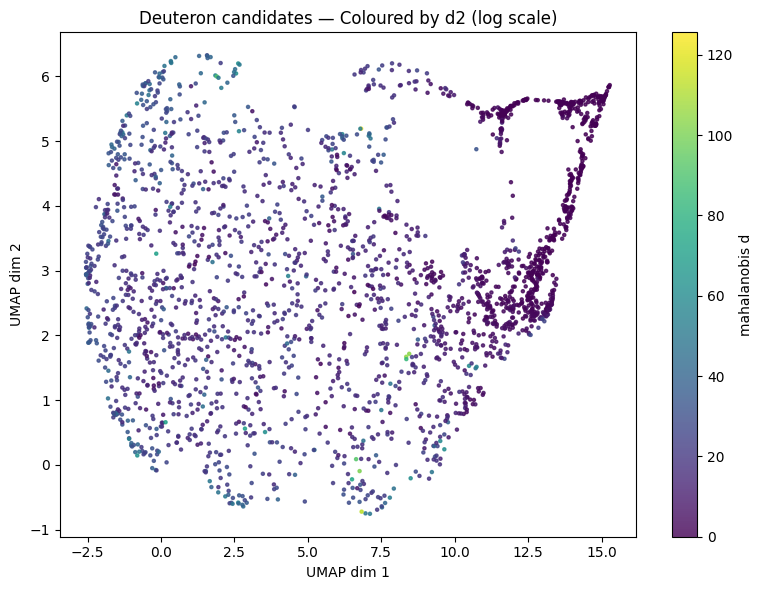

In [ ]:
from matplotlib.colors import LogNorm

fig = plt.figure(figsize=(8, 6))

# Scatter plot coloured by cluster length on a log scale
sc = plt.scatter(
    E_d[:, 0], E_d[:, 1],
    c=best_d2, cmap='viridis',
    # norm=LogNorm(),  # <-- log scale
    s=5, alpha=0.8
)

# Add a colourbar to indicate cluster length
cbar = plt.colorbar(sc)
cbar.set_label("mahalanobis d")

plt.title("Deuteron candidates — Coloured by d2 (log scale)")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
plt.show()


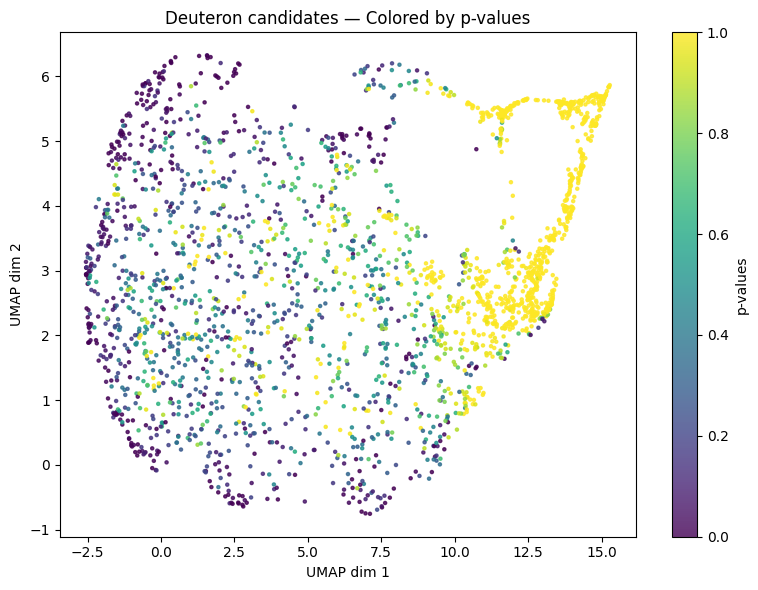

In [ ]:
fig = plt.figure(figsize=(8, 6))

# Scatter plot colored by cluster length
sc = plt.scatter(E_d[:, 0], E_d[:, 1],
                 c=p_values, cmap='viridis', s=5, alpha=0.8)

# Add a colorbar to indicate cluster length
cbar = plt.colorbar(sc)
cbar.set_label("p-values")

plt.title("Deuteron candidates — Colored by p-values")
plt.xlabel("UMAP dim 1")
plt.ylabel("UMAP dim 2")
plt.tight_layout()
plt.show()

# COMPARING WITH SCORES FOR PROTONS

In [ ]:
res_p = score_against_references(l, latent_vectors, cov_fit='all', also_cosine=True)

# Per-query best match (Mahalanobis)
nearest_ref_p = res_p["nearest_ref_index"]      # (2529,)
best_d2_p     = res_p["nearest_maha_d2"]        # squared distance
p_values_p    = res_p["nearest_p_value"]        # small p => unusual w.r.t. Σ

# Example: flag queries that are unlikely under the reference distribution
alpha = 0.01
anomalous_mask_p = p_values_p < alpha
anomalous_indices = np.where(anomalous_mask_p)[0]

# If you also want cosine-based nearest
nearest_ref_cos_p = res_p["nearest_ref_index_cos"]
best_cos_p        = res_p["nearest_cos_dist"]


/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/linalg/_basic.py:1742: RuntimeWarning: divide by zero encountered in matmul
  B = (u * psigma_diag) @ u.conj().T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/linalg/_basic.py:1742: RuntimeWarning: overflow encountered in matmul
  B = (u * psigma_diag) @ u.conj().T
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/linalg/_basic.py:1742: RuntimeWarning: invalid value encountered in matmul
  B = (u * psigma_diag) @ u.conj().T
/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_52256/746596412.py:21: RuntimeWarning: divide by zero encountered in matmul
  precision = (eigvecs @ np.diag(1.0 / eigvals) @ eigvecs.T)
/var/folders/cm/m55y72dj6cd5lkwrfdb2bpnr0000gp/T/ipykernel_52256/746596412.py:21: RuntimeWarning: overflow encountered in matmul
  precision = (eigvecs @ np.diag(1.0 / eigvals) @ eigvecs.T)
/var/folders/cm/m55y72dj6cd5lkwrf

/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: overflow encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: invalid value encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: divide by zero encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.venv/lib/python3.11/site-packages/scipy/_lib/_util.py:1272: RuntimeWarning: overflow encountered in vecdot
  return np.vecdot(x1, x2, axis=axis)
/Users/user/code/research/proton-deuteron/.

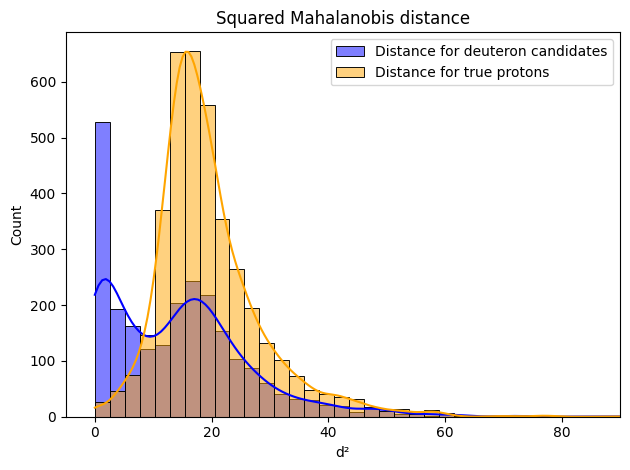

In [ ]:
bins = np.linspace(0, 100, 40)
sns.histplot(best_d2, bins=bins, kde=True, color='blue', label='Distance for deuteron candidates')
sns.histplot(best_d2_p, bins=bins, kde=True, color='orange', label='Distance for true protons')
plt.title("Squared Mahalanobis distance")
plt.xlabel("d²")
plt.ylabel("Count")
plt.legend()
plt.xlim(-5, 90)

plt.tight_layout()
# plt.savefig('Mahal.png', dpi=1000)
plt.show()


In [ ]:
x = np.where(best_d2_p < 2)
x

(array([ 207,  289,  339,  472,  617,  630,  641,  667, 1416, 1470, 1498,
        1575, 1923, 1928, 2137, 2322, 2866, 2997, 3009, 3312, 3313, 3385,
        3770, 3846]),)

In [ ]:
n = np.unique(nearest_ref_p[x])
n

array([ 5, 13, 16, 19, 20, 21, 22, 24, 31, 36, 41, 44, 45])

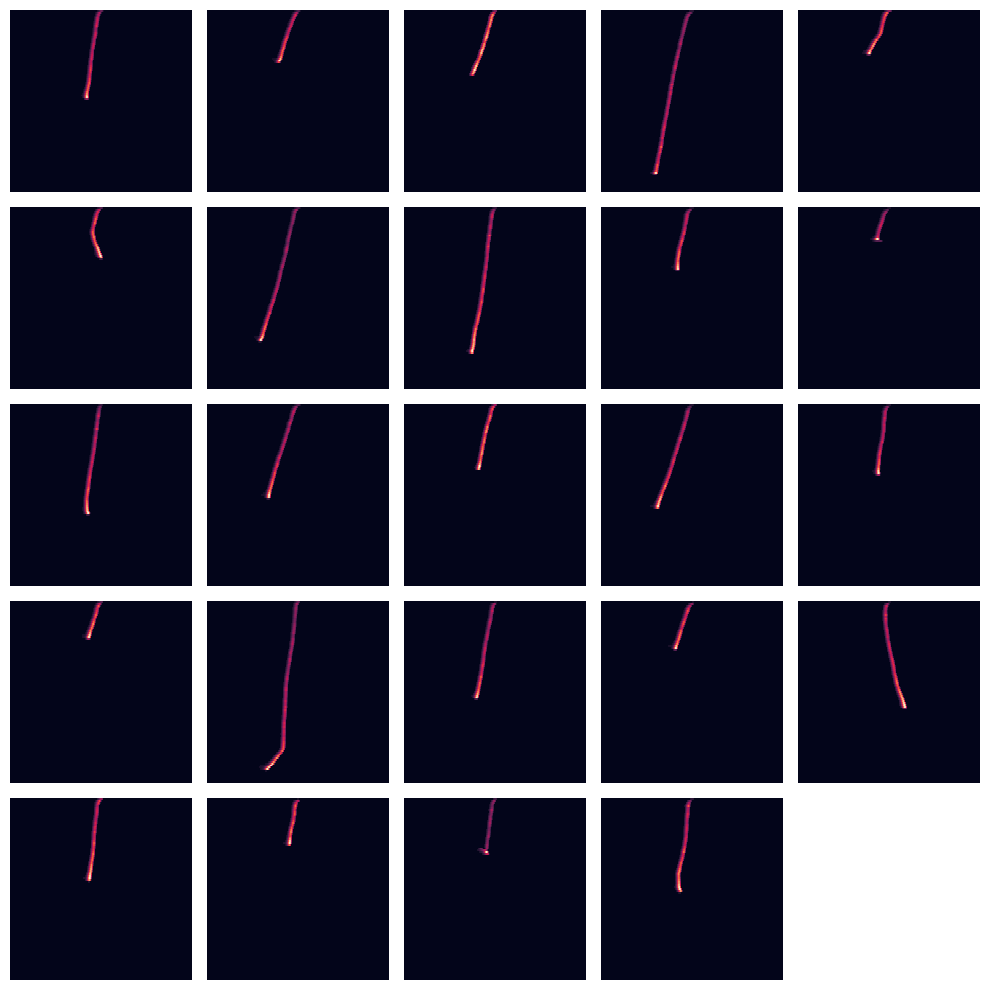

In [ ]:
num_images = len(x[0])  
grid_size = int(np.ceil(np.sqrt(num_images)))

selected_images = protimages[x]

fig, axes = plt.subplots(grid_size, grid_size, figsize=(10, 10))

for i in range(grid_size * grid_size):
    ax = axes[i // grid_size, i % grid_size]
    if i < len(selected_images):
        sns.heatmap(selected_images[i, 1], ax=ax, cbar=False, xticklabels=False, yticklabels=False)
    else:
        ax.axis('off')  # Turn off unused subplots

plt.tight_layout()
plt.show()

In [ ]:
best_d2.shape, d_m.shape

((2421,), (2421,))

(array([414., 136., 143., 108., 100., 103., 106.,  77.,  61.,  63.,  62.,
         50.,  62.,  52.,  43.,  43.,  55.,  46.,  34.,  35.,  30.,  44.,
         38.,  37.,  30.,  36.,  32.,  34.,  32.,  22.,  24.,  15.,  15.,
         15.,  13.,  17.,  18.,  14.,  13.,   9.,  10.,  13.,   9.,   7.,
         11.,   7.,   7.,   4.,   4.,  10.,   3.,   6.,   2.,   3.,   4.,
          2.,   6.,   1.,   4.,   1.,   3.,   1.,   3.,   1.,   1.,   3.,
          0.,   1.,   0.,   0.,   1.,   2.,   2.,   0.,   0.,   0.,   0.,
          1.,   1.,   0.,   0.,   2.,   0.,   0.,   0.,   1.,   0.,   0.,
          1.,   0.,   0.,   0.,   1.,   0.,   0.,   0.,   0.,   0.,   0.,
          1.]),
 array([ 0.        ,  0.86952621,  1.73905241,  2.60857868,  3.47810483,
         4.34763098,  5.21715736,  6.08668327,  6.95620966,  7.82573605,
         8.69526196,  9.56478786, 10.43431473, 11.30384064, 12.17336655,
        13.04289341, 13.91241932, 14.78194523, 15.65147209, 16.520998  ,
        17.39052391, 18.26

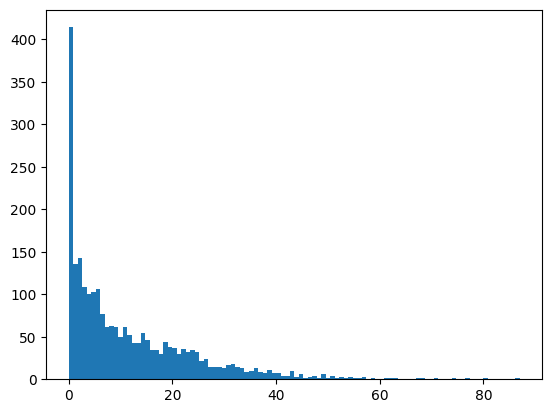

In [ ]:
plt.hist(best_d2, bins=100)

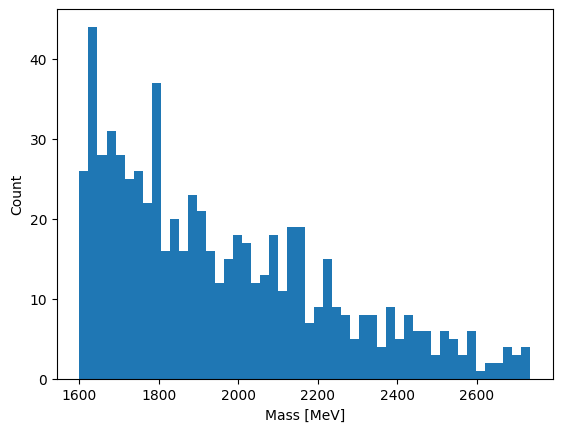

In [ ]:
i = np.where(best_d2 < 2.5)[0]
plt.hist(d_m[i], bins=50)
plt.xlabel('Mass [MeV]')
plt.ylabel('Count')
plt.show()

In [ ]:
deuteron_clusters = col[col['particle_type'] == 'deuteron']

In [ ]:
deuteron_clusters

,run,subrun,event,cluster_idx_ind,cluster_idx_col,d_min_c,d_max_c,d_min_r,d_max_r,d_h,...,aspect_ratio,compactness,image_intensity,matrix_transformed,column_maxes,p,m,beamline_mass,maxdiff,thetas
0,8557,4,473,0,0,41,68,12,15,3,...,20.750000,0.463102,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[0.0, -0.0, -0.0, 0.0, -0.0, -0.0, 16.0, 0.0]...","[23.0, 158.0, 295.0, 410.0, 353.0, 403.0, 411....",0,1,2734.40,0.333333,-85.683972
18,8557,90,4333,0,0,30,65,-4,0,4,...,5.384615,0.236745,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[16.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, 0....","[22.0, 78.0, 104.0, 175.0, 171.0, 156.0, 168.0...",0,1,1738.95,0.138132,77.471192
21,8557,97,4665,0,1,27,76,16,13,-3,...,4.000000,0.182253,"[[-0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0...","[[16.0, -0.0, -0.0, 0.0, -0.0, -0.0, -0.0, 0.0...","[192.0, 162.0, 150.0, 158.0, 187.0, 204.0, 178...",0,1,2062.70,0.231203,71.754145
30,8557,128,5986,4,4,35,77,-8,-7,1,...,17.000000,0.474265,"[[0.0, 0.0, 0.0, -0.0, 0.0, -0.0, -0.0, -0.0, ...","[[16.0, -0.0, 0.0, -0.0, -0.0, -0.0, -0.0, -0....","[70.0, 164.0, 254.0, 315.0, 351.0, 443.0, 486....",0,0,1656.84,0.193416,84.359451
31,8557,128,6010,0,0,14,47,-7,-7,0,...,3.214286,0.325298,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[16.0, 0.0, -0.0, -0.0, -0.0, 0.0, -0.0, -0.0...","[42.0, 97.0, 106.0, 96.0, 133.0, 109.0, 108.0,...",0,1,2146.39,0.375000,68.338849
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9184,9788,258,22697,2,0,14,73,-6,-6,0,...,2.662791,0.232863,"[[-0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0.0, -0...","[[16.0, 0.0, -0.0, -0.0, -0.0, 0.0, 0.0, 0.0, ...","[69.0, 107.0, 69.0, 83.0, 74.0, 73.0, 71.0, 74...",0,0,2118.56,0.465649,60.819194
9185,9788,266,23333,0,0,18,71,-3,-2,1,...,18.500000,0.563063,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[16.0, -0.0, -0.0, 0.0, -0.0, 0.0], [17.0, -0...","[78.0, 139.0, 191.0, 259.0, 223.0, 21.0]",0,0,2031.27,0.262548,82.405357
9187,9788,268,23513,5,0,11,105,-7,-11,-4,...,4.333333,0.163097,"[[0.0, -0.0, 0.0, 0.0, 0.0, 0.0, 0.0, -0.0, 0....","[[16.0, -0.0, 0.0, -0.0, -0.0, -0.0, 0.0, -0.0...","[54.0, 83.0, 117.0, 77.0, 107.0, 67.0, 73.0, 8...",0,0,1787.56,0.157143,71.131001
9192,9788,299,26200,0,1,10,59,0,-1,-1,...,3.791667,0.628205,"[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...","[[16.0, 0.0, -0.0, -0.0, -0.0, 0.0, -0.0, -0.0...","[33.0, 121.0, 142.0, 126.0, 123.0, 148.0, 135....",0,0,1675.37,0.293333,57.724356


In [ ]:
counts = deuteron_clusters[['run', 'subrun', 'event']].value_counts().reset_index(name='frequency')

In [ ]:
counts = pd.merge(
    counts, 
    deuteron_clusters[['run', 'subrun', 'event', 'beamline_mass']],
    how='left',
    on=['run', 'subrun', 'event']
)

In [ ]:
counts

,run,subrun,event,frequency,beamline_mass
0,9509,245,23164,2,2705.48
1,9509,245,23164,2,2705.48
2,9488,137,11142,2,1636.41
3,9488,137,11142,2,1636.41
4,8684,246,26676,2,1639.39
...,...,...,...,...,...
2416,8689,123,11219,1,2191.90
2417,8689,147,13479,1,2575.43
2418,8689,151,13856,1,1906.81
2419,8689,184,17024,1,1808.71


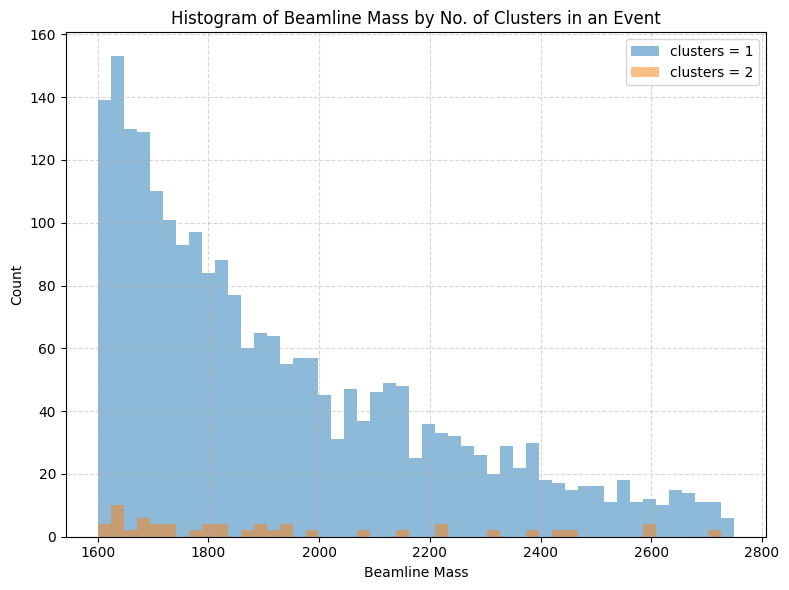

In [ ]:
bins = np.linspace(1600, 2750, 50)

frequencies = sorted(counts['frequency'].unique())

plt.figure(figsize=(8, 6))

for freq in frequencies:
    subset = counts[counts['frequency'] == freq]
    plt.hist(subset['beamline_mass'], bins=bins, alpha=0.5, label=f'clusters = {freq}')

plt.xlabel('Beamline Mass')
plt.ylabel('Count')
plt.title('Histogram of Beamline Mass by No. of Clusters in an Event')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


<Axes: >

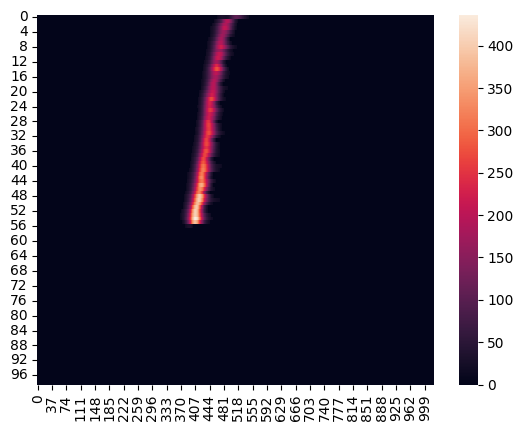

In [ ]:
sns.heatmap(protimages[0][0])